# A) Background, Task, Goal And Objectives

## Background

Mr. Adi adalah seorang analis data baru di perusahaan startup fiktif bernama Tanam Vulus di Indonesia. Pada akhir September 2021, perusahaan ini fokus pada investasi reksa dana melalui aplikasi seluler. Di dalam aplikasi ini, pengguna dapat mendaftar sebagai investor dan melakukan transaksi jual beli pada reksa dana tertentu. Selain itu, platform ini juga menawarkan layanan robo-investing, yang memungkinkan pengguna berinvestasi dalam portofolio reksa dana yang sudah terdiversifikasi tanpa repot, dengan mempertimbangkan faktor-faktor seperti usia, pendapatan, dan profil risiko keseluruhan.

Pada minggu kedua bulan Oktober, perusahaan akan memperluas produk investasinya dengan menambahkan produk obligasi pemerintah, selain produk reksa dana yang sudah ada. Tim pemasaran dan penjualan ingin menjalankan kampanye komunikasi tematis untuk produk baru yang akan datang, tetapi mereka ingin menyesuaikan kampanye ini untuk beberapa segmen yang relevan.

Tugas Anda adalah membantu dalam menganalisis data dan informasi yang ada untuk membantu tim pemasaran dan penjualan dalam merancang kampanye komunikasi yang sesuai dengan kebutuhan segmen pasar yang berbeda. Anda akan menggunakan data untuk memahami profil dan preferensi pelanggan potensial, sehingga tim dapat menciptakan pesan dan strategi pemasaran yang efektif untuk masing-masing segmen tersebut.

## Goal And Objectives

Tujuan dari analisis ini adalah untuk memberikan segmentasi untuk produk investasi baru (Obligasi Pemerintah) dan memberikan rekomendasi komunikasi untuk tema kampanye.

Saat ini, tujuan analisis ini adalah:

1. Membaca data pertama-tama untuk memahami dataset dengan baik.
2. Membersihkan dataset untuk mendapatkan pemahaman atau hasil yang lebih baik.
3. Mengeksplorasi dataset yang telah dibersihkan untuk memberikan wawasan kunci tentang karakteristik klien.
4. Membuat segmentasi klien berdasarkan dataset yang telah dibersihkan.

# B) Libraries

In [1]:
!pip install plotly

In [2]:
!pip install yellowbrick

In [3]:
!pip install tensorflow

In [4]:
!pip install tensorflow_decision_forests

In [5]:
pip install category_encoders

Note: you may need to restart the kernel to use updated packages.


In [6]:
import pandas as pd  # Kami menggunakan ini untuk struktur data yang cepat, fleksibel, dan ekspresif yang dirancang untuk memudahkan penggunaan data terkait atau berlabel.
import numpy as np  # Numpy singkatan dari numerical python, kami menggunakan ini untuk menyediakan dukungan untuk objek array multidimensi besar dan berbagai alat untuk bekerja dengannya.
from datetime import datetime  # Kami menggunakan ini karena fungsi bawaannya yang disebut to_datetime() yang mengonversi tanggal dan waktu dalam format string menjadi objek DateTime.
from datetime import timedelta  # Kami menggunakan ini untuk menghitung perbedaan tanggal dan juga dapat digunakan untuk manipulasi tanggal di Python.
import matplotlib.pyplot as plt  # Kami menggunakan ini untuk visualisasi data dan perpustakaan plot grafis untuk Python dan ekstensi numeriknya NumPy.
import seaborn as sns  # Mirip dengan matplotlib, tetapi memiliki estetika yang lebih baik.
import plotly as px  # Library untuk visualisasi data interaktif.
from yellowbrick.cluster import SilhouetteVisualizer  # Ini digunakan untuk visualisasi siluet untuk analisis klaster.
pd.set_option('display.float_format', lambda x: '%.2f' % x)  # Kami mengatur ini terlebih dahulu agar data floating (desimal) hanya berakhir dengan 2 angka setelah nol.

#for clustering
from sklearn.cluster import KMeans  # Digunakan untuk melakukan algoritma k-means.
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler  # Digunakan untuk penskalaan atribut yang berbeda.
from sklearn import cluster  # Untuk pembelajaran mesin dan pemodelan statistik (digunakan untuk pengelompokan).

import matplotlib.cm as cm  # Memberikan sejumlah besar peta warna (colormaps).
from sklearn.metrics import silhouette_samples, silhouette_score  # Digunakan untuk melakukan analisis siluet.
from sklearn.datasets import make_blobs  # Membuat blob Gaussian isotropik untuk pengelompokan.

#deep learning for regression
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2
from tensorflow_decision_forests.keras import RandomForestModel

print(f"Found TensorFlow version: {tf.__version__}")

#machine learning learning for regression
from scipy import stats
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import category_encoders as ce
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn import svm
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import norm  # Add this line to import norm.

import statsmodels.api as sm  # Untuk memeriksa nilai p untuk regresi logistik.

2024-01-02 00:25:22.628503: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-01-02 00:25:22.671555: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-02 00:25:22.671616: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-02 00:25:22.673062: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-02 00:25:22.680577: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-01-02 00:25:22.681809: I tensorflow/core/platform/cpu_feature_guard.cc:1

Found TensorFlow version: 2.15.0


# **C) Data Cleaning**

## **Data Collection**

In [7]:
# mengumpulkan data
df = pd.read_csv("/datasets/clusteringdata/users.csv")
df.sort_values(by=["user_id"])

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source
13054,43195,2021-10-03 21:37:55,Female,36,Pengusaha,> Rp 50 Juta - 100 Juta,NaN,Keuntungan Bisnis
7945,47757,2021-10-02 18:44:56,Male,25,Swasta,> Rp 50 Juta - 100 Juta,NaN,Gaji
9949,50701,2021-08-24 23:57:43,Female,28,IRT,Rp 10 Juta - 50 Juta,NaN,Gaji
12274,50961,2021-08-20 16:22:29,Female,33,Swasta,> Rp 100 Juta - 500 Juta,NaN,Gaji
9251,51883,2021-09-29 12:06:17,Male,27,Pelajar,> Rp 50 Juta - 100 Juta,NaN,Gaji
...,...,...,...,...,...,...,...,...
13672,4457509,2021-10-27 12:13:23,Male,39,Swasta,Rp 10 Juta - 50 Juta,used referral,Gaji
13957,4457532,2021-10-27 12:13:22,Female,41,Swasta,< 10 Juta,NaN,Gaji
14342,4457596,2021-10-27 12:13:21,Female,44,IRT,> Rp 50 Juta - 100 Juta,used referral,Keuntungan Bisnis
8726,4457622,2021-10-27 12:35:21,Male,26,Pelajar,> Rp 50 Juta - 100 Juta,used referral,Gaji


## **Data Exploring**

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14712 entries, 0 to 14711
Data columns (total 8 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   user_id                       14712 non-null  int64 
 1   registration_import_datetime  14712 non-null  object
 2   user_gender                   14712 non-null  object
 3   user_age                      14712 non-null  int64 
 4   user_occupation               14712 non-null  object
 5   user_income_range             14712 non-null  object
 6   referral_code_used            5604 non-null   object
 7   user_income_source            14712 non-null  object
dtypes: int64(2), object(6)
memory usage: 919.6+ KB


In [9]:
#ubah data user_id menjadi string
df['user_id'] = df['user_id'].astype(str)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14712 entries, 0 to 14711
Data columns (total 8 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   user_id                       14712 non-null  object
 1   registration_import_datetime  14712 non-null  object
 2   user_gender                   14712 non-null  object
 3   user_age                      14712 non-null  int64 
 4   user_occupation               14712 non-null  object
 5   user_income_range             14712 non-null  object
 6   referral_code_used            5604 non-null   object
 7   user_income_source            14712 non-null  object
dtypes: int64(1), object(7)
memory usage: 919.6+ KB


In [10]:
df['registration_import_datetime'] = pd.to_datetime(df['registration_import_datetime'])
df

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source
0,162882,2021-09-17 14:10:44,Female,51,Swasta,> Rp 500 Juta - 1 Miliar,NaN,Gaji
1,3485491,2021-10-09 11:11:34,Female,55,Others,> Rp 50 Juta - 100 Juta,NaN,Gaji
2,1071649,2021-10-08 01:27:30,Male,50,Swasta,Rp 10 Juta - 50 Juta,NaN,Gaji
3,3816789,2021-08-12 07:19:32,Female,53,IRT,> Rp 50 Juta - 100 Juta,NaN,Gaji
4,3802293,2021-08-15 09:31:24,Female,47,PNS,> Rp 500 Juta - 1 Miliar,used referral,Gaji
...,...,...,...,...,...,...,...,...
14707,4352347,2021-10-17 15:57:23,Male,49,Swasta,> Rp 100 Juta - 500 Juta,NaN,Gaji
14708,4288026,2021-10-15 12:44:05,Female,49,Pengusaha,> Rp 100 Juta - 500 Juta,NaN,Lainnya
14709,4286882,2021-10-11 10:06:15,Female,49,Swasta,> Rp 100 Juta - 500 Juta,NaN,Dari Suami / istri
14710,4396739,2021-10-21 13:42:20,Male,49,Swasta,> Rp 100 Juta - 500 Juta,NaN,Gaji


In [11]:
#MELIHAT KEMBALI DATANYA
df.head()

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source
0,162882,2021-09-17 14:10:44,Female,51,Swasta,> Rp 500 Juta - 1 Miliar,NaN,Gaji
1,3485491,2021-10-09 11:11:34,Female,55,Others,> Rp 50 Juta - 100 Juta,NaN,Gaji
2,1071649,2021-10-08 01:27:30,Male,50,Swasta,Rp 10 Juta - 50 Juta,NaN,Gaji
3,3816789,2021-08-12 07:19:32,Female,53,IRT,> Rp 50 Juta - 100 Juta,NaN,Gaji
4,3802293,2021-08-15 09:31:24,Female,47,PNS,> Rp 500 Juta - 1 Miliar,used referral,Gaji


## Step 3 Menghandle data yang kosong dan data manipulation

### Checking Data Null

In [12]:
df.isna().sum()

user_id                            0
registration_import_datetime       0
user_gender                        0
user_age                           0
user_occupation                    0
user_income_range                  0
referral_code_used              9108
user_income_source                 0
dtype: int64

In [13]:
#Mari kita isi nilai null pada referral_code_used , tapi pertama-tama mari kita lihat nilai uniknya terlebih dahulu
df['referral_code_used'].unique().tolist()

[nan, 'used referral']

In [14]:
df.duplicated().sum()

0

## Fillna data menggunakan mode dari data yang null

In [15]:
#Since its only two unique value, lets try and change it to Boolean, but first we need to change its value first
replaced_data = df.copy()

#fill the null value with 0 first
replaced_data['referral_code_used'] = replaced_data['referral_code_used'].fillna('0')

#change the string value to a numerical value too
replaced_data['referral_code_used'] = replaced_data['referral_code_used'].str.replace('used referral', '1')
replaced_data

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source
0,162882,2021-09-17 14:10:44,Female,51,Swasta,> Rp 500 Juta - 1 Miliar,0,Gaji
1,3485491,2021-10-09 11:11:34,Female,55,Others,> Rp 50 Juta - 100 Juta,0,Gaji
2,1071649,2021-10-08 01:27:30,Male,50,Swasta,Rp 10 Juta - 50 Juta,0,Gaji
3,3816789,2021-08-12 07:19:32,Female,53,IRT,> Rp 50 Juta - 100 Juta,0,Gaji
4,3802293,2021-08-15 09:31:24,Female,47,PNS,> Rp 500 Juta - 1 Miliar,1,Gaji
...,...,...,...,...,...,...,...,...
14707,4352347,2021-10-17 15:57:23,Male,49,Swasta,> Rp 100 Juta - 500 Juta,0,Gaji
14708,4288026,2021-10-15 12:44:05,Female,49,Pengusaha,> Rp 100 Juta - 500 Juta,0,Lainnya
14709,4286882,2021-10-11 10:06:15,Female,49,Swasta,> Rp 100 Juta - 500 Juta,0,Dari Suami / istri
14710,4396739,2021-10-21 13:42:20,Male,49,Swasta,> Rp 100 Juta - 500 Juta,0,Gaji


In [16]:
replaced_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14712 entries, 0 to 14711
Data columns (total 8 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   user_id                       14712 non-null  object        
 1   registration_import_datetime  14712 non-null  datetime64[ns]
 2   user_gender                   14712 non-null  object        
 3   user_age                      14712 non-null  int64         
 4   user_occupation               14712 non-null  object        
 5   user_income_range             14712 non-null  object        
 6   referral_code_used            14712 non-null  object        
 7   user_income_source            14712 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(6)
memory usage: 919.6+ KB


In [17]:
# Mengubah tipe data kolom 'referral_code_used' menjadi numerik terlebih dahulu
replaced_data['referral_code_used'] = pd.to_numeric(replaced_data['referral_code_used'])

# Kemudian, setelah menjadi numerik, kita dapat dengan mudah mengubahnya menjadi tipe data boolean
replaced_data['referral_code_used'] = replaced_data['referral_code_used'].astype('bool')

# Sekarang, nilai pada kolom 'referral_code_used' telah menjadi tipe data boolean
replaced_data

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source
0,162882,2021-09-17 14:10:44,Female,51,Swasta,> Rp 500 Juta - 1 Miliar,False,Gaji
1,3485491,2021-10-09 11:11:34,Female,55,Others,> Rp 50 Juta - 100 Juta,False,Gaji
2,1071649,2021-10-08 01:27:30,Male,50,Swasta,Rp 10 Juta - 50 Juta,False,Gaji
3,3816789,2021-08-12 07:19:32,Female,53,IRT,> Rp 50 Juta - 100 Juta,False,Gaji
4,3802293,2021-08-15 09:31:24,Female,47,PNS,> Rp 500 Juta - 1 Miliar,True,Gaji
...,...,...,...,...,...,...,...,...
14707,4352347,2021-10-17 15:57:23,Male,49,Swasta,> Rp 100 Juta - 500 Juta,False,Gaji
14708,4288026,2021-10-15 12:44:05,Female,49,Pengusaha,> Rp 100 Juta - 500 Juta,False,Lainnya
14709,4286882,2021-10-11 10:06:15,Female,49,Swasta,> Rp 100 Juta - 500 Juta,False,Dari Suami / istri
14710,4396739,2021-10-21 13:42:20,Male,49,Swasta,> Rp 100 Juta - 500 Juta,False,Gaji


## Encoding Dataset

In [18]:
# Mengganti label pada kolom 'user_occupation' agar lebih mudah dibedakan
replaced_data['user_occupation'] = replaced_data['user_occupation'].replace(["Swasta","IRT",
                                                                              "PNS","Pengusaha","Pensiunan","TNI/Polisi","Guru","Pelajar"],
                                                                             ["Swasta","IRT",'PNS','Pengusaha','Pensiunan','TNI/Polisi','Guru','Pelajar'])


#lets change the income range label so we could distinguish it easily
replaced_data['user_income_range'] = replaced_data['user_income_range'].replace(["< 10 Juta","Rp 10 Juta - 50 Juta","> Rp 50 Juta - 100 Juta",
                                                                              "> Rp 100 Juta - 500 Juta","> Rp 500 Juta - 1 Miliar","> Rp 1 Miliar"],
                                                                             ["A (Under 10 Mil)","B (10 Mil to 50 Mil)",'C (50 Mil to 100 Mil)','D (100 Mil to 500 Mil)','E (500 Mil to 1 Bil)','F (Over 1 Bil)'])


replaced_data['user_income_source'] = replaced_data['user_income_source'].replace(['Gaji', 'Keuntungan Bisnis', 'Lainnya', 'Dari Orang Tua / Anak',
                                                                                         'Undian', 'Tabungan', 'Warisan', 'Hasil Investasi','Dari Suami / istri', 'Bunga Simpanan'],
                                                                                        ['Salary', 'Business Profit', 'Others', 'From Family',
                                                                                         'Others', 'Savings or Investment', 'From Family', 'Savings or Investment','From Family', 'Savings or Investment'])

In [19]:
replaced_data

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source
0,162882,2021-09-17 14:10:44,Female,51,Swasta,E (500 Mil to 1 Bil),False,Salary
1,3485491,2021-10-09 11:11:34,Female,55,Others,C (50 Mil to 100 Mil),False,Salary
2,1071649,2021-10-08 01:27:30,Male,50,Swasta,B (10 Mil to 50 Mil),False,Salary
3,3816789,2021-08-12 07:19:32,Female,53,IRT,C (50 Mil to 100 Mil),False,Salary
4,3802293,2021-08-15 09:31:24,Female,47,PNS,E (500 Mil to 1 Bil),True,Salary
...,...,...,...,...,...,...,...,...
14707,4352347,2021-10-17 15:57:23,Male,49,Swasta,D (100 Mil to 500 Mil),False,Salary
14708,4288026,2021-10-15 12:44:05,Female,49,Pengusaha,D (100 Mil to 500 Mil),False,Others
14709,4286882,2021-10-11 10:06:15,Female,49,Swasta,D (100 Mil to 500 Mil),False,From Family
14710,4396739,2021-10-21 13:42:20,Male,49,Swasta,D (100 Mil to 500 Mil),False,Salary


In [20]:
replaced_data.isna().sum()

user_id                         0
registration_import_datetime    0
user_gender                     0
user_age                        0
user_occupation                 0
user_income_range               0
referral_code_used              0
user_income_source              0
dtype: int64

In [21]:
replaced_data.duplicated().sum()

0

## Check Data yang typo pada dataset

In [22]:
unique_user = replaced_data.copy()
print('Unique nilai dari user_gender: ',unique_user['user_gender'].unique().tolist())
print('Unique nilai dari user_occupation: ',unique_user['user_occupation'].unique().tolist())
print('Unique nilai dari user_income_range: ',unique_user['user_income_range'].unique().tolist())
print('Unique nilai dari user_income_source: ',unique_user['user_income_source'].unique().tolist())

Unique nilai dari user_gender:  ['Female', 'Male']
Unique nilai dari user_occupation:  ['Swasta', 'Others', 'IRT', 'PNS', 'Pengusaha', 'Pensiunan', 'TNI/Polisi', 'Guru', 'Pelajar']
Unique nilai dari user_income_range:  ['E (500 Mil to 1 Bil)', 'C (50 Mil to 100 Mil)', 'B (10 Mil to 50 Mil)', 'A (Under 10 Mil)', 'D (100 Mil to 500 Mil)', 'F (Over 1 Bil)']
Unique nilai dari user_income_source:  ['Salary', 'Business Profit', 'Others', 'From Family', 'Savings or Investment']


In [23]:
#it seems data was clean enough, and i dont do outlier check on user_age because of old people are common to have investments too
user_clean = unique_user.copy()

user_clean.info() #this is the cleaned dataframe for user table
user_clean.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14712 entries, 0 to 14711
Data columns (total 8 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   user_id                       14712 non-null  object        
 1   registration_import_datetime  14712 non-null  datetime64[ns]
 2   user_gender                   14712 non-null  object        
 3   user_age                      14712 non-null  int64         
 4   user_occupation               14712 non-null  object        
 5   user_income_range             14712 non-null  object        
 6   referral_code_used            14712 non-null  bool          
 7   user_income_source            14712 non-null  object        
dtypes: bool(1), datetime64[ns](1), int64(1), object(5)
memory usage: 819.1+ KB


,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source
0,162882,2021-09-17 14:10:44,Female,51,Swasta,E (500 Mil to 1 Bil),False,Salary
1,3485491,2021-10-09 11:11:34,Female,55,Others,C (50 Mil to 100 Mil),False,Salary
2,1071649,2021-10-08 01:27:30,Male,50,Swasta,B (10 Mil to 50 Mil),False,Salary
3,3816789,2021-08-12 07:19:32,Female,53,IRT,C (50 Mil to 100 Mil),False,Salary
4,3802293,2021-08-15 09:31:24,Female,47,PNS,E (500 Mil to 1 Bil),True,Salary


# Cleaning Dataset Pada data set 'USER BALANCE'

In [24]:
user_balance = pd.read_csv("/datasets/userbalance/daily_user_balance_sep21.csv",delimiter=',')
user_balance

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount
0,50701,2021-08-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10132277.00,10000000.00,NaN
1,50701,2021-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10206945.00,10000000.00,0.00
2,50701,2021-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9956556.00,10000000.00,0.00
3,50701,2021-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9914858.00,10000000.00,0.00
4,50701,2021-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10016360.00,10000000.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158806,4165020,2021-09-30,NaN,NaN,NaN,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158807,4165132,2021-09-30,NaN,NaN,NaN,10001.00,10000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158808,4165630,2021-09-30,41625.00,40000.00,NaN,10001.00,10000.00,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN
158809,4165704,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN


## Checking Dataset Missing Value, Duplicated, Typo And Distribution Data

In [25]:
user_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158811 entries, 0 to 158810
Data columns (total 14 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   user_id                              158811 non-null  int64  
 1   date                                 158811 non-null  object 
 2   Saham_AUM                            106292 non-null  float64
 3   Saham_invested_amount                106292 non-null  float64
 4   Saham_transaction_amount             100839 non-null  float64
 5   Pasar_Uang_AUM                       131081 non-null  float64
 6   Pasar_Uang_invested_amount           131081 non-null  float64
 7   Pasar_Uang_transaction_amount        124273 non-null  float64
 8   Pendapatan_Tetap_AUM                 105946 non-null  float64
 9   Pendapatan_Tetap_invested_amount     105946 non-null  float64
 10  Pendapatan_Tetap_transaction_amount  100497 non-null  float64
 11  Campuran_AUM 

In [26]:
user_balance.isna().sum()

user_id                                     0
date                                        0
Saham_AUM                               52519
Saham_invested_amount                   52519
Saham_transaction_amount                57972
Pasar_Uang_AUM                          27730
Pasar_Uang_invested_amount              27730
Pasar_Uang_transaction_amount           34538
Pendapatan_Tetap_AUM                    52865
Pendapatan_Tetap_invested_amount        52865
Pendapatan_Tetap_transaction_amount     58314
Campuran_AUM                           153459
Campuran_invested_amount               153459
Campuran_transaction_amount            153694
dtype: int64

In [27]:
user_balance.duplicated().sum()

0

## Mengubah tipe data yang salah

In [28]:
#mengubah userid dan date menjadi string dan datetime
user_balance['user_id'] = user_balance['user_id'].astype('str')
user_balance['date'] = pd.to_datetime(user_balance['date'])

user_balance.info()
                

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158811 entries, 0 to 158810
Data columns (total 14 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   user_id                              158811 non-null  object        
 1   date                                 158811 non-null  datetime64[ns]
 2   Saham_AUM                            106292 non-null  float64       
 3   Saham_invested_amount                106292 non-null  float64       
 4   Saham_transaction_amount             100839 non-null  float64       
 5   Pasar_Uang_AUM                       131081 non-null  float64       
 6   Pasar_Uang_invested_amount           131081 non-null  float64       
 7   Pasar_Uang_transaction_amount        124273 non-null  float64       
 8   Pendapatan_Tetap_AUM                 105946 non-null  float64       
 9   Pendapatan_Tetap_invested_amount     105946 non-null  float64       
 

## Step 4. Adding a new column to help for analysis and outlier detection


In [29]:
#lets add a total of transaction of each of the mutual funds, so we could spot the a crazy rich Sultan (crazy rich user that spends a lot (outliers))
balance_total = user_balance.copy()
transaction_total = ['Saham_transaction_amount','Pasar_Uang_transaction_amount','Pendapatan_Tetap_transaction_amount','Campuran_transaction_amount']
balance_total['total_transaction'] = balance_total[transaction_total].sum(axis=1)
balance_total

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction
0,50701,2021-08-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10132277.00,10000000.00,NaN,0.00
1,50701,2021-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10206945.00,10000000.00,0.00,0.00
2,50701,2021-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9956556.00,10000000.00,0.00,0.00
3,50701,2021-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9914858.00,10000000.00,0.00,0.00
4,50701,2021-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10016360.00,10000000.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158806,4165020,2021-09-30,NaN,NaN,NaN,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00
158807,4165132,2021-09-30,NaN,NaN,NaN,10001.00,10000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00
158808,4165630,2021-09-30,41625.00,40000.00,NaN,10001.00,10000.00,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,0.00
158809,4165704,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,0.00


In [30]:
#lets also add a total of transaction of each of the Invested amount and AUM, to use for further analysis
invested_total = ['Saham_invested_amount','Pasar_Uang_invested_amount','Pendapatan_Tetap_invested_amount','Campuran_invested_amount']
balance_total['total_invested'] = balance_total[invested_total].sum(axis=1)

AUM_total = ['Saham_AUM','Pasar_Uang_AUM','Pendapatan_Tetap_AUM','Campuran_AUM']
balance_total['total_AUM'] = balance_total[AUM_total].sum(axis=1)

balance_total

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
0,50701,2021-08-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10132277.00,10000000.00,NaN,0.00,10000000.00,10132277.00
1,50701,2021-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10206945.00,10000000.00,0.00,0.00,10000000.00,10206945.00
2,50701,2021-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9956556.00,10000000.00,0.00,0.00,10000000.00,9956556.00
3,50701,2021-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9914858.00,10000000.00,0.00,0.00,10000000.00,9914858.00
4,50701,2021-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10016360.00,10000000.00,0.00,0.00,10000000.00,10016360.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158806,4165020,2021-09-30,NaN,NaN,NaN,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00
158807,4165132,2021-09-30,NaN,NaN,NaN,10001.00,10000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,10000.00,10001.00
158808,4165630,2021-09-30,41625.00,40000.00,NaN,10001.00,10000.00,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,0.00,100000.00,101495.00
158809,4165704,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,0.00,10000.00,9987.00


### Handling data null pada dataset

---

In [31]:
#lets change the '0' value to a numpy nan inso the zeroes or null doesnt get calculated in outlier detection, descriptive analysis, or EDA and make it bias
balance_null = balance_total.copy()
balance_null.fillna(0)
balance_null = balance_null.replace(0.0, np.nan)
balance_null

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
0,50701,2021-08-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10132277.00,10000000.00,NaN,NaN,10000000.00,10132277.00
1,50701,2021-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10206945.00,10000000.00,NaN,NaN,10000000.00,10206945.00
2,50701,2021-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9956556.00,10000000.00,NaN,NaN,10000000.00,9956556.00
3,50701,2021-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9914858.00,10000000.00,NaN,NaN,10000000.00,9914858.00
4,50701,2021-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10016360.00,10000000.00,NaN,NaN,10000000.00,10016360.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158806,4165020,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158807,4165132,2021-09-30,NaN,NaN,NaN,10001.00,10000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.00,10001.00
158808,4165630,2021-09-30,41625.00,40000.00,NaN,10001.00,10000.00,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,NaN,100000.00,101495.00
158809,4165704,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,NaN,10000.00,9987.00


### Step 6. Check the irregularities in the dataset

---

In [32]:
#but there is something weird in this data, the null amount of Saham_AUM and Saham_invested amount are different lets check-it below
balance_null.sort_values(by=['Saham_AUM'])

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
137281,3984025,2021-09-28,112.00,114.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,114.00,112.00
144745,4014331,2021-09-28,113.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,113.00
137280,3984025,2021-09-27,113.00,114.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,114.00,113.00
137279,3984025,2021-09-24,113.00,114.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,114.00,113.00
137278,3984025,2021-09-23,113.00,114.00,114.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,114.00,114.00,113.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158805,4164993,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,175081.00,175000.00,NaN,NaN,NaN,NaN,NaN,175000.00,175081.00
158806,4165020,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158807,4165132,2021-09-30,NaN,NaN,NaN,10001.00,10000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.00,10001.00
158809,4165704,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,NaN,10000.00,9987.00


In [33]:
#it seems there is some user that already have a Saham account before it got recorded, i wont remove it for now because im afraid that will make my data bias so let it be for now
look_val = balance_null[(balance_null['Saham_invested_amount'].isnull()) & (balance_null['Saham_AUM'] > 0 )]
look_val.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 223 entries, 2477 to 153960
Data columns (total 17 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   user_id                              223 non-null    object        
 1   date                                 223 non-null    datetime64[ns]
 2   Saham_AUM                            223 non-null    float64       
 3   Saham_invested_amount                0 non-null      float64       
 4   Saham_transaction_amount             0 non-null      float64       
 5   Pasar_Uang_AUM                       41 non-null     float64       
 6   Pasar_Uang_invested_amount           41 non-null     float64       
 7   Pasar_Uang_transaction_amount        5 non-null      float64       
 8   Pendapatan_Tetap_AUM                 37 non-null     float64       
 9   Pendapatan_Tetap_invested_amount     37 non-null     float64       
 10  Pendapat

## Compare Handling Outlier Using IQR Method And Z-Test

### IQR METHOD

In [34]:
#lets use this data frame as a basis for outlier detection
balance_null.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158811 entries, 0 to 158810
Data columns (total 17 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   user_id                              158811 non-null  object        
 1   date                                 158811 non-null  datetime64[ns]
 2   Saham_AUM                            82722 non-null   float64       
 3   Saham_invested_amount                82499 non-null   float64       
 4   Saham_transaction_amount             5279 non-null    float64       
 5   Pasar_Uang_AUM                       102452 non-null  float64       
 6   Pasar_Uang_invested_amount           102452 non-null  float64       
 7   Pasar_Uang_transaction_amount        6436 non-null    float64       
 8   Pendapatan_Tetap_AUM                 85247 non-null   float64       
 9   Pendapatan_Tetap_invested_amount     85247 non-null   float64       
 

In [35]:
#lets try the z-score outlier detection method if there's any difference
balance_iqr = balance_null.copy()
balance_iqr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158811 entries, 0 to 158810
Data columns (total 17 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   user_id                              158811 non-null  object        
 1   date                                 158811 non-null  datetime64[ns]
 2   Saham_AUM                            82722 non-null   float64       
 3   Saham_invested_amount                82499 non-null   float64       
 4   Saham_transaction_amount             5279 non-null    float64       
 5   Pasar_Uang_AUM                       102452 non-null  float64       
 6   Pasar_Uang_invested_amount           102452 non-null  float64       
 7   Pasar_Uang_transaction_amount        6436 non-null    float64       
 8   Pendapatan_Tetap_AUM                 85247 non-null   float64       
 9   Pendapatan_Tetap_invested_amount     85247 non-null   float64       
 

In [36]:
# Reload the data from the provided CSV file
data = balance_iqr

# Check if 'total_AUM' column exists or use a similar column
if 'total_AUM' in data.columns:
    column_to_use = 'total_AUM'
else:
    # Assuming 'total_AUM' is a sum of other AUM columns
    AUM_columns = [col for col in data.columns if 'AUM' in col]
    data['total_AUM'] = data[AUM_columns].sum(axis=1)
    column_to_use = 'total_AUM'

# Calculate IQR for the selected column
Q1 = data[column_to_use].quantile(0.25)
Q3 = data[column_to_use].quantile(0.75)
IQR = Q3 - Q1

# Identify outliers for the selected column
outliers = ((data[column_to_use] < (Q1 - 1.5 * IQR)) | (data[column_to_use] > (Q3 + 1.5 * IQR)))

# Calculate median of IQR for the column
median_IQR = data[column_to_use].median()

# Replace NaN values with median of IQR for the column
data_filled = data

# Display the first few rows of the updated dataframe
data_filled_head = data_filled.head()
data_filled_head, median_IQR, outliers.head()


(  user_id       date  Saham_AUM  Saham_invested_amount  \
 0   50701 2021-08-30        NaN                    NaN   
 1   50701 2021-08-31        NaN                    NaN   
 2   50701 2021-09-01        NaN                    NaN   
 3   50701 2021-09-02        NaN                    NaN   
 4   50701 2021-09-03        NaN                    NaN   
 
    Saham_transaction_amount  Pasar_Uang_AUM  Pasar_Uang_invested_amount  \
 0                       NaN             NaN                         NaN   
 1                       NaN             NaN                         NaN   
 2                       NaN             NaN                         NaN   
 3                       NaN             NaN                         NaN   
 4                       NaN             NaN                         NaN   
 
    Pasar_Uang_transaction_amount  Pendapatan_Tetap_AUM  \
 0                            NaN                   NaN   
 1                            NaN                   NaN   
 2       

In [37]:
import plotly.express as px

# Membuat boxplot untuk kolom 'total_AUM' menggunakan Plotly
fig = px.box(data_filled, y='total_AUM', title='Boxplot of Total AUM')
fig.show()

In [38]:
# Assuming 'data' is the dataframe to be used
# Calculate IQR for the 'total_AUM' column
Q1_total_AUM = data['total_AUM'].quantile(0.25)
Q3_total_AUM = data['total_AUM'].quantile(0.75)
IQR_total_AUM = Q3_total_AUM - Q1_total_AUM

# Identify rows considered as outliers based on IQR for 'total_AUM'
outlier_rows_IQR = data[((data['total_AUM'] < (Q1_total_AUM - 1.5 * IQR_total_AUM)) | 
                         (data['total_AUM'] > (Q3_total_AUM + 1.5 * IQR_total_AUM)))]

# Identify unique users who are considered outliers
unique_outlier_users = outlier_rows_IQR['user_id'].unique()

# Select all rows of transactions for these outlier users
outlier_user_transactions = data[data['user_id'].isin(unique_outlier_users)]

# Calculate the number of rows to be removed
num_rows_to_remove = len(outlier_user_transactions)
num_rows_to_remove, outlier_user_transactions.head()

(25926,
   user_id       date  Saham_AUM  Saham_invested_amount  \
 0   50701 2021-08-30        NaN                    NaN   
 1   50701 2021-08-31        NaN                    NaN   
 2   50701 2021-09-01        NaN                    NaN   
 3   50701 2021-09-02        NaN                    NaN   
 4   50701 2021-09-03        NaN                    NaN   
 
    Saham_transaction_amount  Pasar_Uang_AUM  Pasar_Uang_invested_amount  \
 0                       NaN             NaN                         NaN   
 1                       NaN             NaN                         NaN   
 2                       NaN             NaN                         NaN   
 3                       NaN             NaN                         NaN   
 4                       NaN             NaN                         NaN   
 
    Pasar_Uang_transaction_amount  Pendapatan_Tetap_AUM  \
 0                            NaN                   NaN   
 1                            NaN                   NaN   
 

In [39]:
# Menghapus pengguna dengan jumlah transaksi tinggi dari dataset
balance_iqr_remove_out = data[~data['user_id'].isin(unique_outlier_users)]
balance_iqr_remove_out

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
47,53759,2021-08-24,70038.00,70000.00,NaN,10002.00,10000.00,NaN,20028.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,100068.00
48,53759,2021-08-25,70232.00,70000.00,NaN,10002.00,10000.00,NaN,20053.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,100287.00
49,53759,2021-08-26,69595.00,70000.00,NaN,10004.00,10000.00,NaN,20059.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,99658.00
50,53759,2021-08-27,69250.00,70000.00,NaN,10003.00,10000.00,NaN,20054.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,99307.00
51,53759,2021-08-30,70886.00,70000.00,NaN,10006.00,10000.00,NaN,20062.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,100954.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158806,4165020,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158807,4165132,2021-09-30,NaN,NaN,NaN,10001.00,10000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.00,10001.00
158808,4165630,2021-09-30,41625.00,40000.00,NaN,10001.00,10000.00,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,NaN,100000.00,101495.00
158809,4165704,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,NaN,10000.00,9987.00


In [40]:
# Menghitung jumlah pengguna unik
count_user = balance_iqr['user_id'].nunique()

# unique_outlier_users adalah array, jadi kita menggunakan len() untuk mendapatkan jumlahnya
count_user_outlier = len(unique_outlier_users)

# Untuk menghitung jumlah pengguna unik yang bukan outlier, kita harus menggunakan dataset yang telah dihapus outliernya
count_user_non_outlier = count_user - count_user_outlier

# Menampilkan informasi
print('This is the number of user in the dataset:', count_user)
print('This is the number of Sultan (outlier) user in the dataset:', count_user_outlier)
print('This is the percentage of Sultan (outlier) user in the dataset:', (count_user_outlier / count_user) * 100, '%')
print('This is the number of Non-Sultan user in the dataset:', count_user_non_outlier)

# Untuk menampilkan transaksi minimal harian dari pengguna Sultan, kita harus menggunakan dataset yang benar
# Periksa apakah 'total_transaction' adalah kolom yang ada di outlier_user_transactions
if 'total_transaction' in outlier_user_transactions.columns:
    min_transaction_sultan = outlier_user_transactions['total_transaction'].min()
    print('This is the min daily transaction of a Sultan =', min_transaction_sultan, '<<< The daily transaction are over 100mil rupiah, a true crazy rich sultan!')
else:
    print('Column total_transaction not found in outlier_user_transactions')


This is the number of user in the dataset: 8277
This is the number of Sultan (outlier) user in the dataset: 1126
This is the percentage of Sultan (outlier) user in the dataset: 13.603962788449921 %
This is the number of Non-Sultan user in the dataset: 7151
This is the min daily transaction of a Sultan = -185000000.0 <<< The daily transaction are over 100mil rupiah, a true crazy rich sultan!


In [41]:
# Menghitung rata-rata transaksi total harian sebelum deteksi outlier
average_transaction_before = balance_iqr['total_AUM'].mean()

# Menghitung rata-rata transaksi total harian setelah deteksi dan penghapusan outlier
average_transaction_after = outlier_rows_IQR['total_AUM'].mean()

# Menampilkan informasi
print('Average total transaction daily before outlier detection:', average_transaction_before)
print('Average total transaction daily after outlier detection:', average_transaction_after)


Average total transaction daily before outlier detection: 3064589.0106637976
Average total transaction daily after outlier detection: 19120961.155481406


In [42]:
#so this is the cleaned balance dataset with z-score outlier detection method
balance_iqr_remove_out

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
47,53759,2021-08-24,70038.00,70000.00,NaN,10002.00,10000.00,NaN,20028.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,100068.00
48,53759,2021-08-25,70232.00,70000.00,NaN,10002.00,10000.00,NaN,20053.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,100287.00
49,53759,2021-08-26,69595.00,70000.00,NaN,10004.00,10000.00,NaN,20059.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,99658.00
50,53759,2021-08-27,69250.00,70000.00,NaN,10003.00,10000.00,NaN,20054.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,99307.00
51,53759,2021-08-30,70886.00,70000.00,NaN,10006.00,10000.00,NaN,20062.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,100954.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158806,4165020,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158807,4165132,2021-09-30,NaN,NaN,NaN,10001.00,10000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.00,10001.00
158808,4165630,2021-09-30,41625.00,40000.00,NaN,10001.00,10000.00,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,NaN,100000.00,101495.00
158809,4165704,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,NaN,10000.00,9987.00


### Z-Test Method

In [43]:
#lets use this data frame as a basis for outlier detection
balance_null.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158811 entries, 0 to 158810
Data columns (total 17 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   user_id                              158811 non-null  object        
 1   date                                 158811 non-null  datetime64[ns]
 2   Saham_AUM                            82722 non-null   float64       
 3   Saham_invested_amount                82499 non-null   float64       
 4   Saham_transaction_amount             5279 non-null    float64       
 5   Pasar_Uang_AUM                       102452 non-null  float64       
 6   Pasar_Uang_invested_amount           102452 non-null  float64       
 7   Pasar_Uang_transaction_amount        6436 non-null    float64       
 8   Pendapatan_Tetap_AUM                 85247 non-null   float64       
 9   Pendapatan_Tetap_invested_amount     85247 non-null   float64       
 

In [44]:
#lets try the z-score outlier detection method if there's any difference
balance_z = balance_null.copy()
balance_z.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158811 entries, 0 to 158810
Data columns (total 17 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   user_id                              158811 non-null  object        
 1   date                                 158811 non-null  datetime64[ns]
 2   Saham_AUM                            82722 non-null   float64       
 3   Saham_invested_amount                82499 non-null   float64       
 4   Saham_transaction_amount             5279 non-null    float64       
 5   Pasar_Uang_AUM                       102452 non-null  float64       
 6   Pasar_Uang_invested_amount           102452 non-null  float64       
 7   Pasar_Uang_transaction_amount        6436 non-null    float64       
 8   Pendapatan_Tetap_AUM                 85247 non-null   float64       
 9   Pendapatan_Tetap_invested_amount     85247 non-null   float64       
 

In [45]:
#lets calculate the z-score of the total_transaction column to look at the outliers
balance_z['z_score']= (balance_z['total_AUM'] - balance_z['total_AUM'].mean())/balance_z['total_AUM'].std()
balance_z

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM,z_score
0,50701,2021-08-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10132277.00,10000000.00,NaN,NaN,10000000.00,10132277.00,0.25
1,50701,2021-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10206945.00,10000000.00,NaN,NaN,10000000.00,10206945.00,0.26
2,50701,2021-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9956556.00,10000000.00,NaN,NaN,10000000.00,9956556.00,0.25
3,50701,2021-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9914858.00,10000000.00,NaN,NaN,10000000.00,9914858.00,0.25
4,50701,2021-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10016360.00,10000000.00,NaN,NaN,10000000.00,10016360.00,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158806,4165020,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158807,4165132,2021-09-30,NaN,NaN,NaN,10001.00,10000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.00,10001.00,-0.11
158808,4165630,2021-09-30,41625.00,40000.00,NaN,10001.00,10000.00,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,NaN,100000.00,101495.00,-0.11
158809,4165704,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,NaN,10000.00,9987.00,-0.11


<AxesSubplot: >

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

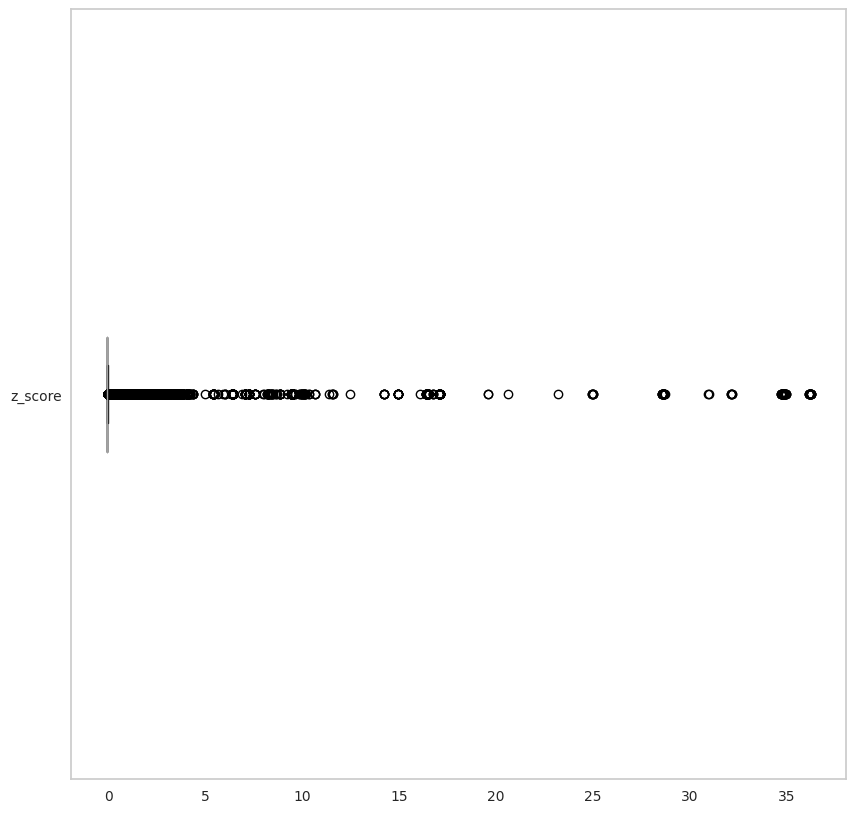

In [46]:
#lets see the outlier in form of z-score
balance_z.boxplot(column=['z_score'],fontsize=10,
           rot=0,grid=False,figsize=(10,10),vert=False)

In [47]:
# lets check which row is considered an outlier (it means that the z-score is higher than 2 or lower than -2)
balance_z_outlier_user = balance_z[(balance_z['z_score'] > 2) | (balance_z['z_score'] < -2)]
balance_z_outlier_user

#there is 64 row that has an abundant transaction, in which the user is considered a sultan (outlier) if the minimal transaction reach hundreds of milions rupiah in a day
balance_z_outlier_user['total_AUM']

996       75035972.00
997       75062389.00
998       75074205.00
999       75084028.00
1000      75100209.00
             ...     
151932   550200998.00
151933   900474996.00
151934   900236080.00
151935   899949109.00
158320    83418864.00
Name: total_AUM, Length: 967, dtype: float64

In [48]:
#lets see the transaction of the unique user that are a sultan (outlier)
user_out = balance_z_outlier_user['user_id'].unique()
balance_z_user_out = balance_z[balance_z['user_id'].isin(user_out)]
balance_z_user_out
#it seems that we will remove 1327 rows of data

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM,z_score
995,212020,2021-08-27,NaN,NaN,NaN,500148.00,500000.00,NaN,2001016.00,2000000.00,NaN,NaN,NaN,NaN,NaN,2500000.00,2501164.00,-0.02
996,212020,2021-08-30,NaN,NaN,NaN,23009163.00,23000000.00,22500000.00,52026809.00,52000000.00,50000000.00,NaN,NaN,NaN,72500000.00,75000000.00,75035972.00,2.58
997,212020,2021-08-31,NaN,NaN,NaN,23009129.00,23000000.00,NaN,52053260.00,52000000.00,NaN,NaN,NaN,NaN,NaN,75000000.00,75062389.00,2.58
998,212020,2021-09-01,NaN,NaN,NaN,23011964.00,23000000.00,NaN,52062241.00,52000000.00,NaN,NaN,NaN,NaN,NaN,75000000.00,75074205.00,2.58
999,212020,2021-09-02,NaN,NaN,NaN,23014710.00,23000000.00,NaN,52069318.00,52000000.00,NaN,NaN,NaN,NaN,NaN,75000000.00,75084028.00,2.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151932,4056373,2021-09-27,NaN,NaN,NaN,450209370.00,450000000.00,NaN,99991628.00,100000000.00,NaN,NaN,NaN,NaN,NaN,550000000.00,550200998.00,19.60
151933,4056373,2021-09-28,NaN,NaN,NaN,450325149.00,450000000.00,NaN,450149847.00,450000000.00,350000000.00,NaN,NaN,NaN,350000000.00,900000000.00,900474996.00,32.14
151934,4056373,2021-09-29,NaN,NaN,NaN,450367266.00,450000000.00,NaN,449868814.00,450000000.00,NaN,NaN,NaN,NaN,NaN,900000000.00,900236080.00,32.13
151935,4056373,2021-09-30,NaN,NaN,NaN,450423947.00,450000000.00,NaN,449525162.00,450000000.00,NaN,NaN,NaN,NaN,NaN,900000000.00,899949109.00,32.12


In [49]:
#lets remove the user that have a high number of transaction from the dataset (aka the Sultan)
balance_z_remove_out =  balance_z[~balance_z['user_id'].isin(user_out)]
balance_z_remove_out

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM,z_score
0,50701,2021-08-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10132277.00,10000000.00,NaN,NaN,10000000.00,10132277.00,0.25
1,50701,2021-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10206945.00,10000000.00,NaN,NaN,10000000.00,10206945.00,0.26
2,50701,2021-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9956556.00,10000000.00,NaN,NaN,10000000.00,9956556.00,0.25
3,50701,2021-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9914858.00,10000000.00,NaN,NaN,10000000.00,9914858.00,0.25
4,50701,2021-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10016360.00,10000000.00,NaN,NaN,10000000.00,10016360.00,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158806,4165020,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158807,4165132,2021-09-30,NaN,NaN,NaN,10001.00,10000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.00,10001.00,-0.11
158808,4165630,2021-09-30,41625.00,40000.00,NaN,10001.00,10000.00,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,NaN,100000.00,101495.00,-0.11
158809,4165704,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,NaN,10000.00,9987.00,-0.11


In [50]:
#lets see how many user are considered a sultan/outlier and the non-sultan

count_user = balance_z['user_id'].nunique()
count_user_outlier_z = balance_z_user_out['user_id'].nunique()
count_user_non_outlier_z = balance_z_remove_out['user_id'].nunique()

print('This is the number of user in the dataset :',count_user)
print('This is the number of Sultan (outlier) user in the dataset :',count_user_outlier_z)
print('This is the percentage of Sultan (outlier) user in the dataset :',(count_user_outlier_z) / count_user)
print('This is the number of Non-Sultan user in the dataset:',count_user_non_outlier_z)
print('this is the min daily transaction of a Sultan =',balance_z_user_out['total_transaction'].min(), '<<< The daily transaction are over 100mil rupiah, a true crazy rich sultan!' )

This is the number of user in the dataset : 8277
This is the number of Sultan (outlier) user in the dataset : 58
This is the percentage of Sultan (outlier) user in the dataset : 0.007007369819983086
This is the number of Non-Sultan user in the dataset: 8219
this is the min daily transaction of a Sultan = -185000000.0 <<< The daily transaction are over 100mil rupiah, a true crazy rich sultan!


In [51]:
#lets check the min total transaction daily before and after outlier check, it seems it change to a reasonable amount after the crazy rich sultan (outlier) were removed
print('Average total transaction daily before outlier detection :',balance_z['total_AUM'].mean())
print('Average total transaction daily after outlier detection :',balance_z_remove_out['total_AUM'].mean())

Average total transaction daily before outlier detection : 3064589.0106637976
Average total transaction daily after outlier detection : 1409330.846096042


In [52]:
#so this is the cleaned balance dataset with z-score outlier detection method
#data outlier yang akan di pakai untuk proses data preprocessing
balance_z_remove_out

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM,z_score
0,50701,2021-08-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10132277.00,10000000.00,NaN,NaN,10000000.00,10132277.00,0.25
1,50701,2021-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10206945.00,10000000.00,NaN,NaN,10000000.00,10206945.00,0.26
2,50701,2021-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9956556.00,10000000.00,NaN,NaN,10000000.00,9956556.00,0.25
3,50701,2021-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9914858.00,10000000.00,NaN,NaN,10000000.00,9914858.00,0.25
4,50701,2021-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10016360.00,10000000.00,NaN,NaN,10000000.00,10016360.00,0.25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158806,4165020,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158807,4165132,2021-09-30,NaN,NaN,NaN,10001.00,10000.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.00,10001.00,-0.11
158808,4165630,2021-09-30,41625.00,40000.00,NaN,10001.00,10000.00,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,NaN,100000.00,101495.00,-0.11
158809,4165704,2021-09-30,NaN,NaN,NaN,NaN,NaN,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,NaN,10000.00,9987.00,-0.11


## Compare between before and after Outlier Detection Method

In [53]:
#lets see how much data we remove in between these 3 method (the threshold is 10%)

bal= balance_null['user_id'].count()
zscore = balance_z_user_out['user_id'].count()
print('With Z-Score method we clean',zscore,'numbers of data',bal,'data, in which it is',zscore/bal,'or 0.8 percent of data')

With Z-Score method we clean 1327 numbers of data 158811 data, in which it is 0.008355844368463141 or 0.8 percent of data


Step 8. clean datasets dari outlier

In [54]:
# it seems that the std.dev and Z-Score yield the better number, so we use the Z-Score
balance_clean = balance_z_remove_out.copy()
balance_clean.drop(['z_score'], axis = 1, inplace = True) #lets drop the z_score column so it doesnt disturb us later
balance_clean.info() #this is the cleaned user balance data
balance_clean.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 157484 entries, 0 to 158810
Data columns (total 17 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   user_id                              157484 non-null  object        
 1   date                                 157484 non-null  datetime64[ns]
 2   Saham_AUM                            82159 non-null   float64       
 3   Saham_invested_amount                81936 non-null   float64       
 4   Saham_transaction_amount             5195 non-null    float64       
 5   Pasar_Uang_AUM                       101598 non-null  float64       
 6   Pasar_Uang_invested_amount           101598 non-null  float64       
 7   Pasar_Uang_transaction_amount        6323 non-null    float64       
 8   Pendapatan_Tetap_AUM                 84164 non-null   float64       
 9   Pendapatan_Tetap_invested_amount     84164 non-null   float64       
 

,user_id,date,Saham_AUM,Saham_invested_amount,Saham_transaction_amount,Pasar_Uang_AUM,Pasar_Uang_invested_amount,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
0,50701,2021-08-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10132277.00,10000000.00,NaN,NaN,10000000.00,10132277.00
1,50701,2021-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10206945.00,10000000.00,NaN,NaN,10000000.00,10206945.00
2,50701,2021-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9956556.00,10000000.00,NaN,NaN,10000000.00,9956556.00
3,50701,2021-09-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9914858.00,10000000.00,NaN,NaN,10000000.00,9914858.00
4,50701,2021-09-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10016360.00,10000000.00,NaN,NaN,10000000.00,10016360.00


## Merging the datasets

In [55]:
#lets merge the user balance and user data, to see the extra information of the user in the user balance table
userdata_balance = user_clean.merge(balance_clean,  how='right', left_on='user_id', right_on='user_id')
userdata_balances = userdata_balance.dropna(subset = ["user_gender"]) #there is 330 out of 150k+ data null value on user data like gender, occupation, etc so lets drop it because it might be the user age outlier that we look at user table before
userdata_balances['referral_code_used'] = userdata_balances['referral_code_used'].astype('bool') #somehow this column is change back to an object or string, so we change it to Bool back
userdata_balances

#For now i keep my data on daily basis because i want to analyze the daily trend of transaction buy/sell to see when or what day the user most likely do buy or sell mutual funds

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,date,Saham_AUM,...,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
0,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-08-30,NaN,...,NaN,NaN,NaN,NaN,10132277.00,10000000.00,NaN,NaN,10000000.00,10132277.00
1,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-08-31,NaN,...,NaN,NaN,NaN,NaN,10206945.00,10000000.00,NaN,NaN,10000000.00,10206945.00
2,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-09-01,NaN,...,NaN,NaN,NaN,NaN,9956556.00,10000000.00,NaN,NaN,10000000.00,9956556.00
3,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-09-02,NaN,...,NaN,NaN,NaN,NaN,9914858.00,10000000.00,NaN,NaN,10000000.00,9914858.00
4,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-09-03,NaN,...,NaN,NaN,NaN,NaN,10016360.00,10000000.00,NaN,NaN,10000000.00,10016360.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157479,4165020,2021-09-28 12:04:25,Male,24,Others,A (Under 10 Mil),True,Business Profit,2021-09-30,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
157480,4165132,2021-09-28 12:04:22,Male,18,Pelajar,A (Under 10 Mil),True,Savings or Investment,2021-09-30,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.00,10001.00
157481,4165630,2021-09-28 12:46:26,Female,28,Swasta,B (10 Mil to 50 Mil),False,From Family,2021-09-30,41625.00,...,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,NaN,100000.00,101495.00
157482,4165704,2021-09-28 12:54:00,Male,25,Swasta,B (10 Mil to 50 Mil),True,Salary,2021-09-30,NaN,...,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,NaN,10000.00,9987.00


# Data Preprocessing

## Data Transformation

### a. User End of Period Mutual Funds Value

In [56]:
#Lets Transform some data to find end-of-period user mutual funds investment value of each month
eop_aug = userdata_balance[(userdata_balance['date'] == '2021-08-31')]
eop_sep = userdata_balance[(userdata_balance['date'] == '2021-09-30')]
end_of_period = pd.concat([eop_aug , eop_sep])
end_of_period['month'] = end_of_period['date'] #make a new column as month

#make the EOP as a new column (to make it easier to drop it), and calculate the profit of each mutual funds
end_of_period['EOP_Saham_AUM'] = end_of_period['Saham_AUM']
end_of_period['EOP_Saham_invested_amount'] = end_of_period['Saham_invested_amount']
end_of_period['EOP_Saham_profit'] = end_of_period['Saham_AUM'] - end_of_period['Saham_invested_amount']

end_of_period['EOP_Pasar_Uang_AUM'] = end_of_period['Pasar_Uang_AUM']
end_of_period['EOP_Pasar_Uang_invested_amount'] = end_of_period['Pasar_Uang_invested_amount']
end_of_period['EOP_Pasar_Uang_profit'] = end_of_period['Pasar_Uang_AUM'] - end_of_period['Pasar_Uang_invested_amount']

end_of_period['EOP_Pendapatan_Tetap_AUM'] = end_of_period['Pendapatan_Tetap_AUM']
end_of_period['EOP_Pendapatan_Tetap_invested_amount'] = end_of_period['Pendapatan_Tetap_invested_amount']
end_of_period['EOP_Pendapatan_Tetap_profit'] = end_of_period['Pendapatan_Tetap_AUM'] - end_of_period['Pendapatan_Tetap_invested_amount']

end_of_period['EOP_Campuran_AUM'] = end_of_period['Campuran_AUM']
end_of_period['EOP_Campuran_invested_amount'] = end_of_period['Campuran_invested_amount']
end_of_period['EOP_Campuran_profit'] = end_of_period['EOP_Campuran_AUM'] - end_of_period['EOP_Campuran_invested_amount']

#drop the column we dont use
list_columns = end_of_period.columns.to_list()
drop_columns = list_columns[1:24]
end_of_period = end_of_period.drop(columns=drop_columns, axis = 1)
end_of_period['month'] = end_of_period['month'].dt.strftime('%b %Y')
end_of_period = end_of_period.fillna(0)
end_of_period

,user_id,month,EOP_Saham_AUM,EOP_Saham_invested_amount,EOP_Saham_profit,EOP_Pasar_Uang_AUM,EOP_Pasar_Uang_invested_amount,EOP_Pasar_Uang_profit,EOP_Pendapatan_Tetap_AUM,EOP_Pendapatan_Tetap_invested_amount,EOP_Pendapatan_Tetap_profit,EOP_Campuran_AUM,EOP_Campuran_invested_amount,EOP_Campuran_profit
1,50701,Aug 2021,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10206945.00,10000000.00,206945.00
24,50961,Aug 2021,716057.00,700000.00,16057.00,100049.00,100000.00,49.00,200117.00,200000.00,117.00,0.00,0.00,0.00
52,53759,Aug 2021,70839.00,70000.00,839.00,10006.00,10000.00,6.00,20066.00,20000.00,66.00,0.00,0.00,0.00
77,54759,Aug 2021,0.00,0.00,0.00,10007875.00,10000000.00,7875.00,0.00,0.00,0.00,0.00,0.00,0.00
114,61414,Aug 2021,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157479,4165020,Sep 2021,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
157480,4165132,Sep 2021,0.00,0.00,0.00,10001.00,10000.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
157481,4165630,Sep 2021,41625.00,40000.00,1625.00,10001.00,10000.00,1.00,49869.00,50000.00,-131.00,0.00,0.00,0.00
157482,4165704,Sep 2021,0.00,0.00,0.00,0.00,0.00,0.00,9987.00,10000.00,-13.00,0.00,0.00,0.00


In [57]:
# Calculate the totals using the correct column names
end_of_period['EOP_total_AUM'] = (end_of_period['EOP_Saham_AUM'] +
                                  end_of_period['EOP_Pasar_Uang_AUM'] +
                                  end_of_period['EOP_Pendapatan_Tetap_AUM'] +
                                  end_of_period['EOP_Campuran_AUM'])

end_of_period['EOP_total_invested_amount'] = (end_of_period['EOP_Saham_invested_amount'] +
                                              end_of_period['EOP_Pasar_Uang_invested_amount'] +
                                              end_of_period['EOP_Pendapatan_Tetap_invested_amount'] +
                                              end_of_period['EOP_Campuran_invested_amount'])

end_of_period['EOP_total_profit'] = end_of_period['EOP_total_AUM'] - end_of_period['EOP_total_invested_amount']

# Display information about the DataFrame
print(end_of_period.info())

# Display the first few rows of the DataFrame
print(end_of_period.head())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11265 entries, 1 to 157483
Data columns (total 17 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   user_id                               11265 non-null  object 
 1   month                                 11265 non-null  object 
 2   EOP_Saham_AUM                         11265 non-null  float64
 3   EOP_Saham_invested_amount             11265 non-null  float64
 4   EOP_Saham_profit                      11265 non-null  float64
 5   EOP_Pasar_Uang_AUM                    11265 non-null  float64
 6   EOP_Pasar_Uang_invested_amount        11265 non-null  float64
 7   EOP_Pasar_Uang_profit                 11265 non-null  float64
 8   EOP_Pendapatan_Tetap_AUM              11265 non-null  float64
 9   EOP_Pendapatan_Tetap_invested_amount  11265 non-null  float64
 10  EOP_Pendapatan_Tetap_profit           11265 non-null  float64
 11  EOP_Campuran_A

### b. Monthy Total Transaction (Buy and Sell)

#### Monthly Transaction of BUy

In [58]:
#lets check for the monthly buy transaction per-user and check it per mutual funds so we got a more accurate number
transaction_aug = userdata_balance[(userdata_balance['date'] <= '2021-08-31')] #Lets Filter the date for August

# Make an August monthly buy transaction of Saham mutual funds
transaction_aug_buy_saham = transaction_aug[(transaction_aug['Saham_transaction_amount'] > 0)] #Lets Filter the the positive amount (buy) of this mutual funds
transaction_aug_buy_saham['month'] = transaction_aug_buy_saham['date'] #make a new column as month
transaction_aug_buy_saham['month'] = transaction_aug_buy_saham['month'].dt.strftime('%b %Y') #change the date format
transaction_aug_buy_saham['monthly_buy_Saham'] = transaction_aug_buy_saham['Saham_transaction_amount'] #change the column name to monthly_buy
group_transaction_aug_buy_saham = transaction_aug_buy_saham.groupby(['user_id','month'], as_index=False).sum() #groupby it per user

#drop the column we dont use
list_columns = group_transaction_aug_buy_saham.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_aug_buy_saham = group_transaction_aug_buy_saham.drop(columns=drop_columns, axis = 1)


# Make an August monthly buy transaction of Pasar Uang mutual funds
transaction_aug_buy_pu = transaction_aug[(transaction_aug['Pasar_Uang_transaction_amount'] > 0)] #Lets Filter the the positive amount (buy) of this mutual funds
transaction_aug_buy_pu['month'] = transaction_aug_buy_pu['date'] #make a new column as month
transaction_aug_buy_pu['month'] = transaction_aug_buy_pu['month'].dt.strftime('%b %Y') #change the date format
transaction_aug_buy_pu['monthly_buy_Pasar_Uang'] = transaction_aug_buy_pu['Pasar_Uang_transaction_amount']#change the column name to monthly_buy
group_transaction_aug_buy_pu = transaction_aug_buy_pu.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_aug_buy_pu.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_aug_buy_pu = group_transaction_aug_buy_pu.drop(columns=drop_columns, axis = 1)


# Make an August monthly buy transaction of Pendapatan Tetap mutual funds
transaction_aug_buy_pt = transaction_aug[(transaction_aug['Pendapatan_Tetap_transaction_amount'] > 0)] #Lets Filter the the positive amount (buy) of this mutual funds
transaction_aug_buy_pt['month'] = transaction_aug_buy_pt['date'] #make a new column as month
transaction_aug_buy_pt['month'] = transaction_aug_buy_pt['month'].dt.strftime('%b %Y') #change the date format
transaction_aug_buy_pt['monthly_buy_Pendapatan_Tetap'] = transaction_aug_buy_pt['Pendapatan_Tetap_transaction_amount']#change the column name to monthly_buy
group_transaction_aug_buy_pt = transaction_aug_buy_pt.groupby(['user_id','month'], as_index=False).sum() #groupby it per user

#drop the column we dont use
list_columns = group_transaction_aug_buy_pt.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_aug_buy_pt = group_transaction_aug_buy_pt.drop(columns=drop_columns, axis = 1)
group_transaction_aug_buy_pt


# Make an August monthly buy transaction of Campuran mutual funds
transaction_aug_buy_campuran = transaction_aug[(transaction_aug['Campuran_transaction_amount'] > 0)] #Lets Filter the the positive amount (buy) of this mutual funds
transaction_aug_buy_campuran['month'] = transaction_aug_buy_campuran['date'] #make a new column as month
transaction_aug_buy_campuran['month'] = transaction_aug_buy_campuran['month'].dt.strftime('%b %Y') #change the date format
transaction_aug_buy_campuran.groupby(['user_id'], as_index=False).sum() #groupby it per user
transaction_aug_buy_campuran['monthly_buy_Campuran'] = transaction_aug_buy_campuran['Campuran_transaction_amount']#change the column name to monthly_buy
group_transaction_aug_buy_campuran = transaction_aug_buy_campuran.groupby(['user_id','month'], as_index=False).sum() #groupby it per user

#drop the column we dont use
list_columns = group_transaction_aug_buy_campuran.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_aug_buy_campuran = group_transaction_aug_buy_campuran.drop(columns=drop_columns, axis = 1)
group_transaction_aug_buy_campuran

#lets merge all of it
transaction_aug_buy1 = group_transaction_aug_buy_saham.merge(group_transaction_aug_buy_pu, how='outer', on=('user_id','month'))
transaction_aug_buy2 = transaction_aug_buy1.merge(group_transaction_aug_buy_pt, how='outer', on=('user_id','month'))
transaction_aug_buy = transaction_aug_buy2.merge(group_transaction_aug_buy_campuran, how='outer', on=('user_id','month'))

#lets add a total amount of all mutual funds transcation
transaction_aug_buy = transaction_aug_buy.fillna(0)
transaction_aug_buy['monthly_total_buy'] = (transaction_aug_buy['monthly_buy_Saham'] +
                                      transaction_aug_buy['monthly_buy_Pasar_Uang'] +
                                      transaction_aug_buy['monthly_buy_Pendapatan_Tetap'] +
                                      transaction_aug_buy['monthly_buy_Campuran'])
transaction_aug_buy

/tmp/ipykernel_2903/1107822052.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/1107822052.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/1107822052.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903

,user_id,month,monthly_buy_Saham,monthly_buy_Pasar_Uang,monthly_buy_Pendapatan_Tetap,monthly_buy_Campuran,monthly_total_buy
0,1111674,Aug 2021,40000.00,0.00,0.00,0.00,40000.00
1,1119474,Aug 2021,30000.00,10000.00,60000.00,0.00,100000.00
2,1134964,Aug 2021,100000.00,0.00,0.00,0.00,100000.00
3,1161960,Aug 2021,330000.00,90000.00,480000.00,0.00,900000.00
4,1196178,Aug 2021,11384124.00,3694690.00,16247387.00,0.00,31326201.00
...,...,...,...,...,...,...,...
1068,3779467,Aug 2021,0.00,0.00,0.00,1000000.00,1000000.00
1069,3787955,Aug 2021,0.00,0.00,0.00,20000000.00,20000000.00
1070,3792729,Aug 2021,0.00,0.00,0.00,1000000.00,1000000.00
1071,3803048,Aug 2021,0.00,0.00,0.00,100000.00,100000.00


In [59]:
transaction_sep = userdata_balance[(userdata_balance['date'] >= '2021-09-1')] #Lets Filter the date for September

# Make an September monthly buy transaction of Saham mutual funds
transaction_sep_buy_saham = transaction_sep[(transaction_sep['Saham_transaction_amount'] > 0)] #Lets Filter the the positive amount (buy) of this mutual funds
transaction_sep_buy_saham['month'] = transaction_sep_buy_saham['date'] #make a new column as month
transaction_sep_buy_saham['month'] = transaction_sep_buy_saham['month'].dt.strftime('%b %Y') #change the date format
transaction_sep_buy_saham['monthly_buy_Saham'] = transaction_sep_buy_saham['Saham_transaction_amount'] #change the column name to monthly_buy
group_transaction_sep_buy_saham = transaction_sep_buy_saham.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_sep_buy_saham.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_sep_buy_saham = group_transaction_sep_buy_saham.drop(columns=drop_columns, axis = 1)


# Make an September monthly buy transaction of Pasar Uang mutual funds
transaction_sep_buy_pu = transaction_sep[(transaction_sep['Pasar_Uang_transaction_amount'] > 0)] #Lets Filter the the positive amount (buy) of this mutual funds
transaction_sep_buy_pu['month'] = transaction_sep_buy_pu['date'] #make a new column as month
transaction_sep_buy_pu['month'] = transaction_sep_buy_pu['month'].dt.strftime('%b %Y') #change the date format
transaction_sep_buy_pu['monthly_buy_Pasar_Uang'] = transaction_sep_buy_pu['Pasar_Uang_transaction_amount']#change the column name to monthly_buy
group_transaction_sep_buy_pu = transaction_sep_buy_pu.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_sep_buy_pu.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_sep_buy_pu = group_transaction_sep_buy_pu.drop(columns=drop_columns, axis = 1)


# Make an September monthly buy transaction of Pendapatan Tetap mutual funds
transaction_sep_buy_pt = transaction_sep[(transaction_sep['Pendapatan_Tetap_transaction_amount'] > 0)] #Lets Filter the the positive amount (buy) of this mutual funds
transaction_sep_buy_pt['month'] = transaction_sep_buy_pt['date'] #make a new column as month
transaction_sep_buy_pt['month'] = transaction_sep_buy_pt['month'].dt.strftime('%b %Y') #change the date format
transaction_sep_buy_pt['monthly_buy_Pendapatan_Tetap'] = transaction_sep_buy_pt['Pendapatan_Tetap_transaction_amount']#change the column name to monthly_buy
group_transaction_sep_buy_pt = transaction_sep_buy_pt.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_sep_buy_pt.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_sep_buy_pt = group_transaction_sep_buy_pt.drop(columns=drop_columns, axis = 1)


# Make an September monthly buy transaction of Campuran mutual funds
transaction_sep_buy_campuran = transaction_sep[(transaction_sep['Campuran_transaction_amount'] > 0)] #Lets Filter the the positive amount (buy) of this mutual funds
transaction_sep_buy_campuran['month'] = transaction_sep_buy_campuran['date'] #make a new column as month
transaction_sep_buy_campuran['month'] = transaction_sep_buy_campuran['month'].dt.strftime('%b %Y') #change the date format
transaction_sep_buy_campuran['monthly_buy_Campuran'] = transaction_sep_buy_campuran['Campuran_transaction_amount']#change the column name to monthly_buy
group_transaction_sep_buy_campuran = transaction_sep_buy_campuran.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_sep_buy_campuran.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_sep_buy_campuran = group_transaction_sep_buy_campuran.drop(columns=drop_columns, axis = 1)


#lets merge all of it
transaction_sep_buy1 = group_transaction_sep_buy_saham.merge(group_transaction_sep_buy_pu, how='outer', on=('user_id','month'))
transaction_sep_buy2 = transaction_sep_buy1.merge(group_transaction_sep_buy_pt, how='outer', on=('user_id','month'))
transaction_sep_buy = transaction_sep_buy2.merge(group_transaction_sep_buy_campuran, how='outer', on=('user_id','month'))

#lets add a total amount of all mutual funds transcation
transaction_sep_buy = transaction_sep_buy.fillna(0)
transaction_sep_buy['monthly_total_buy'] = (transaction_sep_buy['monthly_buy_Saham'] +
                                      transaction_sep_buy['monthly_buy_Pasar_Uang'] +
                                      transaction_sep_buy['monthly_buy_Pendapatan_Tetap'] +
                                      transaction_sep_buy['monthly_buy_Campuran'])

transaction_sep_buy

/tmp/ipykernel_2903/499044617.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/499044617.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/499044617.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/49

,user_id,month,monthly_buy_Saham,monthly_buy_Pasar_Uang,monthly_buy_Pendapatan_Tetap,monthly_buy_Campuran,monthly_total_buy
0,103108,Sep 2021,5000000.00,0.00,0.00,0.00,5000000.00
1,1035424,Sep 2021,47000.00,0.00,0.00,0.00,47000.00
2,1050345,Sep 2021,140000.00,180000.00,680000.00,0.00,1000000.00
3,1062501,Sep 2021,190000.00,250000.00,410000.00,0.00,850000.00
4,1098153,Sep 2021,70000.00,20000.00,110000.00,0.00,200000.00
...,...,...,...,...,...,...,...
3005,3933937,Sep 2021,0.00,0.00,0.00,2000000.00,2000000.00
3006,3950230,Sep 2021,0.00,0.00,0.00,11000000.00,11000000.00
3007,3965052,Sep 2021,0.00,0.00,0.00,300000.00,300000.00
3008,3984286,Sep 2021,0.00,0.00,0.00,50000.00,50000.00


In [60]:
#Lets merge the two monthly dataframe
monthly_user_buy = pd.concat([transaction_aug_buy, transaction_sep_buy])
monthly_user_buy.info()
monthly_user_buy

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4083 entries, 0 to 3009
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   user_id                       4083 non-null   object 
 1   month                         4083 non-null   object 
 2   monthly_buy_Saham             4083 non-null   float64
 3   monthly_buy_Pasar_Uang        4083 non-null   float64
 4   monthly_buy_Pendapatan_Tetap  4083 non-null   float64
 5   monthly_buy_Campuran          4083 non-null   float64
 6   monthly_total_buy             4083 non-null   float64
dtypes: float64(5), object(2)
memory usage: 255.2+ KB


,user_id,month,monthly_buy_Saham,monthly_buy_Pasar_Uang,monthly_buy_Pendapatan_Tetap,monthly_buy_Campuran,monthly_total_buy
0,1111674,Aug 2021,40000.00,0.00,0.00,0.00,40000.00
1,1119474,Aug 2021,30000.00,10000.00,60000.00,0.00,100000.00
2,1134964,Aug 2021,100000.00,0.00,0.00,0.00,100000.00
3,1161960,Aug 2021,330000.00,90000.00,480000.00,0.00,900000.00
4,1196178,Aug 2021,11384124.00,3694690.00,16247387.00,0.00,31326201.00
...,...,...,...,...,...,...,...
3005,3933937,Sep 2021,0.00,0.00,0.00,2000000.00,2000000.00
3006,3950230,Sep 2021,0.00,0.00,0.00,11000000.00,11000000.00
3007,3965052,Sep 2021,0.00,0.00,0.00,300000.00,300000.00
3008,3984286,Sep 2021,0.00,0.00,0.00,50000.00,50000.00


In [61]:
# Make an August monthly sell transaction of Saham mutual funds
transaction_aug_sell_saham = transaction_aug[(transaction_aug['Saham_transaction_amount'] < 0)] #Lets Filter the the negative amount (sell) of this mutual funds
transaction_aug_sell_saham['month'] = transaction_aug_sell_saham['date'] #make a new column as month
transaction_aug_sell_saham['month'] = transaction_aug_sell_saham['month'].dt.strftime('%b %Y') #change the date format
transaction_aug_sell_saham['monthly_sell_Saham'] = transaction_aug_sell_saham['Saham_transaction_amount'] #change the column name to monthly_sell
group_transaction_aug_sell_saham = transaction_aug_sell_saham.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_aug_sell_saham.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_aug_sell_saham = group_transaction_aug_sell_saham.drop(columns=drop_columns, axis = 1)


# Make an August monthly sell transaction of Pasar Uang mutual funds
transaction_aug_sell_pu = transaction_aug[(transaction_aug['Pasar_Uang_transaction_amount'] < 0)] #Lets Filter the the negative amount (sell) of this mutual funds
transaction_aug_sell_pu['month'] = transaction_aug_sell_pu['date'] #make a new column as month
transaction_aug_sell_pu['month'] = transaction_aug_sell_pu['month'].dt.strftime('%b %Y') #change the date format
transaction_aug_sell_pu['monthly_sell_Pasar_Uang'] = transaction_aug_sell_pu['Pasar_Uang_transaction_amount']#change the column name to monthly_sell
group_transaction_aug_sell_pu = transaction_aug_sell_pu.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_aug_sell_pu.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_aug_sell_pu = group_transaction_aug_sell_pu.drop(columns=drop_columns, axis = 1)


# Make an August monthly sell transaction of Pendapatan Tetap mutual funds
transaction_aug_sell_pt = transaction_aug[(transaction_aug['Pendapatan_Tetap_transaction_amount'] < 0)] #Lets Filter the the negative amount (sell) of this mutual funds
transaction_aug_sell_pt['month'] = transaction_aug_sell_pt['date'] #make a new column as month
transaction_aug_sell_pt['month'] = transaction_aug_sell_pt['month'].dt.strftime('%b %Y') #change the date format
transaction_aug_sell_pt['monthly_sell_Pendapatan_Tetap'] = transaction_aug_sell_pt['Pendapatan_Tetap_transaction_amount']#change the column name to monthly_sell
group_transaction_aug_sell_pt = transaction_aug_sell_pt.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_aug_sell_pt.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_aug_sell_pt = group_transaction_aug_sell_pt.drop(columns=drop_columns, axis = 1)


# Make an August monthly sell transaction of Campuran mutual funds
transaction_aug_sell_campuran = transaction_aug[(transaction_aug['Campuran_transaction_amount'] < 0)] #Lets Filter the the negative amount (sell) of this mutual funds
transaction_aug_sell_campuran['month'] = transaction_aug_sell_campuran['date'] #make a new column as month
transaction_aug_sell_campuran['month'] = transaction_aug_sell_campuran['month'].dt.strftime('%b %Y') #change the date format
transaction_aug_sell_campuran['monthly_sell_Campuran'] = transaction_aug_sell_campuran['Campuran_transaction_amount']#change the column name to monthly_sell
group_transaction_aug_sell_campuran = transaction_aug_sell_campuran.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_aug_sell_campuran.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_aug_sell_campuran = group_transaction_aug_sell_campuran.drop(columns=drop_columns, axis = 1)


#lets merge all of it
transaction_aug_sell1 = group_transaction_aug_sell_saham.merge(group_transaction_aug_sell_pu, how='outer', on=('user_id','month'))
transaction_aug_sell2 = transaction_aug_sell1.merge(group_transaction_aug_sell_pt, how='outer', on=('user_id','month'))
transaction_aug_sell = transaction_aug_sell2.merge(group_transaction_aug_sell_campuran, how='outer', on=('user_id','month'))

#lets add a total amount of all mutual funds transcation
transaction_aug_sell = transaction_aug_sell.fillna(0)
transaction_aug_sell['monthly_total_sell'] = (transaction_aug_sell['monthly_sell_Saham'] +
                                      transaction_aug_sell['monthly_sell_Pasar_Uang'] +
                                      transaction_aug_sell['monthly_sell_Pendapatan_Tetap'] +
                                      transaction_aug_sell['monthly_sell_Campuran'])

transaction_aug_sell

/tmp/ipykernel_2903/4048906115.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/4048906115.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/4048906115.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903

,user_id,month,monthly_sell_Saham,monthly_sell_Pasar_Uang,monthly_sell_Pendapatan_Tetap,monthly_sell_Campuran,monthly_total_sell
0,1109220,Aug 2021,-10000.00,-150000.00,-40000.00,0.00,-200000.00
1,1111674,Aug 2021,-40000.00,0.00,0.00,0.00,-40000.00
2,1131019,Aug 2021,-90000.00,-60000.00,-350000.00,0.00,-500000.00
3,1134964,Aug 2021,-10000.00,-10000.00,-100000.00,0.00,-120000.00
4,1196178,Aug 2021,-12346799.00,0.00,0.00,0.00,-12346799.00
...,...,...,...,...,...,...,...
665,3745088,Aug 2021,0.00,0.00,0.00,-1000000.00,-1000000.00
666,3749430,Aug 2021,0.00,0.00,0.00,-1000000.00,-1000000.00
667,3778562,Aug 2021,0.00,0.00,0.00,-50000000.00,-50000000.00
668,3786625,Aug 2021,0.00,0.00,0.00,-4000000.00,-4000000.00


In [62]:
# Make an September monthly sell transaction of Saham mutual funds
transaction_sep_sell_saham = transaction_sep[(transaction_sep['Saham_transaction_amount'] < 0)] #Lets Filter the the negative amount (sell) of this mutual funds
transaction_sep_sell_saham['month'] = transaction_sep_sell_saham['date'] #make a new column as month
transaction_sep_sell_saham['month'] = transaction_sep_sell_saham['month'].dt.strftime('%b %Y') #change the date format
transaction_sep_sell_saham['monthly_sell_Saham'] = transaction_sep_sell_saham['Saham_transaction_amount'] #change the column name to monthly_sell
group_transaction_sep_sell_saham = transaction_sep_sell_saham.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_sep_sell_saham.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_sep_sell_saham = group_transaction_sep_sell_saham.drop(columns=drop_columns, axis = 1)


# Make an September monthly sell transaction of Pasar Uang mutual funds
transaction_sep_sell_pu = transaction_sep[(transaction_sep['Pasar_Uang_transaction_amount'] < 0)] #Lets Filter the the negative amount (sell) of this mutual funds
transaction_sep_sell_pu['month'] = transaction_sep_sell_pu['date'] #make a new column as month
transaction_sep_sell_pu['month'] = transaction_sep_sell_pu['month'].dt.strftime('%b %Y') #change the date format
transaction_sep_sell_pu['monthly_sell_Pasar_Uang'] = transaction_sep_sell_pu['Pasar_Uang_transaction_amount']#change the column name to monthly_sell
group_transaction_sep_sell_pu = transaction_sep_sell_pu.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_sep_sell_pu.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_sep_sell_pu = group_transaction_sep_sell_pu.drop(columns=drop_columns, axis = 1)


# Make an September monthly sell transaction of Pendapatan Tetap mutual funds
transaction_sep_sell_pt = transaction_sep[(transaction_sep['Pendapatan_Tetap_transaction_amount'] < 0)] #Lets Filter the the negative amount (sell) of this mutual funds
transaction_sep_sell_pt['month'] = transaction_sep_sell_pt['date'] #make a new column as month
transaction_sep_sell_pt['month'] = transaction_sep_sell_pt['month'].dt.strftime('%b %Y') #change the date format
transaction_sep_sell_pt['monthly_sell_Pendapatan_Tetap'] = transaction_sep_sell_pt['Pendapatan_Tetap_transaction_amount']#change the column name to monthly_sell
group_transaction_sep_sell_pt = transaction_sep_sell_pt.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_sep_sell_pt.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_sep_sell_pt = group_transaction_sep_sell_pt.drop(columns=drop_columns, axis = 1)


# Make an September monthly sell transaction of Campuran mutual funds
transaction_sep_sell_campuran = transaction_sep[(transaction_sep['Campuran_transaction_amount'] < 0)] #Lets Filter the the negative amount (sell) of this mutual funds
transaction_sep_sell_campuran['month'] = transaction_sep_sell_campuran['date'] #make a new column as month
transaction_sep_sell_campuran['month'] = transaction_sep_sell_campuran['month'].dt.strftime('%b %Y') #change the date format
transaction_sep_sell_campuran['monthly_sell_Campuran'] = transaction_sep_sell_campuran['Campuran_transaction_amount']#change the column name to monthly_sell
group_transaction_sep_sell_campuran = transaction_sep_sell_campuran.groupby(['user_id','month'], as_index=False).sum() #groupby it per user
#drop the column we dont use
list_columns = group_transaction_sep_sell_campuran.columns.to_list()
drop_columns = list_columns[2:19]
group_transaction_sep_sell_campuran = group_transaction_sep_sell_campuran.drop(columns=drop_columns, axis = 1)


#lets merge all of it
transaction_sep_sell1 = group_transaction_sep_sell_saham.merge(group_transaction_sep_sell_pu, how='outer', on=('user_id','month'))
transaction_sep_sell2 = transaction_sep_sell1.merge(group_transaction_sep_sell_pt, how='outer', on=('user_id','month'))
transaction_sep_sell = transaction_sep_sell2.merge(group_transaction_sep_sell_campuran, how='outer', on=('user_id','month'))

#lets add a total amount of all mutual funds transcation
transaction_sep_sell = transaction_sep_sell.fillna(0)
transaction_sep_sell['monthly_total_sell'] = (transaction_sep_sell['monthly_sell_Saham'] +
                                      transaction_sep_sell['monthly_sell_Pasar_Uang'] +
                                      transaction_sep_sell['monthly_sell_Pendapatan_Tetap'] +
                                      transaction_sep_sell['monthly_sell_Campuran'])

transaction_sep_sell.info()
transaction_sep_sell

/tmp/ipykernel_2903/3621090665.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/3621090665.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/3621090665.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1984 entries, 0 to 1983
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   user_id                        1984 non-null   object 
 1   month                          1984 non-null   object 
 2   monthly_sell_Saham             1984 non-null   float64
 3   monthly_sell_Pasar_Uang        1984 non-null   float64
 4   monthly_sell_Pendapatan_Tetap  1984 non-null   float64
 5   monthly_sell_Campuran          1984 non-null   float64
 6   monthly_total_sell             1984 non-null   float64
dtypes: float64(5), object(2)
memory usage: 124.0+ KB


,user_id,month,monthly_sell_Saham,monthly_sell_Pasar_Uang,monthly_sell_Pendapatan_Tetap,monthly_sell_Campuran,monthly_total_sell
0,1024581,Sep 2021,-50000.00,-10000.00,-65000.00,0.00,-125000.00
1,103538,Sep 2021,-60000.00,-10000.00,-30000.00,0.00,-100000.00
2,1081443,Sep 2021,-40000.00,-10000.00,-50000.00,0.00,-100000.00
3,108559,Sep 2021,-130000.00,-180000.00,-690000.00,0.00,-1000000.00
4,1120478,Sep 2021,-110000.00,-30000.00,-160000.00,0.00,-300000.00
...,...,...,...,...,...,...,...
1979,3886635,Sep 2021,0.00,0.00,0.00,-200000.00,-200000.00
1980,3891911,Sep 2021,0.00,0.00,0.00,-100000.00,-100000.00
1981,3919230,Sep 2021,0.00,0.00,0.00,-500000.00,-500000.00
1982,3997528,Sep 2021,0.00,0.00,0.00,-1000000.00,-1000000.00


In [63]:
#Lets merge the two monthly sell dataframe
monthly_user_sell = pd.concat([transaction_aug_sell, transaction_sep_sell])


monthly_user_sell.info()
monthly_user_sell

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2654 entries, 0 to 1983
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   user_id                        2654 non-null   object 
 1   month                          2654 non-null   object 
 2   monthly_sell_Saham             2654 non-null   float64
 3   monthly_sell_Pasar_Uang        2654 non-null   float64
 4   monthly_sell_Pendapatan_Tetap  2654 non-null   float64
 5   monthly_sell_Campuran          2654 non-null   float64
 6   monthly_total_sell             2654 non-null   float64
dtypes: float64(5), object(2)
memory usage: 165.9+ KB


,user_id,month,monthly_sell_Saham,monthly_sell_Pasar_Uang,monthly_sell_Pendapatan_Tetap,monthly_sell_Campuran,monthly_total_sell
0,1109220,Aug 2021,-10000.00,-150000.00,-40000.00,0.00,-200000.00
1,1111674,Aug 2021,-40000.00,0.00,0.00,0.00,-40000.00
2,1131019,Aug 2021,-90000.00,-60000.00,-350000.00,0.00,-500000.00
3,1134964,Aug 2021,-10000.00,-10000.00,-100000.00,0.00,-120000.00
4,1196178,Aug 2021,-12346799.00,0.00,0.00,0.00,-12346799.00
...,...,...,...,...,...,...,...
1979,3886635,Sep 2021,0.00,0.00,0.00,-200000.00,-200000.00
1980,3891911,Sep 2021,0.00,0.00,0.00,-100000.00,-100000.00
1981,3919230,Sep 2021,0.00,0.00,0.00,-500000.00,-500000.00
1982,3997528,Sep 2021,0.00,0.00,0.00,-1000000.00,-1000000.00


In [64]:
# Lets Merge the Transaction dataframe Fist
monthly_user_transaction = monthly_user_buy.merge(monthly_user_sell, how='outer', on=('user_id','month'))
#monthly_user_transaction1 = monthly_user_transaction1.drop(columns='month', axis = 1)

#lets calculate the net transaction of each mutual funds and its total
monthly_user_transaction['monthly_Saham_net_transaction'] = (monthly_user_transaction['monthly_buy_Saham'] +  monthly_user_transaction['monthly_sell_Saham']) #calculate the total buy and sell for a monthly net transaction
monthly_user_transaction['monthly_Pasar_Uang_net_transaction'] = (monthly_user_transaction['monthly_buy_Pasar_Uang'] +  monthly_user_transaction['monthly_sell_Pasar_Uang']) #calculate the total buy and sell for a monthly net transaction
monthly_user_transaction['monthly_Pendapatan_Tetap_net_transaction'] = (monthly_user_transaction['monthly_buy_Pendapatan_Tetap'] +  monthly_user_transaction['monthly_sell_Pendapatan_Tetap']) #calculate the total buy and sell for a monthly net transaction
monthly_user_transaction['monthly_Campuran_net_transaction'] = (monthly_user_transaction['monthly_buy_Campuran'] +  monthly_user_transaction['monthly_sell_Campuran']) #calculate the total buy and sell for a monthly net transaction
monthly_user_transaction['monthly_total_net_transaction'] = (monthly_user_transaction['monthly_total_buy'] +  monthly_user_transaction['monthly_total_sell']) #calculate the total buy and sell for a monthly net transaction


monthly_user_transaction = monthly_user_transaction.fillna(0)
monthly_user_transaction.info()
monthly_user_transaction

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5593 entries, 0 to 5592
Data columns (total 17 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   user_id                                   5593 non-null   object 
 1   month                                     5593 non-null   object 
 2   monthly_buy_Saham                         5593 non-null   float64
 3   monthly_buy_Pasar_Uang                    5593 non-null   float64
 4   monthly_buy_Pendapatan_Tetap              5593 non-null   float64
 5   monthly_buy_Campuran                      5593 non-null   float64
 6   monthly_total_buy                         5593 non-null   float64
 7   monthly_sell_Saham                        5593 non-null   float64
 8   monthly_sell_Pasar_Uang                   5593 non-null   float64
 9   monthly_sell_Pendapatan_Tetap             5593 non-null   float64
 10  monthly_sell_Campuran               

,user_id,month,monthly_buy_Saham,monthly_buy_Pasar_Uang,monthly_buy_Pendapatan_Tetap,monthly_buy_Campuran,monthly_total_buy,monthly_sell_Saham,monthly_sell_Pasar_Uang,monthly_sell_Pendapatan_Tetap,monthly_sell_Campuran,monthly_total_sell,monthly_Saham_net_transaction,monthly_Pasar_Uang_net_transaction,monthly_Pendapatan_Tetap_net_transaction,monthly_Campuran_net_transaction,monthly_total_net_transaction
0,1111674,Aug 2021,40000.00,0.00,0.00,0.00,40000.00,-40000.00,0.00,0.00,0.00,-40000.00,0.00,0.00,0.00,0.00,0.00
1,1119474,Aug 2021,30000.00,10000.00,60000.00,0.00,100000.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,1134964,Aug 2021,100000.00,0.00,0.00,0.00,100000.00,-10000.00,-10000.00,-100000.00,0.00,-120000.00,90000.00,-10000.00,-100000.00,0.00,-20000.00
3,1161960,Aug 2021,330000.00,90000.00,480000.00,0.00,900000.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
4,1196178,Aug 2021,11384124.00,3694690.00,16247387.00,0.00,31326201.00,-12346799.00,0.00,0.00,0.00,-12346799.00,-962675.00,3694690.00,16247387.00,0.00,18979402.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5588,3758701,Sep 2021,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-3000000.00,-3000000.00,0.00,0.00,0.00,0.00,0.00
5589,3762515,Sep 2021,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-1000000.00,-1000000.00,0.00,0.00,0.00,0.00,0.00
5590,3891911,Sep 2021,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-100000.00,-100000.00,0.00,0.00,0.00,0.00,0.00
5591,3997528,Sep 2021,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-1000000.00,-1000000.00,0.00,0.00,0.00,0.00,0.00


In [65]:
#Make an August monthly transaction frequency of each mutual funds
transaction_frequency_aug = transaction_aug.copy()
transaction_frequency_aug['date'] = transaction_frequency_aug['date'].dt.strftime('%b %Y') #change the date format
transaction_frequency_aug = transaction_frequency_aug.rename(columns={'date': 'month',
                   'Saham_transaction_amount': 'monthly_Saham_transaction_frequency',
                   'Pendapatan_Tetap_transaction_amount' : 'monthly_Pendapatan_Tetap_transaction_frequency',
                   'Pasar_Uang_transaction_amount' : 'monthly_Pasar_Uang_transaction_frequency',
                   'Campuran_transaction_amount' : 'monthly_Campuran_transaction_frequency',
                   'total_transaction' : 'monthly_total_transaction_frequency'}, errors='raise')

group_transaction_frequency_aug = transaction_frequency_aug.groupby(['user_id','month'], as_index=False).count() #groupby it per user

#drop the column we dont use
list_columns = group_transaction_frequency_aug.columns.to_list()
drop_columns = list_columns[2:11]
group_transaction_frequency_aug = group_transaction_frequency_aug.drop(columns=drop_columns, axis = 1)
drop_columns2 = list_columns[12:14]
group_transaction_frequency_aug = group_transaction_frequency_aug.drop(columns=drop_columns2, axis = 1)
drop_columns3 = list_columns[15:17]
group_transaction_frequency_aug = group_transaction_frequency_aug.drop(columns=drop_columns3, axis = 1)
drop_columns4 = list_columns[18:20]
group_transaction_frequency_aug = group_transaction_frequency_aug.drop(columns=drop_columns4, axis = 1)
drop_columns5 = list_columns[22:]
group_transaction_frequency_aug = group_transaction_frequency_aug.drop(columns=drop_columns5, axis = 1)


group_transaction_frequency_aug.info()
group_transaction_frequency_aug

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3046 entries, 0 to 3045
Data columns (total 7 columns):
 #   Column                                          Non-Null Count  Dtype 
---  ------                                          --------------  ----- 
 0   user_id                                         3046 non-null   object
 1   month                                           3046 non-null   object
 2   monthly_Saham_transaction_frequency             3046 non-null   int64 
 3   monthly_Pasar_Uang_transaction_frequency        3046 non-null   int64 
 4   monthly_Pendapatan_Tetap_transaction_frequency  3046 non-null   int64 
 5   monthly_Campuran_transaction_frequency          3046 non-null   int64 
 6   monthly_total_transaction_frequency             3046 non-null   int64 
dtypes: int64(5), object(2)
memory usage: 166.7+ KB


,user_id,month,monthly_Saham_transaction_frequency,monthly_Pasar_Uang_transaction_frequency,monthly_Pendapatan_Tetap_transaction_frequency,monthly_Campuran_transaction_frequency,monthly_total_transaction_frequency
0,1004326,Aug 2021,0,0,0,0,0
1,1018814,Aug 2021,0,0,0,0,0
2,1023627,Aug 2021,0,0,0,0,0
3,103538,Aug 2021,0,0,0,0,0
4,1046177,Aug 2021,0,0,0,0,0
...,...,...,...,...,...,...,...
3041,979998,Aug 2021,0,0,0,0,0
3042,984729,Aug 2021,0,0,0,0,0
3043,989618,Aug 2021,0,0,0,0,0
3044,990466,Aug 2021,0,0,0,0,0


In [66]:
#Make an August monthly transaction frequency of each mutual funds
transaction_frequency_sep = transaction_sep.copy()
transaction_frequency_sep['date'] = transaction_frequency_sep['date'].dt.strftime('%b %Y') #change the date format
transaction_frequency_sep = transaction_frequency_sep.rename(columns={'date': 'month',
                   'Saham_transaction_amount': 'monthly_Saham_transaction_frequency',
                   'Pendapatan_Tetap_transaction_amount' : 'monthly_Pendapatan_Tetap_transaction_frequency',
                   'Pasar_Uang_transaction_amount' : 'monthly_Pasar_Uang_transaction_frequency',
                   'Campuran_transaction_amount' : 'monthly_Campuran_transaction_frequency',
                   'total_transaction' : 'monthly_total_transaction_frequency'}, errors='raise')

group_transaction_frequency_sep = transaction_frequency_sep.groupby(['user_id','month'], as_index=False).count() #groupby it per user

#drop the column we dont use
list_columns = group_transaction_frequency_sep.columns.to_list()
drop_columns = list_columns[2:11]
group_transaction_frequency_sep = group_transaction_frequency_sep.drop(columns=drop_columns, axis = 1)
drop_columns2 = list_columns[12:14]
group_transaction_frequency_sep = group_transaction_frequency_sep.drop(columns=drop_columns2, axis = 1)
drop_columns3 = list_columns[15:17]
group_transaction_frequency_sep = group_transaction_frequency_sep.drop(columns=drop_columns3, axis = 1)
drop_columns4 = list_columns[18:20]
group_transaction_frequency_sep = group_transaction_frequency_sep.drop(columns=drop_columns4, axis = 1)
drop_columns5 = list_columns[22:]
group_transaction_frequency_sep = group_transaction_frequency_sep.drop(columns=drop_columns5, axis = 1)


group_transaction_frequency_sep.info()
group_transaction_frequency_sep

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8219 entries, 0 to 8218
Data columns (total 7 columns):
 #   Column                                          Non-Null Count  Dtype 
---  ------                                          --------------  ----- 
 0   user_id                                         8219 non-null   object
 1   month                                           8219 non-null   object
 2   monthly_Saham_transaction_frequency             8219 non-null   int64 
 3   monthly_Pasar_Uang_transaction_frequency        8219 non-null   int64 
 4   monthly_Pendapatan_Tetap_transaction_frequency  8219 non-null   int64 
 5   monthly_Campuran_transaction_frequency          8219 non-null   int64 
 6   monthly_total_transaction_frequency             8219 non-null   int64 
dtypes: int64(5), object(2)
memory usage: 449.6+ KB


,user_id,month,monthly_Saham_transaction_frequency,monthly_Pasar_Uang_transaction_frequency,monthly_Pendapatan_Tetap_transaction_frequency,monthly_Campuran_transaction_frequency,monthly_total_transaction_frequency
0,1004326,Sep 2021,0,0,0,0,0
1,1005053,Sep 2021,0,0,0,0,0
2,1005165,Sep 2021,0,0,0,0,0
3,1018814,Sep 2021,0,1,0,0,1
4,1023627,Sep 2021,0,0,0,0,0
...,...,...,...,...,...,...,...
8214,988940,Sep 2021,0,0,0,0,0
8215,989618,Sep 2021,1,1,2,0,2
8216,990466,Sep 2021,2,2,2,0,3
8217,99245,Sep 2021,0,0,0,0,0


In [67]:
#lets merge the transaction frequency into one dataset

monthly_transaction_frequency = pd.concat([group_transaction_frequency_aug, group_transaction_frequency_sep])
monthly_transaction_frequency.info()
monthly_transaction_frequency

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11265 entries, 0 to 8218
Data columns (total 7 columns):
 #   Column                                          Non-Null Count  Dtype 
---  ------                                          --------------  ----- 
 0   user_id                                         11265 non-null  object
 1   month                                           11265 non-null  object
 2   monthly_Saham_transaction_frequency             11265 non-null  int64 
 3   monthly_Pasar_Uang_transaction_frequency        11265 non-null  int64 
 4   monthly_Pendapatan_Tetap_transaction_frequency  11265 non-null  int64 
 5   monthly_Campuran_transaction_frequency          11265 non-null  int64 
 6   monthly_total_transaction_frequency             11265 non-null  int64 
dtypes: int64(5), object(2)
memory usage: 704.1+ KB


,user_id,month,monthly_Saham_transaction_frequency,monthly_Pasar_Uang_transaction_frequency,monthly_Pendapatan_Tetap_transaction_frequency,monthly_Campuran_transaction_frequency,monthly_total_transaction_frequency
0,1004326,Aug 2021,0,0,0,0,0
1,1018814,Aug 2021,0,0,0,0,0
2,1023627,Aug 2021,0,0,0,0,0
3,103538,Aug 2021,0,0,0,0,0
4,1046177,Aug 2021,0,0,0,0,0
...,...,...,...,...,...,...,...
8214,988940,Sep 2021,0,0,0,0,0
8215,989618,Sep 2021,1,1,2,0,2
8216,990466,Sep 2021,2,2,2,0,3
8217,99245,Sep 2021,0,0,0,0,0


In [68]:
#lets merge the transaction frequency into one dataset
monthly1 = monthly_user_transaction.merge(monthly_transaction_frequency, how='outer', on=['user_id','month'])
monthly2 = monthly1.merge(end_of_period, how='outer', on=['user_id','month'])
monthly_user_data = user_clean.merge(monthly2, how='right', on=['user_id'])
monthly_user_data = monthly_user_data.drop(['registration_import_datetime'], axis = 1)
monthly_user_data.fillna(0)

monthly_user_data.info()
monthly_user_data

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11265 entries, 0 to 11264
Data columns (total 43 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   user_id                                         11265 non-null  object 
 1   user_gender                                     11265 non-null  object 
 2   user_age                                        11265 non-null  int64  
 3   user_occupation                                 11265 non-null  object 
 4   user_income_range                               11265 non-null  object 
 5   referral_code_used                              11265 non-null  bool   
 6   user_income_source                              11265 non-null  object 
 7   month                                           11265 non-null  object 
 8   monthly_buy_Saham                               5593 non-null   float64
 9   monthly_buy_Pasar_Uang                 

,user_id,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,month,monthly_buy_Saham,monthly_buy_Pasar_Uang,...,EOP_Pasar_Uang_profit,EOP_Pendapatan_Tetap_AUM,EOP_Pendapatan_Tetap_invested_amount,EOP_Pendapatan_Tetap_profit,EOP_Campuran_AUM,EOP_Campuran_invested_amount,EOP_Campuran_profit,EOP_total_AUM,EOP_total_invested_amount,EOP_total_profit
0,1111674,Male,22,Others,B (10 Mil to 50 Mil),False,Salary,Aug 2021,40000.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,1119474,Female,23,Pelajar,A (Under 10 Mil),False,Salary,Aug 2021,30000.00,10000.00,...,30.00,110472.00,110000.00,472.00,0.00,0.00,0.00,202825.00,200000.00,2825.00
2,1134964,Male,18,Pelajar,A (Under 10 Mil),False,Others,Aug 2021,100000.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,100962.00,100000.00,962.00
3,1161960,Male,21,Pelajar,A (Under 10 Mil),False,Salary,Aug 2021,330000.00,90000.00,...,91.00,536849.00,530000.00,6849.00,0.00,0.00,0.00,1007782.00,1000000.00,7782.00
4,1196178,Male,26,Pelajar,B (10 Mil to 50 Mil),False,Salary,Aug 2021,11384124.00,3694690.00,...,6396.00,19542405.00,19487387.00,55018.00,0.00,0.00,0.00,26297852.00,26199402.00,98450.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11260,975052,Male,37,Swasta,D (100 Mil to 500 Mil),False,Salary,Sep 2021,NaN,NaN,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
11261,978972,Male,22,Pelajar,A (Under 10 Mil),False,Salary,Sep 2021,NaN,NaN,...,12.00,29949.00,30000.00,-51.00,0.00,0.00,0.00,101884.00,100000.00,1884.00
11262,981852,Female,23,Swasta,C (50 Mil to 100 Mil),False,Salary,Sep 2021,NaN,NaN,...,132.00,0.00,0.00,0.00,0.00,0.00,0.00,100132.00,100000.00,132.00
11263,988940,Male,27,Swasta,B (10 Mil to 50 Mil),False,Salary,Sep 2021,NaN,NaN,...,353.00,159974.00,160000.00,-26.00,0.00,0.00,0.00,501937.00,500000.00,1937.00


## Exploratory Data Analysis

In [69]:
#lets see the demographic of the datasetm but first lets drop some column that we wont use
userdemo = userdata_balance.copy()

list_columns = userdemo.columns.to_list()
drop_columns = list_columns[8:]
userdemo.drop(columns=drop_columns, axis = 1, inplace = True)

userdemo.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 157484 entries, 0 to 157483
Data columns (total 8 columns):
 #   Column                        Non-Null Count   Dtype         
---  ------                        --------------   -----         
 0   user_id                       157484 non-null  object        
 1   registration_import_datetime  157484 non-null  datetime64[ns]
 2   user_gender                   157484 non-null  object        
 3   user_age                      157484 non-null  int64         
 4   user_occupation               157484 non-null  object        
 5   user_income_range             157484 non-null  object        
 6   referral_code_used            157484 non-null  bool          
 7   user_income_source            157484 non-null  object        
dtypes: bool(1), datetime64[ns](1), int64(1), object(5)
memory usage: 9.8+ MB



1. **Demografi Pengguna dalam Dataset (menggunakan diagram lingkaran/pie chart)**:
   - Buat diagram lingkaran untuk menunjukkan distribusi demografis pengguna, seperti berdasarkan jenis kelamin, usia, atau profesi.

2. **Berapa Banyak Pengguna dalam Data?**:
   - Gunakan fungsi `.nunique()` pada kolom `user_id` untuk mengetahui jumlah total pengguna unik dalam dataset.

3. **Produk Reksa Dana Populer di Berbagai Demografi**:
   - Analisis ini membutuhkan penggabungan data transaksi dengan data demografi pengguna. Gunakan `.groupby()` dan `.count()` untuk menentukan produk reksa dana mana yang paling populer di kalangan demografi tertentu.

4. **Perbedaan Perilaku antara Pengguna dengan dan Tanpa Referal**:
   - Bandingkan perilaku, seperti jumlah rata-rata transaksi atau frekuensi transaksi, antara pengguna yang menggunakan kode referal dengan yang tidak.

5. **Rata-rata AUM per Pengguna dan Persentase AUM untuk Setiap Jenis Reksa Dana**:
   - Hitung rata-rata AUM (Asset Under Management) per pengguna dan bandingkan persentase AUM untuk setiap jenis reksa dana.

6. **Berapa Banyak Pengguna yang Melakukan Transaksi dalam Sehari dan Rata-rata Transaksi Beli/Jual Bulanan per Pelanggan? Adakah Perbedaan Perilaku Berdasarkan Jenis Kelamin, Pekerjaan, atau Tingkat Pendapatan? Kapan Terakhir Kali Pengguna Melakukan Transaksi?**:
   - Pengguna dianggap melakukan transaksi dalam sehari jika jumlah transaksi mereka tidak nol atau tidak null. Periksa kamus data untuk memahami arti jumlah transaksi negatif atau positif. Analisis perbedaan perilaku berdasarkan demografi.

7. **Apa Rata-rata Keuntungan Saat Ini per Pengguna?**:
   - Periksa definisi keuntungan dalam kamus data. Keuntungan biasanya dinyatakan sebagai persentase dari jumlah yang diinvestasikan dan bisa positif atau negatif.

8. **Identifikasi Tren Kunci dalam Dataset. Kelompokkan Data Saldo (balance) Berdasarkan Hari, Minggu, dan Bulan dan Visualisasikan Seri Waktu Pengguna, Saldo, dan Transaksi. Adakah “Musim Sepi” dan “Musim Ramai” yang Konsisten? Bagaimana Tren dari Waktu ke Waktu? Apakah Meningkat, Menurun, atau Tetap Sama?**:
   - Informasi ini penting untuk mengetahui kapan waktu terbaik untuk menjual atau membeli dalam pasar. 

Analisis ini akan memberikan wawasan mendalam tentang perilaku dan preferensi pengguna, serta dinamika pasar reksa dana dalam dataset Anda.

### Data Manipulation to analyze demography

In [70]:
import plotly.express as px

# Mengelompokkan data berdasarkan gender dan menghitung jumlah
usergender = userdemo.groupby('user_gender')['user_id'].nunique()
percents = usergender * 100 / usergender.sum()

# Membuat data untuk pie chart
pie_data = usergender.reset_index()
pie_data['percentage'] = percents

# Membuat pie chart menggunakan Plotly Express
fig = px.pie(pie_data, values='user_id', names='user_gender', title='Gender Ratio of User')
fig.update_traces(textinfo='percent+label')
fig.show()


**Insight**
1.  The User in the dataset are mostly Male with 62.7% of it are Male and 37.3% are Female



findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

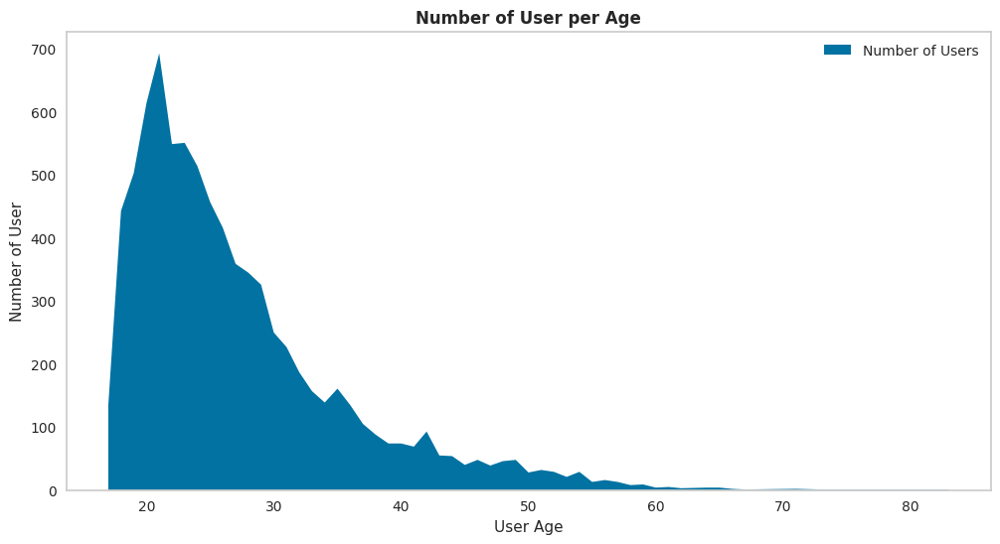

In [71]:
import matplotlib.pyplot as plt

# Mengelompokkan data berdasarkan umur dan menghitung jumlah pengguna
userage = userdemo.groupby('user_age')['user_id'].nunique()

# Membuat stackplot
plt.figure(figsize=(12, 6))
plt.stackplot(userage.index, userage, labels=['Number of Users'])

plt.grid()
plt.xlabel("User Age")
plt.ylabel("Number of User")
plt.title("Number of User per Age", fontweight="bold", fontsize=12)
plt.legend(loc='upper right')
plt.show()

**Insight**
1. The majority of the user in the dataset are 20 to 30 Years old
2. There is a big number of User that age under 20 too
3. From this dataset too we could conclude the majority of user in the dataset are Gen Z (age under 25) and followed by Gen Millenials (age 26 to 40), then there is some Gen X too (age over 41)

In [72]:
import plotly.express as px

# Mengelompokkan data berdasarkan pekerjaan dan menghitung jumlah pengguna
userocc = userdemo.groupby('user_occupation')['user_id'].nunique().reset_index()
userocc = userocc.sort_values(by='user_id', ascending=False)
userocc.rename(columns={'user_id': 'number_of_user'}, inplace=True)

# Membuat bar chart menggunakan Plotly Express
fig = px.bar(userocc, x='number_of_user', y='user_occupation', orientation='h', 
             title='Number of User Per User Occupation')
fig.update_layout(xaxis_title='Number of User', yaxis_title='User Occupation')
fig.show()

**Insight**
1. The majority of the user in the dataset are students with 54% of user are a student
2. The second majority of user work in private sector (or swasta) which takes 22.6% of user
3. The Third largest come work in unknown or other line which takes 11.2% of the user
3. There is also 3.8% entrepreneurs (or Pengusaha) that uses our platform
4. There is 0.7% of user that work as a teacher or guru
5. And also there is 0.3% of user that work as a soldier or TNI
6. There is no retiree or pensiunan user in this dataset

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

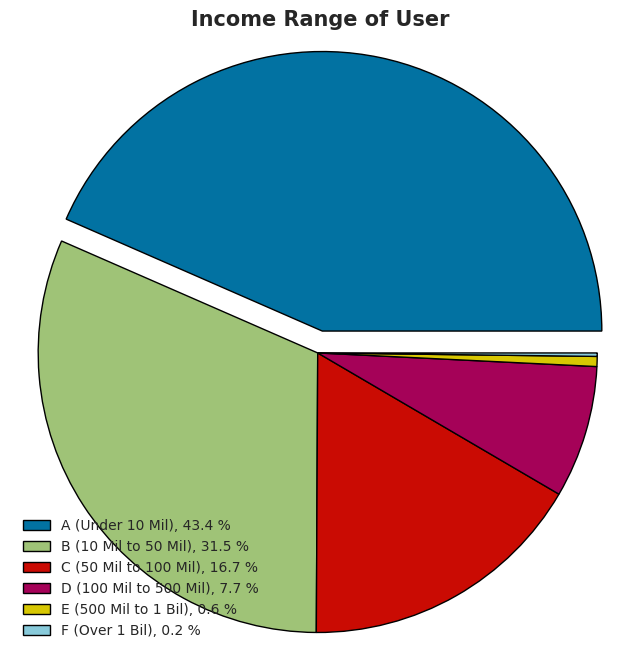

In [73]:
#lets groupby the previous dataframe to user_income_range and make a income range ratio in form of pie chart
inc = userdemo.groupby(['user_income_range']).count().sort_values(by=['user_id'],ascending=False)
percents = inc['user_id'].to_numpy() * 100 / inc['user_id'].to_numpy().sum()
plt.figure(figsize=(8, 8))
plt.pie(inc['user_id'],   frame=False,
        startangle=0, pctdistance=0.6,
        wedgeprops={"linewidth": 1, "edgecolor": "black", 'antialiased': True},
        explode=[0.08, 0, 0, 0, 0, 0])
plt.title('Income Range of User',fontweight="bold", fontsize = 15, loc="center")
plt.legend(loc='lower left',fontsize = 10,
           labels=['%s, %1.1f %%' % (l, s) for l, s in zip(inc['user_id'].index,percents)])
plt.axis('equal')
plt.show()

**Insight**
1. The majority or 43.4% of user have an income range < 10 mil IDR permonth.
2. Followed by 31.4% of user that have an income range 10 mil - 50 mil IDR permonth.
3. 16.7% of user also have an income range 50 mil - 100 mil IDR permonth.
4. 7.7% of user also have an income range 500 mil - 1 bil IDR permonth.
5. Only 0.2% user that have an income range over 1 bil IDR permonth.

/tmp/ipykernel_2903/2706290781.py:34: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




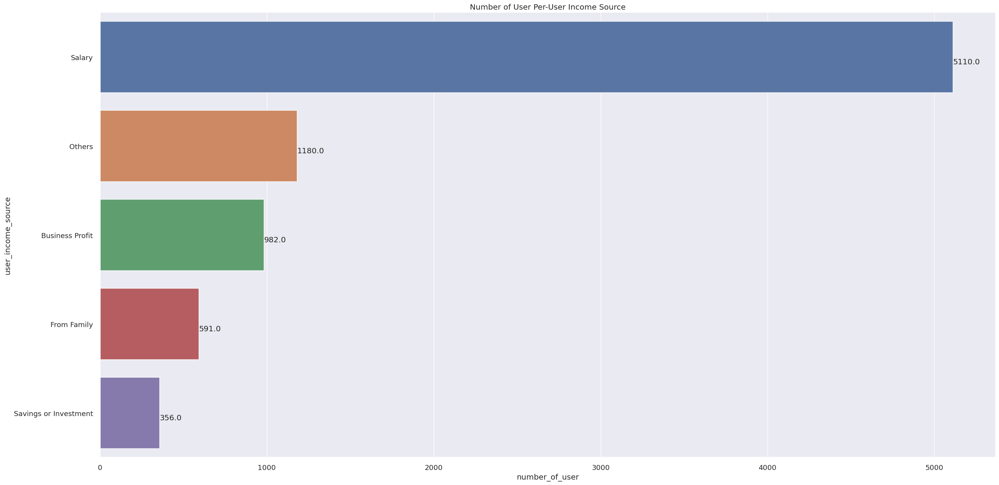

In [74]:
#lets groupby the previous dataframe to user_income_source and make a income source ratio in form of pie chart
userinc= userdemo.groupby(['user_id','user_income_source'],as_index=False).count().sort_values(by=['user_id'],ascending=False)
incs = userinc.groupby(['user_income_source'],as_index=False).count().sort_values(by=['user_id'],ascending=False)
incs.rename(columns={'user_id': 'number_of_user'}, inplace=True, errors='raise')

#make a function to show the value as a label
def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.03)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center")
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.4)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

#set seaborn plotting aesthetics so it looks good
sns.set(style='white')
sns.set(rc = {'figure.figsize':(30,15)})
sns.set(font_scale=1.2)

#create horizontal barplot
p = sns.barplot(x="number_of_user", y="user_income_source",  data=incs, ci=None)

#show values on barplot
show_values(p, "h", space=1)
p.set(title = 'Number of User Per-User Income Source')
plt.show()

**Insight**
1. The majority or 62.3% of user have an income source from his/her salary or gaji
2. Followed by 11.9% of user that have an income source from his/her business revenue or keuntungan bisnis
3. 11.2% of user also have an income source from Undian
4. 6.1% of user have an income from his/her parents or children or Dari Orang Tua/ Anak
5. 3.1% of user have an unkown income source
6. the rest of 1.1% of user have an income source from his/her significant other (suami/istri) , warisan, or bunga simpanan

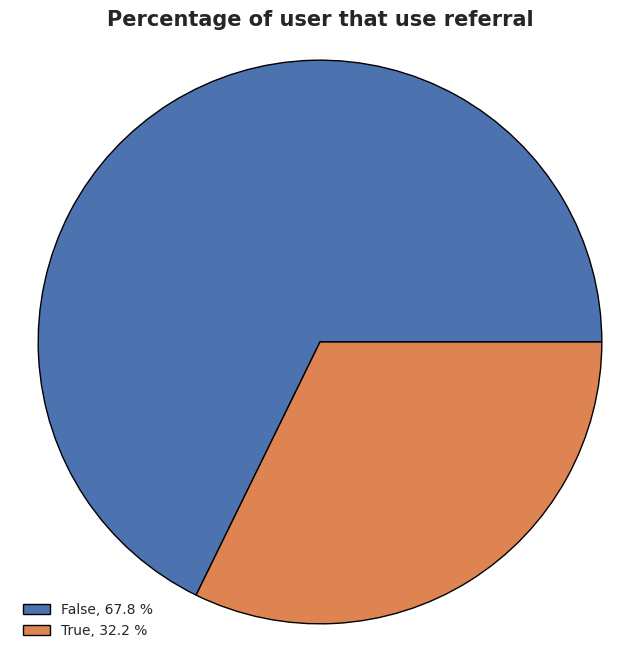

In [75]:
#lets groupby the previous dataframe to referral_code_used and make a referral source ratio in form of pie chart
rf = userdemo.groupby(['referral_code_used']).count().sort_values(by=['user_id'],ascending=False)
percents = rf['user_id'].to_numpy() * 100 / rf['user_id'].to_numpy().sum()
plt.figure(figsize=(8, 8))
plt.pie(rf['user_id'],   frame=False,
        startangle=0, pctdistance=0.6,
        wedgeprops={"linewidth": 1, "edgecolor": "black", 'antialiased': True})

plt.title('Percentage of user that use referral',fontweight="bold", fontsize = 15, loc="center")
plt.legend(loc='lower left',fontsize = 10,
           labels=['%s, %1.1f %%' % (l, s) for l, s in zip(rf['user_id'].index,percents)])
plt.axis('equal')
plt.show()

**Insight**
1. The majority or 67.8% of user dont use referral when registering his/her account
2. while only 32.3% of user use referral when registering his/her account

In [76]:
#lets groupby the previous dataframe to referral_code_used and look if it has any differences betwen user that use referral
rfb = userdata_balance.groupby(['referral_code_used'],as_index=False).mean()
list_columns = rfb.columns.to_list()
drop_columns = list_columns[1:14]
rfb.drop(columns=drop_columns, axis = 1, inplace = True)
rfb

/tmp/ipykernel_2903/4293902981.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,referral_code_used,total_transaction,total_invested,total_AUM
0,False,345158.87,1307220.43,1304744.18
1,True,290384.28,1693797.49,1678443.81


/tmp/ipykernel_2903/1358809961.py:33: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




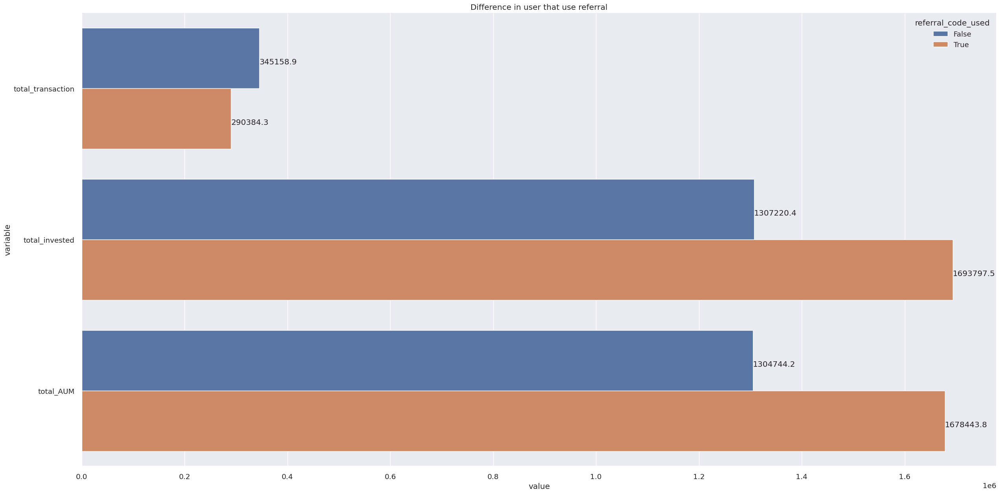

In [77]:
#lets manipulate the data with pd.melt so we could easily bar plot it
rfbm = rfb.melt(id_vars=['referral_code_used'], value_vars=['total_transaction', 'total_invested','total_AUM'])
rfbm

#make a function to show the value as a label
def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.03)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center")
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.4)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

#set seaborn plotting aesthetics so it looks good
sns.set(style='white')
sns.set(rc = {'figure.figsize':(30,15)})
sns.set(font_scale=1.2)

#create horizontal barplot
p = sns.barplot(x="value", y="variable", hue='referral_code_used'  ,data=rfbm, ci=None)

#show values on barplot
show_values(p, "h", space=1)
p.set(title = 'Difference in user that use referral')
plt.show()


**Insight**
1. The user that uses referral code when registering his or her account have more invested mutual funds than the user that dont, but they do less transaction this past 2 month than the user that dont.


In [78]:
#lets look at the average AUM peruser by grouping it per-user first
AVGaumuser = userdata_balance.groupby(['user_id'],as_index=False).mean()

#lets drop some column that we dont use
list_columns = AVGaumuser.columns.to_list()
drop_columns = list_columns[1:16]
AVGaumuser.drop(columns=drop_columns, axis = 1, inplace = True)

#lets rename the column to avg_AUM
AVGaumuser.rename(columns={'total_AUM': 'avg_AUM'}, inplace=True, errors='raise')
#lets look at the calculated mean of average user AUM
AVGaumuser.mean()

/tmp/ipykernel_2903/656313657.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



user_id                 inf
total_invested   1096318.99
avg_AUM          1094113.51
dtype: float64

In [79]:
#lets groupby the data on user_id and drop some column that we wont use
useraumshare = userdata_balance.groupby(['user_id'],as_index=False).sum()
list_columns = useraumshare.columns.to_list()
drop_columns = ['user_age',
 'Saham_invested_amount',
 'Saham_transaction_amount',
 'Pasar_Uang_invested_amount',
 'Pasar_Uang_transaction_amount',
 'Pendapatan_Tetap_invested_amount',
 'Pendapatan_Tetap_transaction_amount',
  'Campuran_invested_amount',
 'Campuran_transaction_amount',
 'total_transaction',
 'total_invested',]
useraumshare.drop(columns=drop_columns, axis = 1, inplace = True)

#lets calculate the percentage and then drop the column we dont use
useraumshare['Saham_aum%'] = (useraumshare['Saham_AUM']/useraumshare['total_AUM'])*100
useraumshare['PU_aum%'] = (useraumshare['Pasar_Uang_AUM']/useraumshare['total_AUM'])*100
useraumshare['PT_aum%'] = (useraumshare['Pendapatan_Tetap_AUM']/useraumshare['total_AUM'])*100
useraumshare['Camp_aum%'] = (useraumshare['Campuran_AUM']/useraumshare['total_AUM'])*100
list_columns = useraumshare.columns.to_list()
drop_columns = list_columns[1:6]
useraumshare.drop(columns=drop_columns, axis = 1, inplace = True)

#lets see the average percentage of AUM share
useraumshare.mean()

/tmp/ipykernel_2903/2318775182.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



user_id              inf
total_AUM    21449641.67
Saham_aum%         31.79
PU_aum%            35.07
PT_aum%            31.22
Camp_aum%           1.93
dtype: float64

**Insight**

Average user have an mutual funds allocation of 31.75% of it in Saham, 35.06% of it in Pasar Uang, 31.27% of it in Pendapatan Tetap, and 1.91% of it in Campuran, which makes the average user in the dataset to have a **Moderate Risk Profile** which means average user *can tolerate moderate level of risk in exchange for relatively higher potential returns over the medium to long term.*

In [80]:
#to look at this insight first, lets groupby the data on user_gender and drop some column that we wont use
gen = userdata_balance.groupby(['user_gender'],as_index=False).sum()
list_columns = gen.columns.to_list()
drop_columns = ['user_age','Saham_AUM',
'Saham_transaction_amount','Pasar_Uang_AUM',
 'Pasar_Uang_transaction_amount','Pendapatan_Tetap_AUM',
 'Pendapatan_Tetap_transaction_amount','Campuran_AUM',
 'Campuran_transaction_amount','total_transaction',
 'total_AUM']
gen.drop(columns=drop_columns, axis = 1, inplace = True)

#lets calculate the percetage of invested amount permutual funds and add as a new column
gen['Saham_inv%'] = (gen['Saham_invested_amount']/gen['total_invested'])*100
gen['PU_inv%'] = (gen['Pasar_Uang_invested_amount']/gen['total_invested'])*100
gen['PT_inv%'] = (gen['Pendapatan_Tetap_invested_amount']/gen['total_invested'])*100
gen['Camp_inv%'] = (gen['Campuran_invested_amount']/gen['total_invested'])*100

#and drop some column that we wont use so the dataframe look cleaner
list_columns = gen.columns.to_list()
drop_columns = list_columns[1:6]
gen.drop(columns=drop_columns, axis = 1, inplace = True)
gen

/tmp/ipykernel_2903/3377171608.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,user_gender,total_invested,Saham_inv%,PU_inv%,PT_inv%,Camp_inv%
0,Female,82698038634.00,17.49,33.88,30.91,17.72
1,Male,94103257895.00,26.15,23.47,37.15,13.22


/tmp/ipykernel_2903/2730804453.py:32: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




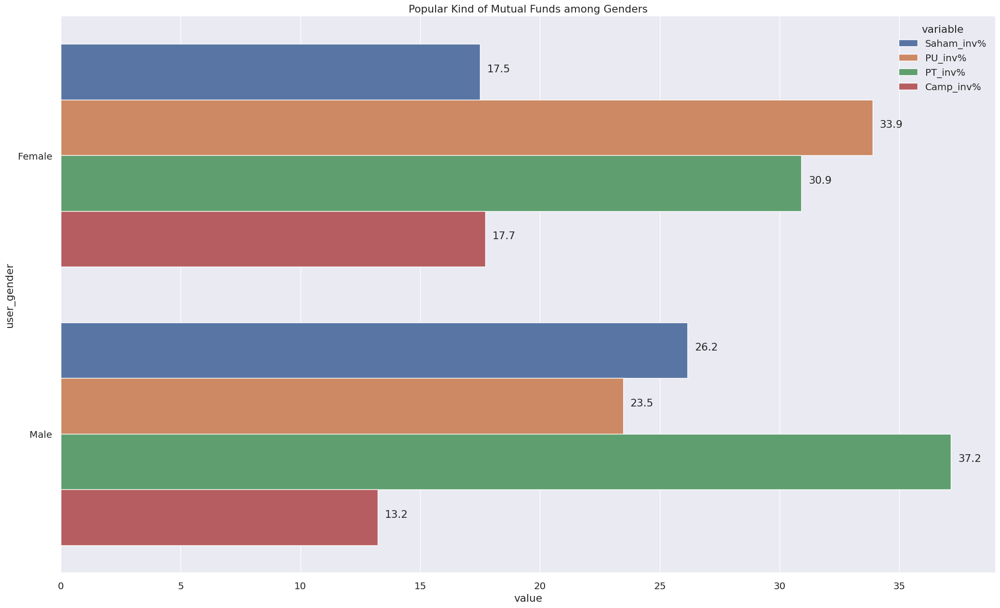

In [81]:
#lets manipulate the data first so we could easily make the bar chart
genM = gen.melt(id_vars=['user_gender'], value_vars=['Saham_inv%', 'PU_inv%','PT_inv%','Camp_inv%'])

#make a function to show the value as a label
def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center")
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.5)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

#set seaborn plotting aesthetics so it looks good
sns.set(style='white')
sns.set(rc = {'figure.figsize':(25,15)})
sns.set(font_scale=1.3)

#create horizontal barplot
p = sns.barplot(x="value", y="user_gender",  hue='variable', data=genM, ci=None)

#show values on barplot
show_values(p, "h", space=0.3)
p.set(title = 'Popular Kind of Mutual Funds among Genders')
plt.show()

**Insight**
1.   Female have an mutual funds allocation of 17.46% of it in Saham, 33.20% of it in Pasar Uang, 34.73% of it in Pendapatan Tetap, and 14.91% of it in Campuran, which makes the Male in the dataset to have a **Moderately Conservative	Risk Profile** which means average user *is willing to accept small level of risk in exchange for some potential returns over the medium to long term.*

2.   Male have an mutual funds allocation of 24.35% of it in Saham, 23.64% of it in Pasar Uang, 38.99% of it in Pendapatan Tetap, and 13.03% of it in Campuran, which makes the Male in the dataset to have a **Moderately Aggressive	Risk Profile** which means average user *is keen to accept high risk in order to maximize potential returns over the medium to long term.*

### Popular mutual funds product among occupation

In [82]:
#to look at this insight first, lets groupby the data on user_occupation  and drop some column that we wont use
occr = userdata_balance.groupby(['user_occupation'],as_index=False).sum().sort_values(by=['user_occupation'],ascending=True)
list_columns = occr.columns.to_list()

drop_columns = ['user_age','Saham_AUM',
'Saham_transaction_amount','Pasar_Uang_AUM',
 'Pasar_Uang_transaction_amount','Pendapatan_Tetap_AUM',
 'Pendapatan_Tetap_transaction_amount','Campuran_AUM',
 'Campuran_transaction_amount','total_transaction',
 'total_AUM']
occr.drop(columns=drop_columns, axis = 1, inplace = True)

#lets calculate the percetage of invested amount permutual funds and add as a new column
occr['Saham_inv%'] = (occr['Saham_invested_amount']/occr['total_invested'])*100
occr['PU_inv%'] = (occr['Pasar_Uang_invested_amount']/occr['total_invested'])*100
occr['PT_inv%'] = (occr['Pendapatan_Tetap_invested_amount']/occr['total_invested'])*100
occr['Camp_inv%'] = (occr['Campuran_invested_amount']/occr['total_invested'])*100

#and drop some column that we wont use so the dataframe look cleaner
list_columns = occr.columns.to_list()
drop_columns = list_columns[1:6]
occr.drop(columns=drop_columns, axis = 1, inplace = True)
occr

/tmp/ipykernel_2903/1873504280.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,user_occupation,total_invested,Saham_inv%,PU_inv%,PT_inv%,Camp_inv%
0,Guru,548042936.00,24.10,29.16,46.48,0.26
1,IRT,13569352070.00,12.56,36.58,29.08,21.77
2,Others,14525678055.00,25.58,28.70,38.36,7.35
3,PNS,6747251607.00,27.27,36.54,34.68,1.51
4,Pelajar,75024151702.00,19.69,29.95,33.34,17.03
5,Pengusaha,11053901793.00,29.18,14.63,36.36,19.84
6,Pensiunan,252000000.00,80.24,6.48,13.29,0.00
7,Swasta,54756098672.00,24.42,25.92,35.06,14.61
8,TNI/Polisi,324819694.00,34.83,17.21,47.96,0.00


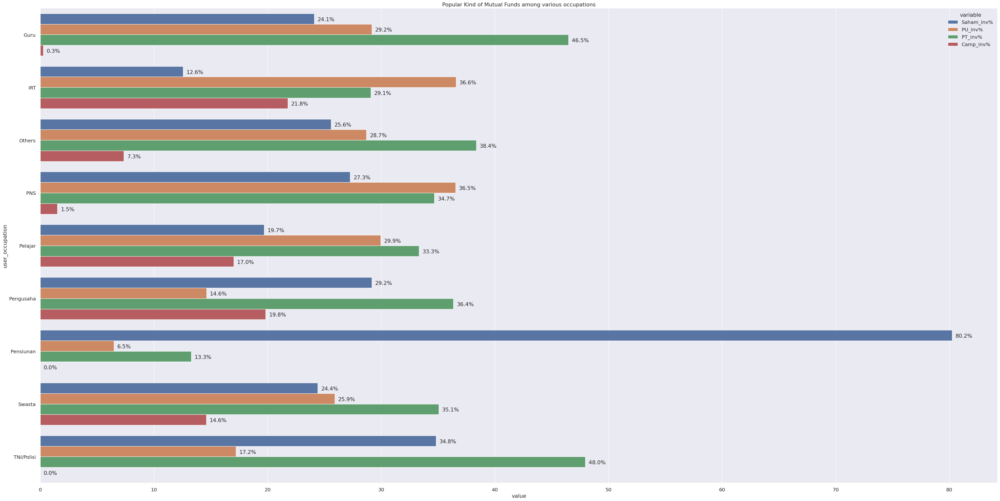

In [83]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Data manipulation
occrm = occr.melt(id_vars=['user_occupation'], value_vars=['Saham_inv%', 'PU_inv%','PT_inv%','Camp_inv%'])

# Function to show values on the plot
def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height() * 0.01)
                value = '{:.1f}%'.format(p.get_height())
                ax.text(_x, _y, value, ha="center")
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height() * 0.3)
                value = '{:.1f}%'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

# Set Seaborn plotting aesthetics
sns.set(style='white')
sns.set(rc={'figure.figsize':(50,25)})
sns.set(font_scale=1.3)

# Create horizontal barplot
p = sns.barplot(x="value", y="user_occupation", hue='variable', data=occrm, errorbar=None)

# Show values on barplot
show_values(p, "h", space=0.3)

# Set the title
p.set(title='Popular Kind of Mutual Funds among various occupations')

# Show the plot
plt.show()


In [84]:
#to look at this insight first, lets groupby the data on user_income_range  and drop some column that we wont use
incm = userdata_balance.groupby(['user_income_range'],as_index=False).sum().sort_values(by=['user_income_range'],ascending=True)
list_columns = incm.columns.to_list()
drop_columns = ['user_age','Saham_AUM',
'Saham_transaction_amount','Pasar_Uang_AUM',
 'Pasar_Uang_transaction_amount','Pendapatan_Tetap_AUM',
 'Pendapatan_Tetap_transaction_amount','Campuran_AUM',
 'Campuran_transaction_amount','total_transaction',
 'total_AUM']
incm.drop(columns=drop_columns, axis = 1, inplace = True)

#lets calculate the percetage of invested amount permutual funds and add as a new column
incm['Saham_inv%'] = (incm['Saham_invested_amount']/incm['total_invested'])*100
incm['PU_inv%'] = (incm['Pasar_Uang_invested_amount']/incm['total_invested'])*100
incm['PT_inv%'] = (incm['Pendapatan_Tetap_invested_amount']/incm['total_invested'])*100
incm['Camp_inv%'] = (incm['Campuran_invested_amount']/incm['total_invested'])*100

#and drop some column that we wont use so the dataframe look cleaner
list_columns = incm.columns.to_list()
drop_columns = list_columns[1:6]
incm.drop(columns=drop_columns, axis = 1, inplace = True)
incm

/tmp/ipykernel_2903/3241832120.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,user_income_range,total_invested,Saham_inv%,PU_inv%,PT_inv%,Camp_inv%
0,A (Under 10 Mil),32645499994.00,18.55,40.13,29.76,11.57
1,B (10 Mil to 50 Mil),46592990407.00,18.92,28.20,41.50,11.38
2,C (50 Mil to 100 Mil),48875343563.00,23.81,27.79,29.95,18.45
3,D (100 Mil to 500 Mil),42201194483.00,23.53,21.56,35.40,19.52
4,E (500 Mil to 1 Bil),4147238082.00,42.87,15.65,29.96,11.52
5,F (Over 1 Bil),2339030000.00,36.71,23.05,28.31,11.93


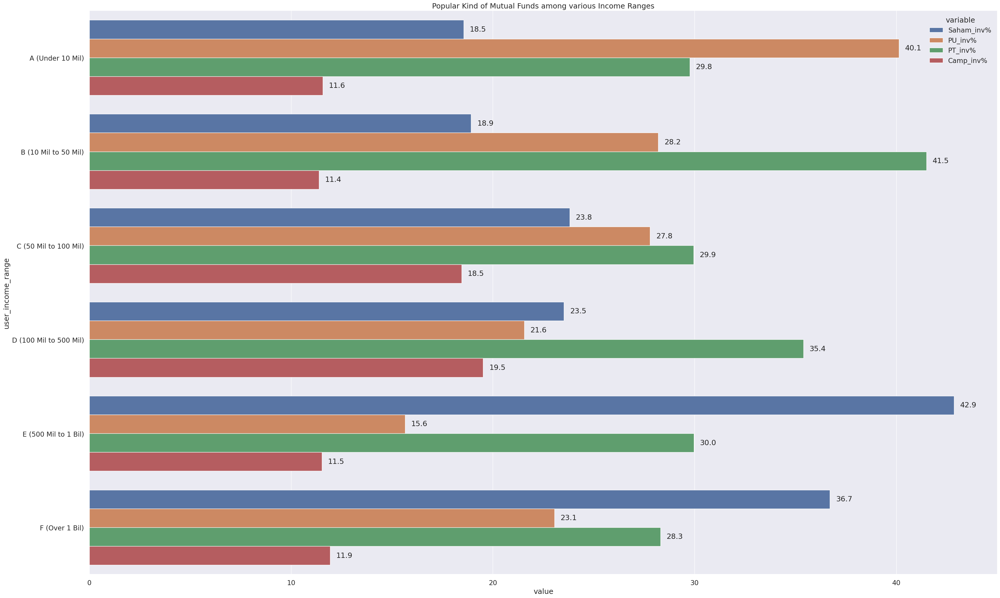

In [85]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Manipulate data for plotting
income_range_mutual_funds = incm.melt(id_vars=['user_income_range'], 
                                      value_vars=['Saham_inv%', 'PU_inv%', 'PT_inv%', 'Camp_inv%'])

# Function to show value labels on the plot
def show_values_on_bars(axs, orientation="v", spacing=.01):
    def _single(ax):
        if orientation == "v":
            for patch in ax.patches:
                x = patch.get_x() + patch.get_width() / 2
                y = patch.get_y() + patch.get_height() + (patch.get_height() * spacing)
                value = '{:.1f}'.format(patch.get_height())
                ax.text(x, y, value, ha="center")
        elif orientation == "h":
            for patch in ax.patches:
                x = patch.get_x() + patch.get_width() + float(spacing)
                y = patch.get_y() + patch.get_height() - (patch.get_height() * 0.4)
                value = '{:.1f}'.format(patch.get_width())
                ax.text(x, y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

# Set Seaborn plotting aesthetics
sns.set(style='white')
sns.set(rc={'figure.figsize':(40,25)})
sns.set(font_scale=1.5)

# Create a horizontal bar plot
bar_plot = sns.barplot(x="value", y="user_income_range", hue='variable', 
                       data=income_range_mutual_funds, errorbar=None)

# Show value labels on the bar plot
show_values_on_bars(bar_plot, "h", spacing=0.3)

# Set the plot title
bar_plot.set(title='Popular Kind of Mutual Funds among various Income Ranges')

# Display the plot
plt.show()

In [86]:
#to look at this insight first, lets groupby the data on user_income_source  and drop some column that we wont use
src = userdata_balance.groupby(['user_income_source'],as_index=False).sum().sort_values(by=['user_income_source'],ascending=True)
list_columns = src.columns.to_list()
drop_columns = ['user_age','Saham_AUM',
'Saham_transaction_amount','Pasar_Uang_AUM',
 'Pasar_Uang_transaction_amount','Pendapatan_Tetap_AUM',
 'Pendapatan_Tetap_transaction_amount','Campuran_AUM',
 'Campuran_transaction_amount','total_transaction',
 'total_AUM']
src.drop(columns=drop_columns, axis = 1, inplace = True)

#lets calculate the percetage of invested amount permutual funds and add as a new column
src['Saham_inv%'] = (src['Saham_invested_amount']/src['total_invested'])*100
src['PU_inv%'] = (src['Pasar_Uang_invested_amount']/src['total_invested'])*100
src['PT_inv%'] = (src['Pendapatan_Tetap_invested_amount']/src['total_invested'])*100
src['Camp_inv%'] = (src['Campuran_invested_amount']/src['total_invested'])*100

#and drop some column that we wont use so the dataframe look cleaner
list_columns = src.columns.to_list()
drop_columns = list_columns[1:6]
src.drop(columns=drop_columns, axis = 1, inplace = True)
src

/tmp/ipykernel_2903/2231983041.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,user_income_source,total_invested,Saham_inv%,PU_inv%,PT_inv%,Camp_inv%
0,Business Profit,19179298731.00,15.23,18.78,27.81,38.18
1,From Family,10558469440.00,28.57,19.66,43.19,8.57
2,Others,14195849948.00,18.15,37.44,20.97,23.43
3,Salary,126844107926.00,23.26,29.39,35.33,12.02
4,Savings or Investment,6023570484.00,17.60,30.56,47.11,4.73


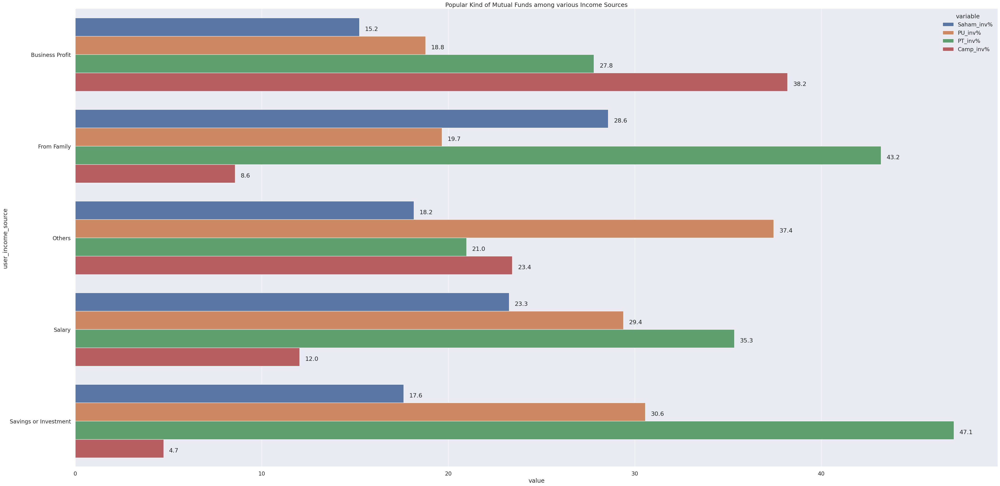

In [87]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Manipulating the data for plotting
srcm = src.melt(id_vars=['user_income_source'], 
                value_vars=['Saham_inv%', 'PU_inv%', 'PT_inv%', 'Camp_inv%'])

# Function to show value labels on the plot
def show_values_on_bars(axs, orientation="v", spacing=.01):
    def _single(ax):
        if orientation == "v":
            for patch in ax.patches:
                x = patch.get_x() + patch.get_width() / 2
                y = patch.get_y() + patch.get_height() + (patch.get_height() * spacing)
                value = '{:.1f}'.format(patch.get_height())
                ax.text(x, y, value, ha="center")
        elif orientation == "h":
            for patch in ax.patches:
                x = patch.get_x() + patch.get_width() + float(spacing)
                y = patch.get_y() + patch.get_height() - (patch.get_height() * 0.3)
                value = '{:.1f}'.format(patch.get_width())
                ax.text(x, y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

# Set Seaborn plotting aesthetics
sns.set(style='white')
sns.set(rc={'figure.figsize':(50,25)})
sns.set(font_scale=1.5)

# Create a horizontal bar plot
bar_plot = sns.barplot(x="value", y="user_income_source", hue='variable', 
                       data=srcm, errorbar=None)

# Show value labels on the bar plot
show_values_on_bars(bar_plot, "h", spacing=0.3)

# Set the plot title
bar_plot.set(title='Popular Kind of Mutual Funds among various Income Sources')

# Display the plot
plt.show()

**Insight**
1. The user whose income come from bunga simpanan	have a risk profile of Moderately Conservative in which the Investor is willing to accept small level of risk in exchange for some potential returns over the medium to long term.

2. The user whose income come from Dari Orang Tua / Anak have a risk profile of Moderate in which the Investor can tolerate moderate level of risk in exchange for relatively higher potential returns over the medium to long term.

3. The user whose income come from Dari Suami / istri have a risk profile of Moderate in which the Investor can tolerate moderate level of risk in exchange for relatively higher potential returns over the medium to long term.

4. The user whose income come from Gaji have a risk profile of Moderately Conservative in which the Investor is willing to accept small level of risk in exchange for some potential returns over the medium to long term.

5. The user whose income come from Hasil Investasi have a risk profile of Moderate in which the Investor can tolerate moderate level of risk in exchange for relatively higher potential returns over the medium to long term

6. The user whose income come from Keuntungan Bisnis have a risk profile of Moderate in which the Investor can tolerate moderate level of risk in exchange for relatively higher potential returns over the medium to long term.

7. The user whose income come from Lainnya have a risk profile of Moderately Conservative in which the Investor is willing to accept small level of risk in exchange for some potential returns over the medium to long term.

8. The user whose income come from Tabungan have a risk profile of Moderate in which the Investor can tolerate moderate level of risk in exchange for relatively higher potential returns over the medium to long term

9. The user whose income come from Undian have a risk profile of Moderate in which the Investor can tolerate moderate level of risk in exchange for relatively higher potential returns over the medium to long term

10. The user The user whose income come from Warisan have a risk profile of Moderately Aggressive in which the Investor is keen to accept high risk in order to maximize potential returns over the medium to long term.






source =  https://www.ltfs.com/companies/lnt-investment-management/articles/determining-risk-profile-of-an-investor.html

## 3. Bagaimana kondisi akhir periode pengguna dalam 2 bulan terakhir ini?


In [88]:
#lets filter the data so it only show the data from August 2021
date_aug = userdata_balance[(userdata_balance['date'] <= '2021-08-31')]
date_aug

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,date,Saham_AUM,...,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
0,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-08-30,NaN,...,NaN,NaN,NaN,NaN,10132277.00,10000000.00,NaN,NaN,10000000.00,10132277.00
1,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-08-31,NaN,...,NaN,NaN,NaN,NaN,10206945.00,10000000.00,NaN,NaN,10000000.00,10206945.00
24,50961,2021-08-20 16:22:29,Female,33,Swasta,D (100 Mil to 500 Mil),False,Salary,2021-08-31,716057.00,...,NaN,200117.00,200000.00,NaN,NaN,NaN,NaN,NaN,1000000.00,1016223.00
47,53759,2021-08-19 14:18:30,Male,29,Swasta,A (Under 10 Mil),False,Salary,2021-08-24,70038.00,...,NaN,20028.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,100068.00
48,53759,2021-08-19 14:18:30,Male,29,Swasta,A (Under 10 Mil),False,Salary,2021-08-25,70232.00,...,NaN,20053.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,100287.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114316,3913848,2021-08-27 10:50:57,Female,27,Pelajar,B (10 Mil to 50 Mil),False,Salary,2021-08-31,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30000.00,30009.00
114339,3913945,2021-08-27 11:19:32,Male,51,Others,F (Over 1 Bil),False,Business Profit,2021-08-31,40918.00,...,NaN,50029.00,50000.00,NaN,NaN,NaN,NaN,NaN,100000.00,100950.00
114362,3914022,2021-08-27 11:19:31,Male,17,Pelajar,A (Under 10 Mil),False,Others,2021-08-31,81835.00,...,NaN,50029.00,50000.00,NaN,NaN,NaN,NaN,NaN,150000.00,151868.00
114473,3914307,2021-08-27 11:53:32,Female,21,Pelajar,B (10 Mil to 50 Mil),True,Business Profit,2021-08-31,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [89]:
date_aug_end = date_aug[date_aug.groupby('user_id').date.transform('max') == date_aug.date]
date_aug_end[date_aug_end['total_transaction'] < 0]

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,date,Saham_AUM,...,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
4812,975052,2021-08-01 06:28:48,Male,37,Swasta,D (100 Mil to 500 Mil),False,Salary,2021-08-31,NaN,...,-100000.00,NaN,NaN,NaN,NaN,NaN,NaN,-100000.00,NaN,NaN
7773,1484948,2021-08-19 17:49:56,Male,20,Pelajar,A (Under 10 Mil),True,From Family,2021-08-31,40479.00,...,-1058000.00,75248.00,75000.00,NaN,NaN,NaN,NaN,-1058000.00,145000.00,145748.00
19024,3075426,2021-08-05 14:33:39,Male,25,Pelajar,C (50 Mil to 100 Mil),False,Salary,2021-08-31,NaN,...,-100000.00,NaN,NaN,-430000.00,NaN,NaN,NaN,-1000000.00,NaN,NaN
24656,3599607,2021-08-24 05:16:27,Male,21,Pelajar,A (Under 10 Mil),False,Others,2021-08-31,NaN,...,NaN,60199.00,60000.00,NaN,NaN,NaN,NaN,-210000.00,90000.00,90227.00
29528,3732132,2021-08-01 02:38:40,Male,42,Swasta,C (50 Mil to 100 Mil),False,Salary,2021-08-31,338949.00,...,-1000000.00,120444.00,120000.00,NaN,NaN,NaN,NaN,-1000000.00,500000.00,509484.00
30243,3733397,2021-08-01 17:42:06,Male,22,Pelajar,A (Under 10 Mil),True,Others,2021-08-31,NaN,...,NaN,40331.00,40000.00,NaN,NaN,NaN,NaN,-40000.00,140000.00,140549.00
32586,3736200,2021-08-14 11:38:07,Male,19,Pelajar,A (Under 10 Mil),False,Others,2021-08-31,NaN,...,-10000.00,50210.00,50000.00,-80000.00,NaN,NaN,NaN,-150000.00,120000.00,120251.00
35807,3741533,2021-08-03 19:44:42,Male,24,Pelajar,A (Under 10 Mil),True,Others,2021-08-31,NaN,...,-10000.00,NaN,NaN,-30000.00,NaN,NaN,NaN,-100000.00,NaN,NaN
35888,3741874,2021-08-02 18:17:42,Female,29,Pelajar,A (Under 10 Mil),False,Salary,2021-08-31,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,-4343762.00,-4343762.00,NaN,NaN
42130,3751189,2021-08-04 10:21:26,Female,21,Pelajar,A (Under 10 Mil),False,Others,2021-08-31,NaN,...,-20000.00,NaN,NaN,NaN,NaN,NaN,NaN,-20000.00,150000.00,150445.00


In [90]:
#Lets drop the column we wont use in the analysis
EOP_aum_invested_aug = date_aug_end.copy()
list_columns = EOP_aum_invested_aug.columns.to_list()
drop_columns = list_columns[9:22]
EOP_aum_invested_aug.drop(columns=drop_columns, axis = 1, inplace = True)

#Lets calculate the profit rate of each user (the formula is (AUM-invested)/invested) and make it a new column
EOP_aum_invested_aug['profit_rate'] = (EOP_aum_invested_aug['total_AUM'] - EOP_aum_invested_aug['total_invested']) / (EOP_aum_invested_aug['total_invested'])*100
EOP_aum_invested_aug

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,date,total_invested,total_AUM,profit_rate
1,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-08-31,10000000.00,10206945.00,2.07
24,50961,2021-08-20 16:22:29,Female,33,Swasta,D (100 Mil to 500 Mil),False,Salary,2021-08-31,1000000.00,1016223.00,1.62
52,53759,2021-08-19 14:18:30,Male,29,Swasta,A (Under 10 Mil),False,Salary,2021-08-31,100000.00,100911.00,0.91
77,54759,2021-08-11 21:16:05,Male,27,Swasta,D (100 Mil to 500 Mil),False,Salary,2021-08-31,10000000.00,10007875.00,0.08
114,61414,2021-08-08 21:26:04,Male,26,Pelajar,A (Under 10 Mil),False,Savings or Investment,2021-08-31,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
114316,3913848,2021-08-27 10:50:57,Female,27,Pelajar,B (10 Mil to 50 Mil),False,Salary,2021-08-31,30000.00,30009.00,0.03
114339,3913945,2021-08-27 11:19:32,Male,51,Others,F (Over 1 Bil),False,Business Profit,2021-08-31,100000.00,100950.00,0.95
114362,3914022,2021-08-27 11:19:31,Male,17,Pelajar,A (Under 10 Mil),False,Others,2021-08-31,150000.00,151868.00,1.25
114473,3914307,2021-08-27 11:53:32,Female,21,Pelajar,B (10 Mil to 50 Mil),True,Business Profit,2021-08-31,NaN,NaN,NaN


In [91]:
#lets filter the data so it only show the data from September 2021
date_sep = userdata_balance[(userdata_balance['date'] >= '2021-09-1')]
date_sep

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,date,Saham_AUM,...,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
2,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-09-01,NaN,...,NaN,NaN,NaN,NaN,9956556.00,10000000.00,NaN,NaN,10000000.00,9956556.00
3,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-09-02,NaN,...,NaN,NaN,NaN,NaN,9914858.00,10000000.00,NaN,NaN,10000000.00,9914858.00
4,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-09-03,NaN,...,NaN,NaN,NaN,NaN,10016360.00,10000000.00,NaN,NaN,10000000.00,10016360.00
5,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-09-06,NaN,...,NaN,NaN,NaN,NaN,9995062.00,10000000.00,NaN,NaN,10000000.00,9995062.00
6,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-09-07,NaN,...,NaN,NaN,NaN,NaN,9964287.00,10000000.00,NaN,NaN,10000000.00,9964287.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157479,4165020,2021-09-28 12:04:25,Male,24,Others,A (Under 10 Mil),True,Business Profit,2021-09-30,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
157480,4165132,2021-09-28 12:04:22,Male,18,Pelajar,A (Under 10 Mil),True,Savings or Investment,2021-09-30,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.00,10001.00
157481,4165630,2021-09-28 12:46:26,Female,28,Swasta,B (10 Mil to 50 Mil),False,From Family,2021-09-30,41625.00,...,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,NaN,100000.00,101495.00
157482,4165704,2021-09-28 12:54:00,Male,25,Swasta,B (10 Mil to 50 Mil),True,Salary,2021-09-30,NaN,...,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,NaN,10000.00,9987.00


In [92]:
#with this code, lets look at the EOP on each of the user data in august (last data of each user ends on different date each period so we use this method)
date_sep_end = date_sep[date_sep.groupby('user_id').date.transform('max') == date_sep.date]
date_sep_end

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,date,Saham_AUM,...,Pasar_Uang_transaction_amount,Pendapatan_Tetap_AUM,Pendapatan_Tetap_invested_amount,Pendapatan_Tetap_transaction_amount,Campuran_AUM,Campuran_invested_amount,Campuran_transaction_amount,total_transaction,total_invested,total_AUM
23,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-09-30,NaN,...,NaN,NaN,NaN,NaN,9943587.00,10000000.00,NaN,NaN,10000000.00,9943587.00
46,50961,2021-08-20 16:22:29,Female,33,Swasta,D (100 Mil to 500 Mil),False,Salary,2021-09-30,2063909.00,...,600000.00,1398998.00,1400000.00,1200000.00,NaN,NaN,NaN,2100000.00,4100000.00,4163510.00
74,53759,2021-08-19 14:18:30,Male,29,Swasta,A (Under 10 Mil),False,Salary,2021-09-30,73179.00,...,NaN,20109.00,20000.00,NaN,NaN,NaN,NaN,NaN,100000.00,103315.00
99,54759,2021-08-11 21:16:05,Male,27,Swasta,D (100 Mil to 500 Mil),False,Salary,2021-09-30,NaN,...,2000000.00,NaN,NaN,NaN,NaN,NaN,NaN,2000000.00,12000000.00,12049049.00
136,61414,2021-08-08 21:26:04,Male,26,Pelajar,A (Under 10 Mil),False,Savings or Investment,2021-09-30,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
157479,4165020,2021-09-28 12:04:25,Male,24,Others,A (Under 10 Mil),True,Business Profit,2021-09-30,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
157480,4165132,2021-09-28 12:04:22,Male,18,Pelajar,A (Under 10 Mil),True,Savings or Investment,2021-09-30,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10000.00,10001.00
157481,4165630,2021-09-28 12:46:26,Female,28,Swasta,B (10 Mil to 50 Mil),False,From Family,2021-09-30,41625.00,...,NaN,49869.00,50000.00,NaN,NaN,NaN,NaN,NaN,100000.00,101495.00
157482,4165704,2021-09-28 12:54:00,Male,25,Swasta,B (10 Mil to 50 Mil),True,Salary,2021-09-30,NaN,...,NaN,9987.00,10000.00,NaN,NaN,NaN,NaN,NaN,10000.00,9987.00


In [93]:
#Lets drop the column we wont use in the analysis
EOP_aum_invested_sep = date_sep_end.copy()
list_columns = EOP_aum_invested_sep.columns.to_list()
drop_columns = list_columns[9:22]
EOP_aum_invested_sep.drop(columns=drop_columns, axis = 1, inplace = True)

#Lets calculate the profit rate of each user (the formula is (AUM-invested)/invested) and make it a new column
EOP_aum_invested_sep['profit_rate'] = (EOP_aum_invested_sep['total_AUM'] - EOP_aum_invested_sep['total_invested']) / (EOP_aum_invested_sep['total_invested'])*100
EOP_aum_invested_sep

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,date,total_invested,total_AUM,profit_rate
23,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-09-30,10000000.00,9943587.00,-0.56
46,50961,2021-08-20 16:22:29,Female,33,Swasta,D (100 Mil to 500 Mil),False,Salary,2021-09-30,4100000.00,4163510.00,1.55
74,53759,2021-08-19 14:18:30,Male,29,Swasta,A (Under 10 Mil),False,Salary,2021-09-30,100000.00,103315.00,3.31
99,54759,2021-08-11 21:16:05,Male,27,Swasta,D (100 Mil to 500 Mil),False,Salary,2021-09-30,12000000.00,12049049.00,0.41
136,61414,2021-08-08 21:26:04,Male,26,Pelajar,A (Under 10 Mil),False,Savings or Investment,2021-09-30,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
157479,4165020,2021-09-28 12:04:25,Male,24,Others,A (Under 10 Mil),True,Business Profit,2021-09-30,NaN,NaN,NaN
157480,4165132,2021-09-28 12:04:22,Male,18,Pelajar,A (Under 10 Mil),True,Savings or Investment,2021-09-30,10000.00,10001.00,0.01
157481,4165630,2021-09-28 12:46:26,Female,28,Swasta,B (10 Mil to 50 Mil),False,From Family,2021-09-30,100000.00,101495.00,1.49
157482,4165704,2021-09-28 12:54:00,Male,25,Swasta,B (10 Mil to 50 Mil),True,Salary,2021-09-30,10000.00,9987.00,-0.13


In [94]:
#lets merge the august and september by using concat (because the data have the same column)
EOP_aug_sep = pd.concat([EOP_aum_invested_aug, EOP_aum_invested_sep], ignore_index=True)
EOP_aug_sep

,user_id,registration_import_datetime,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,date,total_invested,total_AUM,profit_rate
0,50701,2021-08-24 23:57:43,Female,28,IRT,B (10 Mil to 50 Mil),False,Salary,2021-08-31,10000000.00,10206945.00,2.07
1,50961,2021-08-20 16:22:29,Female,33,Swasta,D (100 Mil to 500 Mil),False,Salary,2021-08-31,1000000.00,1016223.00,1.62
2,53759,2021-08-19 14:18:30,Male,29,Swasta,A (Under 10 Mil),False,Salary,2021-08-31,100000.00,100911.00,0.91
3,54759,2021-08-11 21:16:05,Male,27,Swasta,D (100 Mil to 500 Mil),False,Salary,2021-08-31,10000000.00,10007875.00,0.08
4,61414,2021-08-08 21:26:04,Male,26,Pelajar,A (Under 10 Mil),False,Savings or Investment,2021-08-31,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
11260,4165020,2021-09-28 12:04:25,Male,24,Others,A (Under 10 Mil),True,Business Profit,2021-09-30,NaN,NaN,NaN
11261,4165132,2021-09-28 12:04:22,Male,18,Pelajar,A (Under 10 Mil),True,Savings or Investment,2021-09-30,10000.00,10001.00,0.01
11262,4165630,2021-09-28 12:46:26,Female,28,Swasta,B (10 Mil to 50 Mil),False,From Family,2021-09-30,100000.00,101495.00,1.49
11263,4165704,2021-09-28 12:54:00,Male,25,Swasta,B (10 Mil to 50 Mil),True,Salary,2021-09-30,10000.00,9987.00,-0.13


In [95]:
#lets group by the dataframe by user_occupation to look at the profit rate per occupation, and drop the column we dont use too
EOP_profit_occupation = EOP_aug_sep.groupby(['user_occupation'],as_index=False).mean()
EOP_profit_occupation = EOP_profit_occupation.drop(columns=['user_age','total_invested','total_AUM'], axis = 1)
EOP_profit_occupation

/tmp/ipykernel_2903/3867646262.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,user_occupation,referral_code_used,profit_rate
0,Guru,0.31,1.10
1,IRT,0.48,0.89
2,Others,0.45,0.85
3,PNS,0.25,1.04
4,Pelajar,0.33,0.89
5,Pengusaha,0.34,0.94
6,Pensiunan,0.20,1.33
7,Swasta,0.28,0.99
8,TNI/Polisi,0.08,1.14


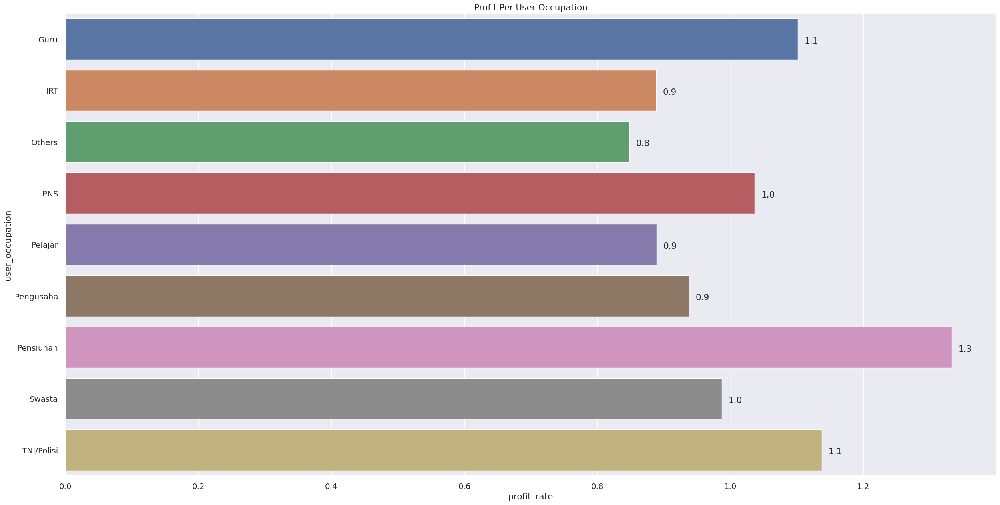

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Function to show value labels on the plot
def show_values_on_bars(axs, orientation="v", spacing=.01):
    def _single(ax):
        if orientation == "v":
            for patch in ax.patches:
                x = patch.get_x() + patch.get_width() / 2
                y = patch.get_y() + patch.get_height() + (patch.get_height() * spacing)
                value = '{:.1f}'.format(patch.get_height())
                ax.text(x, y, value, ha="center")
        elif orientation == "h":
            for patch in ax.patches:
                x = patch.get_x() + patch.get_width() + float(spacing)
                y = patch.get_y() + patch.get_height() - (patch.get_height() * 0.4)
                value = '{:.1f}'.format(patch.get_width())
                ax.text(x, y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

# Set Seaborn plotting aesthetics
sns.set(style='white')
sns.set(rc={'figure.figsize':(30,15)})
sns.set(font_scale=1.3)

# Create a horizontal bar plot
bar_plot = sns.barplot(x="profit_rate", y="user_occupation", data=EOP_profit_occupation, errorbar=None)

# Show value labels on the bar plot
show_values_on_bars(bar_plot, "h", spacing=0.01)

# Set the plot title
bar_plot.set(title='Profit Per-User Occupation')

# Display the plot
plt.show()

**Insight**

1. The user who work as Guru	have an average profit rate of 1.10%
2. The user who work as IRT	have an average profit rate of 0.88%
3. The user who work as Others have an average profit rate of 0.85%
4. The user who work as PNS	have an average profit rate of 1.04%
5. The user who work as Pelajar	have an average profit rate of 0.89%
6. The user who work as Pengusaha	have an average profit rate of 0.94%
7. The user who work as Pensiunan	have an average profit rate of 1.57% in which it was the highest among other occupation
8. The user who work as Swasta have an average profit rate of 0.99%
9. The user who work as TNI/Polisi have an average profit rate of 1.14% in which it was the second-highest among other occupation

In [97]:
#lets group by the dataframe by user_income_range to look at the profit rate per income range, and drop the column we dont use too
EOP_profit_inc = EOP_aug_sep.groupby(['user_income_range'],as_index=False).mean()
EOP_profit_inc = EOP_profit_inc.drop(columns=['user_age','total_invested','total_AUM'], axis = 1)
EOP_profit_inc

/tmp/ipykernel_2903/699399525.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,user_income_range,referral_code_used,profit_rate
0,A (Under 10 Mil),0.35,0.90
1,B (10 Mil to 50 Mil),0.34,0.93
2,C (50 Mil to 100 Mil),0.31,0.94
3,D (100 Mil to 500 Mil),0.31,0.86
4,E (500 Mil to 1 Bil),0.27,0.96
5,F (Over 1 Bil),0.17,1.11


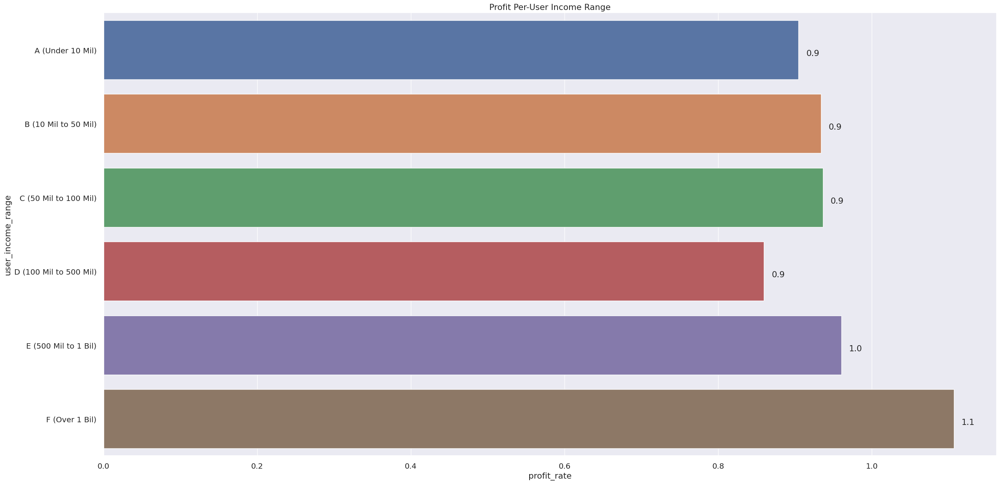

In [98]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Function to show value labels on the plot
def show_values_on_bars(axs, orientation="v", spacing=.01):
    def _single(ax):
        if orientation == "v":
            for patch in ax.patches:
                x = patch.get_x() + patch.get_width() / 2
                y = patch.get_y() + patch.get_height() + (patch.get_height() * spacing)
                value = '{:.1f}'.format(patch.get_height())
                ax.text(x, y, value, ha="center")
        elif orientation == "h":
            for patch in ax.patches:
                x = patch.get_x() + patch.get_width() + float(spacing)
                y = patch.get_y() + patch.get_height() - (patch.get_height() * 0.4)
                value = '{:.1f}'.format(patch.get_width())
                ax.text(x, y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

# Set Seaborn plotting aesthetics
sns.set(style='white')
sns.set(rc={'figure.figsize':(30,15)})
sns.set(font_scale=1.3)

# Create a horizontal bar plot
bar_plot = sns.barplot(x="profit_rate", y="user_income_range", data=EOP_profit_inc, errorbar=None)

# Show value labels on the bar plot
show_values_on_bars(bar_plot, "h", spacing=0.01)

# Set the plot title
bar_plot.set(title='Profit Per-User Income Range')

# Display the plot
plt.show()

**Insight**

1. The user who has income range of < 10 Juta	have an average profit rate of 0.90%
2. The user who has income range of Rp 10 Juta - 50 Juta an average profit rate of	0.93%
3. The user who has income range of > Rp 50 Juta - 100 Juta an average profit rate of	0.94%, in which it is the second highest among other income range
4. The user who has income range of > Rp 100 Juta - 500 Juta an average profit rate of	0.85%
5. The user who has income range of > Rp 500 Juta - 1 Miliar an average profit rate of	0.90%
6. The user who has income range of > Rp 1 Miliar an average profit rate of	1.11 %, in which it is the highest among other income range


In [99]:
#lets group by the dataframe by user_income_source to look at the profit rate per income source, and drop the column we dont use too
EOP_profit_src = EOP_aug_sep.groupby(['user_income_source'],as_index=False).mean()
EOP_profit_src = EOP_profit_src.drop(columns=['user_age','total_invested','total_AUM'], axis = 1)
EOP_profit_src

/tmp/ipykernel_2903/1150208292.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,user_income_source,referral_code_used,profit_rate
0,Business Profit,0.44,0.81
1,From Family,0.33,0.92
2,Others,0.31,0.90
3,Salary,0.32,0.95
4,Savings or Investment,0.37,0.74


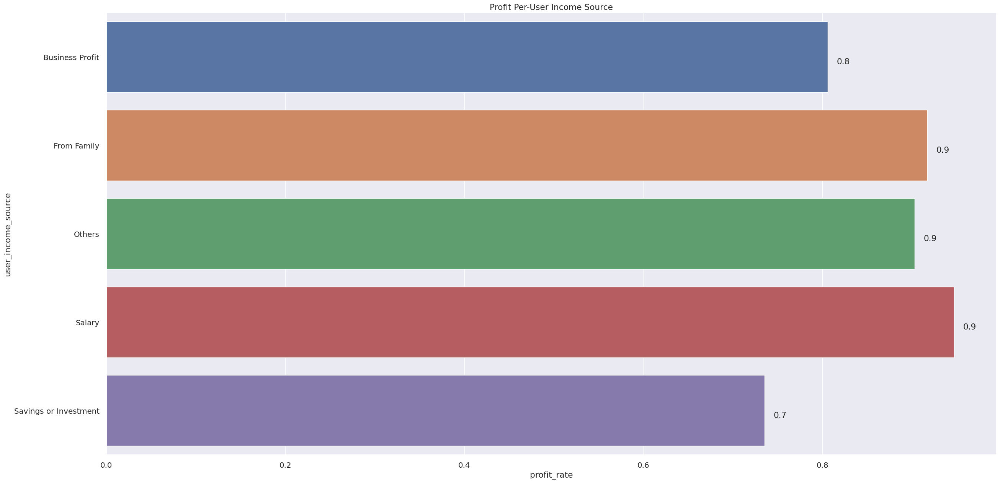

In [100]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Function to show value labels on the plot
def show_values_on_bars(axs, orientation="v", spacing=.01):
    def _single(ax):
        if orientation == "v":
            for patch in ax.patches:
                x = patch.get_x() + patch.get_width() / 2
                y = patch.get_y() + patch.get_height() + (patch.get_height() * spacing)
                value = '{:.1f}'.format(patch.get_height())
                ax.text(x, y, value, ha="center")
        elif orientation == "h":
            for patch in ax.patches:
                x = patch.get_x() + patch.get_width() + float(spacing)
                y = patch.get_y() + patch.get_height() - (patch.get_height() * 0.4)
                value = '{:.1f}'.format(patch.get_width())
                ax.text(x, y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

# Set Seaborn plotting aesthetics
sns.set(style='white')
sns.set(rc={'figure.figsize':(30,15)})
sns.set(font_scale=1.3)

# Create a horizontal bar plot
bar_plot = sns.barplot(x="profit_rate", y="user_income_source", data=EOP_profit_src, errorbar=None)

# Show value labels on the bar plot
show_values_on_bars(bar_plot, "h", spacing=0.01)

# Set the plot title
bar_plot.set(title='Profit Per-User Income Source')

# Display the plot
plt.show()

## 4. What is the monthly transaction trend among various demography of user?

What days in the month that user most likely to purchase mutual accounts?

In [101]:
#lets group by the data first and filter the positive transaction we use
transt = userdata_balance.copy()
transt_buy =transt[(transt['total_transaction'] >= 0)]
buy_user_freq = transt_buy.groupby(['date'],as_index=False).count().sort_values(by=['date'],ascending=True)

#lets drop the columns we dont use so it look cleaner
buy_freq = buy_user_freq.copy()
list_columns = buy_freq.columns.to_list()
drop_columns = list_columns[1:21]
drop_columns2 = list_columns[22:24]
buy_freq.drop(columns=drop_columns, axis = 1, inplace = True)
buy_freq.drop(columns=drop_columns2, axis = 1, inplace = True)
buy_freq.rename(columns={'total_transaction': 'buy_frequency'}, inplace=True, errors='raise')
buy_freq.sort_values(by=['buy_frequency'],ascending=False)

,date,buy_frequency
38,2021-09-30,628
37,2021-09-29,410
32,2021-09-22,385
22,2021-09-08,372
27,2021-09-15,347
17,2021-09-01,296
19,2021-09-03,273
29,2021-09-17,257
34,2021-09-24,254
36,2021-09-28,248


In [102]:
import plotly.express as px

# Filter data for August and September
buy_freq_aug = buy_freq[buy_freq['date'] <= '2021-08-31']
buy_freq_sep = buy_freq[buy_freq['date'] >= '2021-09-01']

# Create a line plot for buy frequency in August using Plotly
fig = px.line(buy_freq_aug, x="date", y="buy_frequency", title="Buy Frequency in August")
fig.show()

In [103]:
import plotly.express as px

# Create a line plot for buy frequency in September using Plotly
fig = px.line(buy_freq_sep, x="date", y="buy_frequency", title="Buy Frequency in September")
fig.show()


In [104]:
# lets see what kind of user likes to buy mutual funds in early date of month (date 1 till 10)
buy_user_freq_e =  transt_buy[(transt_buy['date'] >= '2021-08-1') & (transt_buy['date'] <= '2021-08-10') |
                                     (transt_buy['date'] >= '2021-09-1') & (transt_buy['date'] <= '2021-09-10')]
buy_user_freq_early = buy_user_freq_e.groupby(['date','user_occupation','user_income_range','user_income_source'],as_index=False).count()

#lets drop the column we dont use and rename the total transaction as frequency
list_columns = buy_user_freq_early.columns.to_list()
drop_columns = list_columns[4:21]
drop_columns2 = list_columns[22:24]
buy_user_freq_early.drop(columns=drop_columns, axis = 1, inplace = True)
buy_user_freq_early.drop(columns=drop_columns2, axis = 1, inplace = True)
buy_user_freq_early.rename(columns={'total_transaction': 'buy_frequency_early_month'}, inplace=True, errors='raise')
buy_user_freq_early

,date,user_occupation,user_income_range,user_income_source,buy_frequency_early_month
0,2021-08-05,Others,C (50 Mil to 100 Mil),Salary,1
1,2021-08-05,Pelajar,A (Under 10 Mil),Others,2
2,2021-08-05,Pelajar,A (Under 10 Mil),Salary,1
3,2021-08-05,Pelajar,C (50 Mil to 100 Mil),Salary,1
4,2021-08-05,Swasta,A (Under 10 Mil),From Family,1
...,...,...,...,...,...
457,2021-09-10,Swasta,C (50 Mil to 100 Mil),From Family,1
458,2021-09-10,Swasta,C (50 Mil to 100 Mil),Salary,15
459,2021-09-10,Swasta,D (100 Mil to 500 Mil),Salary,11
460,2021-09-10,Swasta,D (100 Mil to 500 Mil),Savings or Investment,1


In [105]:
# lets see what kind of user likes to buy mutual funds in middle date of month (date 11 till 20)
buy_user_freq_m =  transt_buy[(transt_buy['date'] >= '2021-08-11') & (transt_buy['date'] <= '2021-08-20') |
                                     (transt_buy['date'] >= '2021-09-11') & (transt_buy['date'] <= '2021-09-20')]
buy_user_freq_middle = buy_user_freq_m.groupby(['date','user_occupation','user_income_range','user_income_source'],as_index=False).count()

#lets drop the column we dont use and rename the total transaction as frequency
list_columns = buy_user_freq_middle.columns.to_list()
drop_columns = list_columns[4:21]
drop_columns2 = list_columns[22:24]
buy_user_freq_middle.drop(columns=drop_columns, axis = 1, inplace = True)
buy_user_freq_middle.drop(columns=drop_columns2, axis = 1, inplace = True)
buy_user_freq_middle.rename(columns={'total_transaction': 'buy_frequency_middle_month'}, inplace=True, errors='raise')
buy_user_freq_middle

,date,user_occupation,user_income_range,user_income_source,buy_frequency_middle_month
0,2021-08-11,Guru,C (50 Mil to 100 Mil),Salary,2
1,2021-08-11,IRT,B (10 Mil to 50 Mil),From Family,1
2,2021-08-11,Others,A (Under 10 Mil),Others,1
3,2021-08-11,Others,A (Under 10 Mil),Salary,2
4,2021-08-11,Others,B (10 Mil to 50 Mil),Salary,2
...,...,...,...,...,...
521,2021-09-20,Swasta,C (50 Mil to 100 Mil),From Family,1
522,2021-09-20,Swasta,C (50 Mil to 100 Mil),Salary,16
523,2021-09-20,Swasta,D (100 Mil to 500 Mil),Salary,10
524,2021-09-20,Swasta,E (500 Mil to 1 Bil),Salary,2


In [106]:
# lets see what kind of user likes to buy mutual funds in middle date of month (date 21 till end of month)
buy_user_freq_l =  transt_buy[(transt_buy['date'] >= '2021-08-21') & (transt_buy['date'] <= '2021-08-31') |
                                     (transt_buy['date'] >= '2021-09-21') & (transt_buy['date'] <= '2021-09-30')]
buy_user_freq_late = buy_user_freq_l.groupby(['date','user_occupation','user_income_range','user_income_source'],as_index=False).count()

#lets drop the column we dont use and rename the total transaction as frequency
list_columns = buy_user_freq_late.columns.to_list()
drop_columns = list_columns[4:21]
drop_columns2 = list_columns[22:24]
buy_user_freq_late.drop(columns=drop_columns, axis = 1, inplace = True)
buy_user_freq_late.drop(columns=drop_columns2, axis = 1, inplace = True)
buy_user_freq_late.rename(columns={'total_transaction': 'buy_frequency_late_month'}, inplace=True, errors='raise')
buy_user_freq_late

,date,user_occupation,user_income_range,user_income_source,buy_frequency_late_month
0,2021-08-23,IRT,A (Under 10 Mil),From Family,2
1,2021-08-23,IRT,B (10 Mil to 50 Mil),From Family,2
2,2021-08-23,IRT,C (50 Mil to 100 Mil),From Family,2
3,2021-08-23,Others,A (Under 10 Mil),Others,1
4,2021-08-23,Others,A (Under 10 Mil),Salary,2
...,...,...,...,...,...
764,2021-09-30,Swasta,C (50 Mil to 100 Mil),Savings or Investment,1
765,2021-09-30,Swasta,D (100 Mil to 500 Mil),Business Profit,1
766,2021-09-30,Swasta,D (100 Mil to 500 Mil),Salary,39
767,2021-09-30,Swasta,E (500 Mil to 1 Bil),Salary,3


#### What time in month that user with different occupation like to purchase mutual funds?

In [107]:
#lets groupby the 3 dataset to user_occupation and drop the column we dont use
buy_occ_freq_early = buy_user_freq_early.groupby(['user_occupation'],as_index=False).count()
buy_occ_freq_early.drop(columns=['date','user_income_range','user_income_source'], axis = 1,inplace=True)

buy_occ_freq_middle = buy_user_freq_middle.groupby(['user_occupation'],as_index=False).count()
buy_occ_freq_middle.drop(columns=['date','user_income_range','user_income_source'], axis = 1,inplace=True)

buy_occ_freq_late = buy_user_freq_late.groupby(['user_occupation'],as_index=False).count()
buy_occ_freq_late.drop(columns=['date','user_income_range','user_income_source'], axis = 1,inplace=True)

#lets merge the 3 dataset
buy_occ1 = buy_occ_freq_early.merge(buy_occ_freq_middle, how='outer',on='user_occupation')
buy_occ_freq_monthly = buy_occ1.merge(buy_occ_freq_late, how='outer',on='user_occupation')
buy_occ_freq_monthly

,user_occupation,buy_frequency_early_month,buy_frequency_middle_month,buy_frequency_late_month
0,Guru,13,21,31
1,IRT,49,54,107
2,Others,79,77,120
3,PNS,27,34,48
4,Pelajar,125,145,197
5,Pengusaha,57,67,94
6,Pensiunan,1,1,1
7,Swasta,105,122,162
8,TNI/Polisi,6,5,9


In [108]:
import plotly.express as px

# Melt the DataFrame
buy_occ_freq_monthly_melt = buy_occ_freq_monthly.melt(
    id_vars=['user_occupation'],
    value_vars=['buy_frequency_early_month', 'buy_frequency_middle_month', 'buy_frequency_late_month']
)

# Create a horizontal barplot using Plotly
fig = px.bar(
    buy_occ_freq_monthly_melt,
    x="value",
    y="user_occupation",
    color='variable',
    title='Days in month that users with different occupations like to purchase mutual funds',
    labels={'value': 'Frequency'},
    text='value',  # Show values on the bars
)

# Customize the layout
fig.update_layout(
    xaxis_title=None,  # Remove x-axis label
    yaxis_title=None,  # Remove y-axis label
    legend_title=None,  # Remove legend title
)

# Show the plot
fig.show()

#### What time in month that user with different income range like to purchase mutual funds?

In [109]:
#lets groupby the 3 dataset to user_income_range and drop the column we dont use
buy_inc_freq_early = buy_user_freq_early.groupby(['user_income_range'],as_index=False).count()
buy_inc_freq_early.drop(columns=['date','user_occupation','user_income_source'], axis = 1,inplace=True)

buy_inc_freq_middle = buy_user_freq_middle.groupby(['user_income_range'],as_index=False).count()
buy_inc_freq_middle.drop(columns=['date','user_occupation','user_income_source'], axis = 1,inplace=True)

buy_inc_freq_late = buy_user_freq_late.groupby(['user_income_range'],as_index=False).count()
buy_inc_freq_late.drop(columns=['date','user_occupation','user_income_source'], axis = 1,inplace=True)

#lets merge the 3 dataset
buy_inc1 = buy_inc_freq_early.merge(buy_inc_freq_middle, how='outer',on='user_income_range')
buy_inc_freq_monthly = buy_inc1.merge(buy_inc_freq_late, how='outer',on='user_income_range')
buy_inc_freq_monthly

,user_income_range,buy_frequency_early_month,buy_frequency_middle_month,buy_frequency_late_month
0,A (Under 10 Mil),148,156,212
1,B (10 Mil to 50 Mil),128,144,237
2,C (50 Mil to 100 Mil),105,117,166
3,D (100 Mil to 500 Mil),64,82,105
4,E (500 Mil to 1 Bil),13,25,43
5,F (Over 1 Bil),4,2,6


##### Days in month that user with different Income Range like to purchase mutual funds Barplot

In [110]:
import plotly.express as px

# Melt the DataFrame
buy_inc_freq_monthly_melt = buy_inc_freq_monthly.melt(
    id_vars=['user_income_range'],
    value_vars=['buy_frequency_early_month', 'buy_frequency_middle_month', 'buy_frequency_late_month']
)

# Create a horizontal barplot using Plotly
fig = px.bar(
    buy_inc_freq_monthly_melt,
    x="value",
    y="user_income_range",
    color='variable',
    title='Days in month that users with different income ranges like to purchase mutual funds',
    labels={'value': 'Frequency'},
    text='value',  # Show values on the bars
)

# Customize the layout
fig.update_layout(
    xaxis_title=None,  # Remove x-axis label
    yaxis_title=None,  # Remove y-axis label
    legend_title=None,  # Remove legend title
)

# Show the plot
fig.show()


#### What time in month that user with different income source like to purchase mutual funds?

In [111]:
#lets groupby the 3 dataset to user_income_source and drop the column we dont use
buy_src_freq_early = buy_user_freq_early.groupby(['user_income_source'],as_index=False).count()
buy_src_freq_early.drop(columns=['date','user_occupation','user_income_range'], axis = 1,inplace=True)

buy_src_freq_middle = buy_user_freq_middle.groupby(['user_income_source'],as_index=False).count()
buy_src_freq_middle.drop(columns=['date','user_occupation','user_income_range'], axis = 1,inplace=True)

buy_src_freq_late = buy_user_freq_late.groupby(['user_income_source'],as_index=False).count()
buy_src_freq_late.drop(columns=['date','user_occupation','user_income_range'], axis = 1,inplace=True)

#lets merge the 3 dataset
buy_src1 = buy_src_freq_early.merge(buy_src_freq_middle, how='outer',on='user_income_source')
buy_src_freq_monthly = buy_src1.merge(buy_src_freq_late, how='outer',on='user_income_source')

#there is a Null value in this dataframe, lets fill it with 0 or zero and change the datatype to int
buy_src_freq_monthly = buy_src_freq_monthly.fillna(0)
buy_src_freq_monthly['buy_frequency_early_month'] = buy_src_freq_monthly['buy_frequency_early_month'].apply(pd.to_numeric).astype('Int64')
buy_src_freq_monthly


,user_income_source,buy_frequency_early_month,buy_frequency_middle_month,buy_frequency_late_month
0,Business Profit,88,118,181
1,From Family,78,78,133
2,Others,59,66,89
3,Salary,206,231,318
4,Savings or Investment,31,33,48


In [112]:
import plotly.express as px

# Melt the DataFrame
buy_src_freq_monthly_melt = buy_src_freq_monthly.melt(
    id_vars=['user_income_source'],
    value_vars=['buy_frequency_early_month', 'buy_frequency_middle_month', 'buy_frequency_late_month']
)

# Create a horizontal barplot using Plotly
fig = px.bar(
    buy_src_freq_monthly_melt,
    x="value",
    y="user_income_source",
    color='variable',
    title='Days in the month when users with different income sources like to purchase mutual funds',
    labels={'value': 'Frequency'},
    text='value',  # Show values on the bars
)

# Customize the layout
fig.update_layout(
    xaxis_title=None,  # Remove x-axis label
    yaxis_title=None,  # Remove y-axis label
    legend_title=None,  # Remove legend title
)

# Show the plot
fig.show()

In [113]:
#lets filter the sell transcation data and group by the data first
transt = userdata_balance.copy()
transt_sell =transt[(transt['total_transaction'] <= 0)]
sell_user_freq = transt_buy.groupby(['date'],as_index=False).count().sort_values(by=['date'],ascending=True)

#lets drop the columns we dont use and change the column name total_transaction to sell_frequency
sell_freq = sell_user_freq.copy()
list_columns = sell_freq.columns.to_list()
drop_columns = list_columns[1:21]
drop_columns2 = list_columns[22:24]
sell_freq.drop(columns=drop_columns, axis = 1, inplace = True)
sell_freq.drop(columns=drop_columns2, axis = 1, inplace = True)
sell_freq.rename(columns={'total_transaction': 'sell_frequency'}, inplace=True, errors='raise')
sell_freq.sort_values(by=['sell_frequency'],ascending=False)

,date,sell_frequency
38,2021-09-30,628
37,2021-09-29,410
32,2021-09-22,385
22,2021-09-08,372
27,2021-09-15,347
17,2021-09-01,296
19,2021-09-03,273
29,2021-09-17,257
34,2021-09-24,254
36,2021-09-28,248


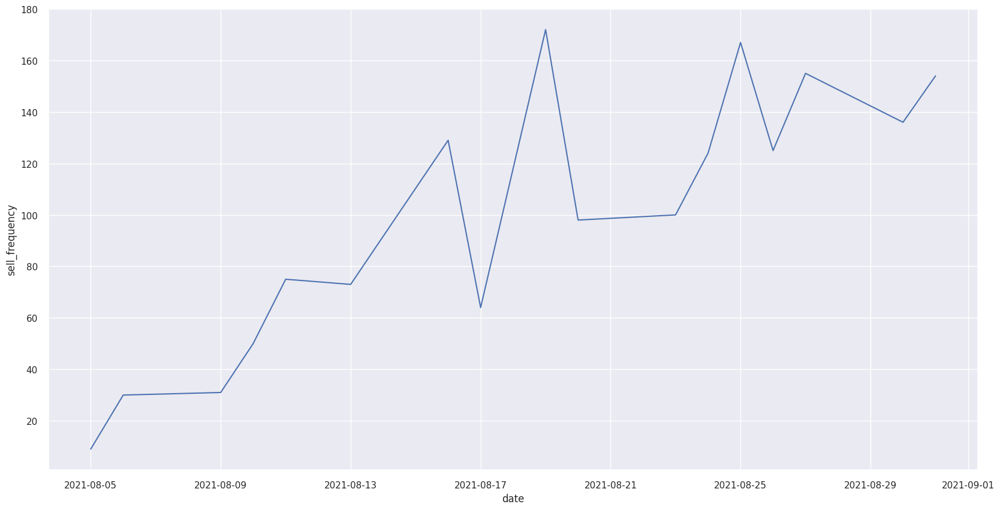

In [114]:
#lets filter and divide the previous dataframe into months
sell_freq_aug = sell_freq[(sell_freq['date'] <= '2021-08-31')]
sell_freq_sep = sell_freq[(sell_freq['date'] >= '2021-09-1')]

#lets make the plot for sell frequency in August
sns.set(rc={'figure.figsize':(20,10)})
sns.lineplot(x = "date", y = "sell_frequency",data=sell_freq_aug, markers=True)
sns.set(style='dark',)
plt.show()

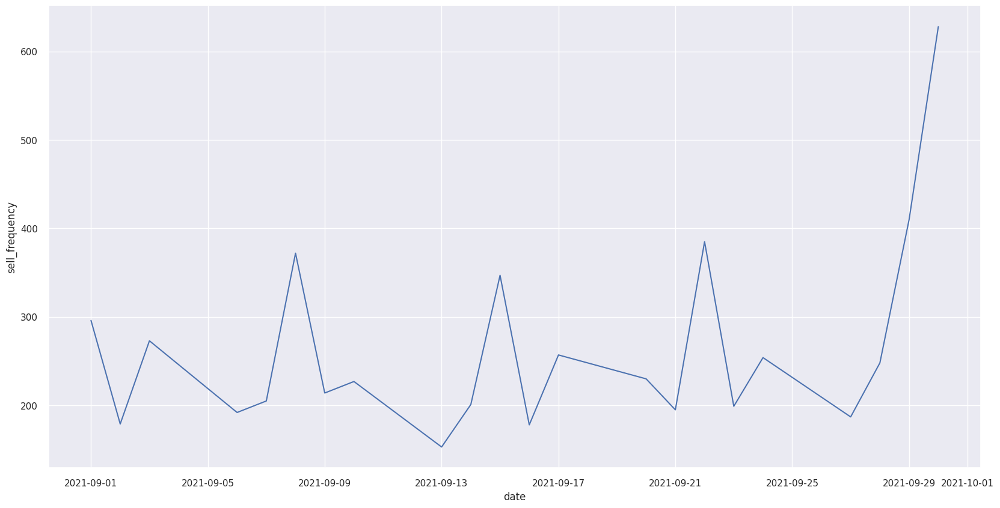

In [115]:
#lets make the plot for sell frequency in September
sns.set(rc={'figure.figsize':(20,10)})
sns.lineplot(x = "date", y = "sell_frequency",data=sell_freq_sep, markers=True)
sns.set(style='dark',)
plt.show()

**Insight:**

1. Day in August who has the highest sell transaction happened are on day 25, 27, and 31 in which there is approximately 155 to 169 sell transaction happened daily.

1. Day in September who has the highest buy transaction happened are on day 08, ,15 , 22, 29, and 30 in which there is approximately 373 to 411.

1. The most often time of user sells their mutual funds account are occured in Wednesday, because most of the day with high sell transaction in August and September are occured in a Wednesday

1. From the graph we also could conclude that there is more sell transaction occured in the middle or late day of the month.

# Clustering Using K-Means

## Prepare Datset

In [116]:
df = monthly_user_data.copy()
df

,user_id,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,month,monthly_buy_Saham,monthly_buy_Pasar_Uang,...,EOP_Pasar_Uang_profit,EOP_Pendapatan_Tetap_AUM,EOP_Pendapatan_Tetap_invested_amount,EOP_Pendapatan_Tetap_profit,EOP_Campuran_AUM,EOP_Campuran_invested_amount,EOP_Campuran_profit,EOP_total_AUM,EOP_total_invested_amount,EOP_total_profit
0,1111674,Male,22,Others,B (10 Mil to 50 Mil),False,Salary,Aug 2021,40000.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1,1119474,Female,23,Pelajar,A (Under 10 Mil),False,Salary,Aug 2021,30000.00,10000.00,...,30.00,110472.00,110000.00,472.00,0.00,0.00,0.00,202825.00,200000.00,2825.00
2,1134964,Male,18,Pelajar,A (Under 10 Mil),False,Others,Aug 2021,100000.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,100962.00,100000.00,962.00
3,1161960,Male,21,Pelajar,A (Under 10 Mil),False,Salary,Aug 2021,330000.00,90000.00,...,91.00,536849.00,530000.00,6849.00,0.00,0.00,0.00,1007782.00,1000000.00,7782.00
4,1196178,Male,26,Pelajar,B (10 Mil to 50 Mil),False,Salary,Aug 2021,11384124.00,3694690.00,...,6396.00,19542405.00,19487387.00,55018.00,0.00,0.00,0.00,26297852.00,26199402.00,98450.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11260,975052,Male,37,Swasta,D (100 Mil to 500 Mil),False,Salary,Sep 2021,NaN,NaN,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
11261,978972,Male,22,Pelajar,A (Under 10 Mil),False,Salary,Sep 2021,NaN,NaN,...,12.00,29949.00,30000.00,-51.00,0.00,0.00,0.00,101884.00,100000.00,1884.00
11262,981852,Female,23,Swasta,C (50 Mil to 100 Mil),False,Salary,Sep 2021,NaN,NaN,...,132.00,0.00,0.00,0.00,0.00,0.00,0.00,100132.00,100000.00,132.00
11263,988940,Male,27,Swasta,B (10 Mil to 50 Mil),False,Salary,Sep 2021,NaN,NaN,...,353.00,159974.00,160000.00,-26.00,0.00,0.00,0.00,501937.00,500000.00,1937.00


## Data Preprocessing

In [117]:
df['total_buy'] = df['monthly_total_buy']
df['age'] = df['user_age']

#lets drop the column we dont use for the cluster analysis
list_columns = df.columns.to_list()
drop_columns = list_columns[1:43]
clustering = df.drop(columns=drop_columns, axis = 1)
clustering = df.fillna(0)
gclustering = df.groupby(['user_id','age'],as_index=False).mean()
gclustering

/tmp/ipykernel_2903/1544035138.py:9: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,user_id,age,user_age,referral_code_used,monthly_buy_Saham,monthly_buy_Pasar_Uang,monthly_buy_Pendapatan_Tetap,monthly_buy_Campuran,monthly_total_buy,monthly_sell_Saham,...,EOP_Pendapatan_Tetap_AUM,EOP_Pendapatan_Tetap_invested_amount,EOP_Pendapatan_Tetap_profit,EOP_Campuran_AUM,EOP_Campuran_invested_amount,EOP_Campuran_profit,EOP_total_AUM,EOP_total_invested_amount,EOP_total_profit,total_buy
0,1004326,30,30.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,...,90461.50,90000.00,461.50,0.00,0.00,0.00,203392.00,200000.00,3392.00,NaN
1,1005053,31,31.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,...,39940.00,40000.00,-60.00,0.00,0.00,0.00,203671.00,200000.00,3671.00,NaN
2,1005165,22,22.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,...,70149.00,70000.00,149.00,0.00,0.00,0.00,100523.00,100000.00,523.00,NaN
3,1018814,20,20.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,650319.50,650000.00,319.50,0.00
4,1023627,33,33.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,...,0.00,0.00,0.00,0.00,0.00,0.00,101856.00,100000.00,1856.00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8214,988940,27,27.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,...,159974.00,160000.00,-26.00,0.00,0.00,0.00,501937.00,500000.00,1937.00,NaN
8215,989618,29,29.00,0.00,480000.00,100000.00,1420000.00,0.00,2000000.00,0.00,...,1120540.00,1140000.00,-19460.00,0.00,0.00,0.00,1994151.50,2000000.00,-5848.50,2000000.00
8216,990466,33,33.00,0.00,770000.00,150000.00,580000.00,0.00,1500000.00,0.00,...,479906.00,480000.00,-94.00,0.00,0.00,0.00,1269228.00,1250000.00,19228.00,1500000.00
8217,99245,25,25.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,...,501670.00,500000.00,1670.00,0.00,0.00,0.00,1002610.00,1000000.00,2610.00,NaN


In [118]:
#transform the categorical data to numerical using cat.codes
#gclustering['gender'] = gclustering['gender'].astype('category')
#gclustering['gender'] = gclustering['gender'].cat.codes
gclustering = gclustering.set_index('user_id')
group_clustering = gclustering[(gclustering['total_buy']>=1)]
group_clustering

,age,user_age,referral_code_used,monthly_buy_Saham,monthly_buy_Pasar_Uang,monthly_buy_Pendapatan_Tetap,monthly_buy_Campuran,monthly_total_buy,monthly_sell_Saham,monthly_sell_Pasar_Uang,...,EOP_Pendapatan_Tetap_AUM,EOP_Pendapatan_Tetap_invested_amount,EOP_Pendapatan_Tetap_profit,EOP_Campuran_AUM,EOP_Campuran_invested_amount,EOP_Campuran_profit,EOP_total_AUM,EOP_total_invested_amount,EOP_total_profit,total_buy
user_id,,,,,,,,,,,,,,,,,,,,,
1024581,25,25.00,1.00,0.00,0.00,25000.00,0.00,25000.00,-50000.00,-10000.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,25000.00
103108,42,42.00,0.00,5000000.00,0.00,0.00,0.00,5000000.00,0.00,0.00,...,340796.00,340000.00,796.00,0.00,0.00,0.00,6200837.00,6000000.00,200837.00,5000000.00
1035424,21,21.00,0.00,47000.00,0.00,0.00,0.00,47000.00,0.00,0.00,...,39815.00,40000.00,-185.00,0.00,0.00,0.00,149952.00,147000.00,2952.00,47000.00
1050345,28,28.00,0.00,140000.00,180000.00,680000.00,0.00,1000000.00,0.00,0.00,...,692489.50,690000.00,2489.50,0.00,0.00,0.00,1007190.50,1000000.00,7190.50,1000000.00
1062501,23,23.00,0.00,190000.00,250000.00,410000.00,0.00,850000.00,0.00,0.00,...,294756.50,295000.00,-243.50,0.00,0.00,0.00,633815.00,625000.00,8815.00,850000.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
979998,29,29.00,0.00,2458055.00,0.00,325000.00,0.00,2783055.00,-322055.00,0.00,...,122668.50,122500.00,168.50,0.00,0.00,0.00,1391593.00,1360500.00,31093.00,2783055.00
984729,34,34.00,0.00,0.00,20000.00,0.00,0.00,20000.00,0.00,-40000.00,...,10012.00,10000.00,12.00,0.00,0.00,0.00,20017.00,20000.00,17.00,20000.00
989618,29,29.00,0.00,480000.00,100000.00,1420000.00,0.00,2000000.00,0.00,0.00,...,1120540.00,1140000.00,-19460.00,0.00,0.00,0.00,1994151.50,2000000.00,-5848.50,2000000.00


In [119]:
# Define Standard Scale dataset
cluster = group_clustering.copy()

# Scaling numeric total_buy
numeric = ['total_buy','age']

# using Standard Scaler
ss_scaler = MinMaxScaler()
cluster[numeric] = ss_scaler.fit_transform(cluster[numeric])
cluster.head()

,age,user_age,referral_code_used,monthly_buy_Saham,monthly_buy_Pasar_Uang,monthly_buy_Pendapatan_Tetap,monthly_buy_Campuran,monthly_total_buy,monthly_sell_Saham,monthly_sell_Pasar_Uang,...,EOP_Pendapatan_Tetap_AUM,EOP_Pendapatan_Tetap_invested_amount,EOP_Pendapatan_Tetap_profit,EOP_Campuran_AUM,EOP_Campuran_invested_amount,EOP_Campuran_profit,EOP_total_AUM,EOP_total_invested_amount,EOP_total_profit,total_buy
user_id,,,,,,,,,,,,,,,,,,,,,
1024581,0.14,25.00,1.00,0.00,0.00,25000.00,0.00,25000.00,-50000.00,-10000.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
103108,0.45,42.00,0.00,5000000.00,0.00,0.00,0.00,5000000.00,0.00,0.00,...,340796.00,340000.00,796.00,0.00,0.00,0.00,6200837.00,6000000.00,200837.00,0.08
1035424,0.07,21.00,0.00,47000.00,0.00,0.00,0.00,47000.00,0.00,0.00,...,39815.00,40000.00,-185.00,0.00,0.00,0.00,149952.00,147000.00,2952.00,0.00
1050345,0.20,28.00,0.00,140000.00,180000.00,680000.00,0.00,1000000.00,0.00,0.00,...,692489.50,690000.00,2489.50,0.00,0.00,0.00,1007190.50,1000000.00,7190.50,0.02
1062501,0.11,23.00,0.00,190000.00,250000.00,410000.00,0.00,850000.00,0.00,0.00,...,294756.50,295000.00,-243.50,0.00,0.00,0.00,633815.00,625000.00,8815.00,0.01


In [120]:
import plotly.express as px

# Assuming 'cluster' is your DataFrame, and it contains 'total_buy' and 'age' columns
fig = px.scatter(cluster, x='total_buy', y='age', color_discrete_sequence=['cornflowerblue'])

# Display the figure
fig.show()

In [121]:
#checking elbow method

distortions = []
K = range(1,11)
for n_clusters in K:
  kmeanModel = KMeans(n_clusters, random_state = 42)
  kmeanModel.fit(cluster)
  distortions.append(kmeanModel.inertia_)

print(distortions)

[4.1336860921420915e+17, 2.300721985034647e+17, 1.8241595117202566e+17, 1.534046175238113e+17, 1.3093125896757894e+17, 1.1595284629073237e+17, 1.0503154859005398e+17, 9.780389643276258e+16, 9.286923268492323e+16, 8.714041154718186e+16]


<Figure size 1600x800 with 0 Axes>

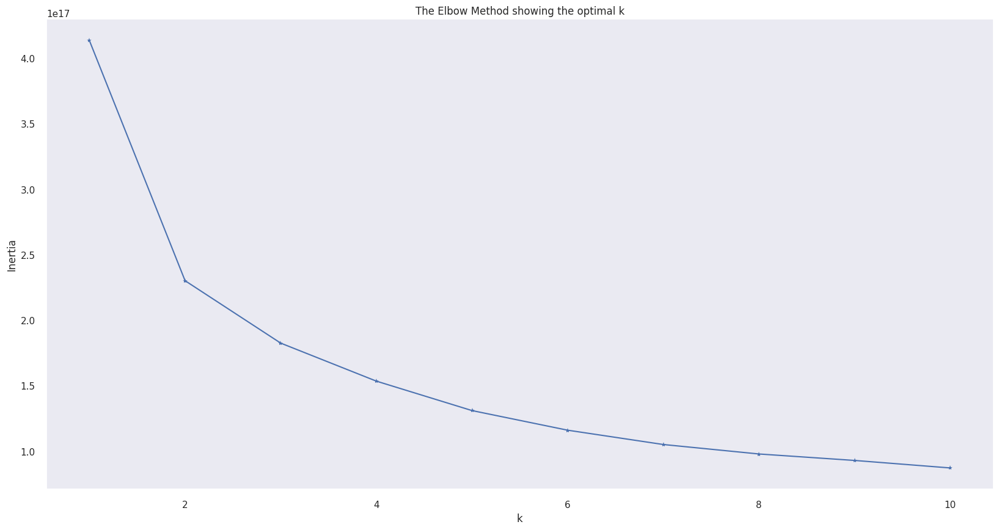

In [122]:
plt.figure(figsize=(16,8))
plt.figure()
plt.plot(K, distortions, 'b*-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('The Elbow Method showing the optimal k')
plt.show()

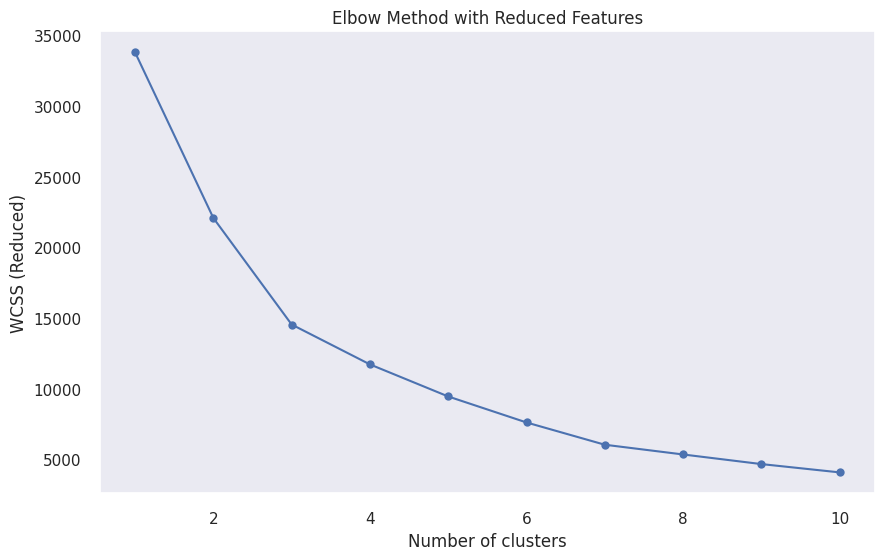

In [123]:
# Reducing the number of features to minimize memory usage
reduced_features = ['user_age', 'monthly_buy_Saham', 'EOP_Saham_AUM']

# Extracting the reduced set of features
reduced_clustering_data = df[reduced_features]

# Replacing missing values with zeros
reduced_clustering_data = reduced_clustering_data.fillna(0)

# Standardizing the reduced data
scaler = StandardScaler()
reduced_clustering_data_scaled = scaler.fit_transform(reduced_clustering_data)

# Re-attempting the Elbow Method to determine the optimal number of clusters
wcss_reduced = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(reduced_clustering_data_scaled)
    wcss_reduced.append(kmeans.inertia_)

# Plotting the Elbow Method graph with reduced features
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss_reduced, marker='o')
plt.title('Elbow Method with Reduced Features')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS (Reduced)')
plt.show()



In [124]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.cm as cm

def convert_color_to_rgb(color_tuple):
    """Converts a color tuple to an RGB string recognized by Plotly."""
    return f'rgb({int(color_tuple[0]*255)}, {int(color_tuple[1]*255)}, {int(color_tuple[2]*255)})'

def plotly_silhouette_analysis(data, cluster=[2, 3, 4]):
    X = data.to_numpy()
    range_n_clusters = cluster
    
    # Creating subplots for each number of clusters
    rows = len(range_n_clusters)
    fig = make_subplots(rows=rows, cols=2, 
                        subplot_titles=["Silhouette Analysis", "Cluster Visualization"])

    for idx, n_clusters in enumerate(range_n_clusters):
        # Initialize the clusterer
        clusterer = KMeans(n_clusters=n_clusters, random_state=10, init='k-means++')
        cluster_labels = clusterer.fit_predict(X)

        silhouette_avg = silhouette_score(X, cluster_labels)
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            plotly_color = convert_color_to_rgb(color)
            filled_area = go.Scatter(y=np.arange(y_lower, y_upper),
                                     x=ith_cluster_silhouette_values,
                                     mode='lines',
                                     showlegend=False,
                                     line=dict(width=0.5, color=plotly_color),
                                     fill='tozerox')
            fig.add_trace(filled_area, row=idx+1, col=1)

            y_lower = y_upper + 10

        # The vertical line for average silhouette score of all the values
        fig.add_trace(go.Scatter(x=[silhouette_avg]*100,
                                 y=np.linspace(0, len(X), 100),
                                 mode='lines',
                                 showlegend=False,
                                 line=dict(color="red", dash='dash')), 
                      row=idx+1, col=1)

        # 2nd Plot showing the actual clusters formed
        for i in range(n_clusters):
            cluster_color = cm.nipy_spectral(float(i) / n_clusters)
            plotly_color = convert_color_to_rgb(cluster_color)
            fig.add_trace(go.Scatter(x=X[cluster_labels == i, 0],
                                     y=X[cluster_labels == i, 1],
                                     mode='markers',
                                     showlegend=False,
                                     marker=dict(size=5, color=plotly_color, line=dict(width=0.5, color='black'))),
                          row=idx+1, col=2)

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        for center in centers:
            fig.add_trace(go.Scatter(x=[center[0]], y=[center[1]],
                                     mode='markers',
                                     marker=dict(color='white', size=10, line=dict(width=2, color='black'))),
                          row=idx+1, col=2)

    fig.update_layout(height=1000, width=800, title_text="Silhouette Analysis and Cluster Visualization with Plotly")
    fig.show()

In [125]:
# silhouette analysis range clustering between 2-7
plotly_silhouette_analysis(cluster[['total_buy', 'age']], cluster=[2, 3, 4])

Cluster 0 Characteristics:
          age  user_age  referral_code_used  monthly_buy_Saham  \
count 1107.00   1107.00             1107.00            1107.00   
mean     0.20     27.93                0.34          240987.09   
std      0.04      2.21                0.47          666722.94   
min      0.12     24.00                0.00               0.00   
25%      0.16     26.00                0.00               0.00   
50%      0.20     28.00                0.00           25000.00   
75%      0.23     30.00                1.00          167500.00   
max      0.27     32.00                1.00         9000000.00   

       monthly_buy_Pasar_Uang  monthly_buy_Pendapatan_Tetap  \
count                 1107.00                       1107.00   
mean                370165.47                     398052.26   
std                1110708.23                    1147624.78   
min                      0.00                          0.00   
25%                      0.00                          0.00   


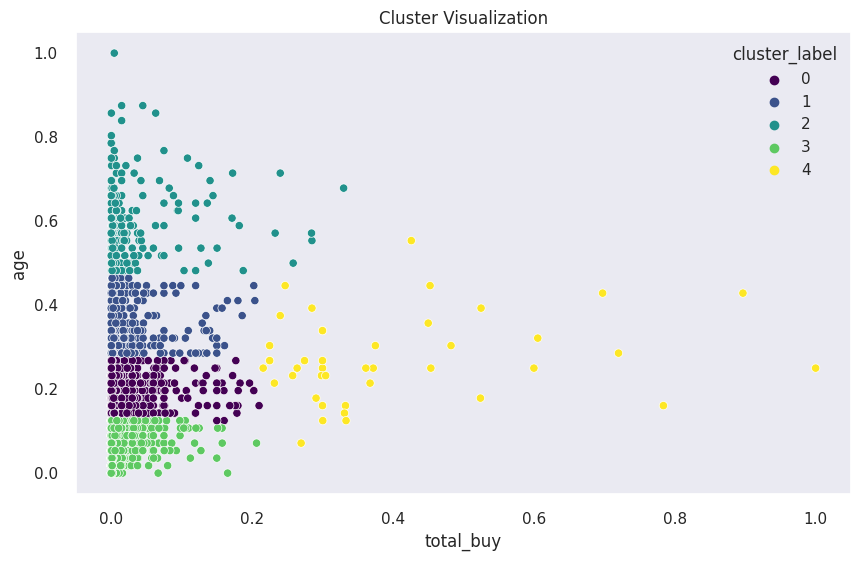

In [126]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Applying K-Means Clustering
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster['cluster_label'] = kmeans.fit_predict(cluster[['total_buy', 'age']])

# Analyze Cluster Characteristics
for i in range(n_clusters):
    print(f"Cluster {i} Characteristics:")
    print(cluster[cluster['cluster_label'] == i].describe(), "\n")

# Visualize the Clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(data=cluster, x='total_buy', y='age', hue='cluster_label', palette='viridis')
plt.title('Cluster Visualization')
plt.show()

## Analyze clustering using 5 cluster USING K-MEANS

In [127]:
#lets see the population spread if we use 5 segment
cluster.groupby(['cluster_label']).count()

,age,user_age,referral_code_used,monthly_buy_Saham,monthly_buy_Pasar_Uang,monthly_buy_Pendapatan_Tetap,monthly_buy_Campuran,monthly_total_buy,monthly_sell_Saham,monthly_sell_Pasar_Uang,...,EOP_Pendapatan_Tetap_AUM,EOP_Pendapatan_Tetap_invested_amount,EOP_Pendapatan_Tetap_profit,EOP_Campuran_AUM,EOP_Campuran_invested_amount,EOP_Campuran_profit,EOP_total_AUM,EOP_total_invested_amount,EOP_total_profit,total_buy
cluster_label,,,,,,,,,,,,,,,,,,,,,
0,1107,1107,1107,1107,1107,1107,1107,1107,1107,1107,...,1107,1107,1107,1107,1107,1107,1107,1107,1107,1107
1,552,552,552,552,552,552,552,552,552,552,...,552,552,552,552,552,552,552,552,552,552
2,247,247,247,247,247,247,247,247,247,247,...,247,247,247,247,247,247,247,247,247,247
3,1510,1510,1510,1510,1510,1510,1510,1510,1510,1510,...,1510,1510,1510,1510,1510,1510,1510,1510,1510,1510
4,42,42,42,42,42,42,42,42,42,42,...,42,42,42,42,42,42,42,42,42,42


In [128]:
# lets check the data distribution of Age
sns.boxplot (data =cluster , x ='cluster_label' , y ='age')

<AxesSubplot: xlabel='cluster_label', ylabel='age'>

In [129]:
# lets check the data distribution of Total_buy
sns.boxplot (data =cluster , x ='cluster_label' , y ='total_buy')

<AxesSubplot: xlabel='cluster_label', ylabel='total_buy'>

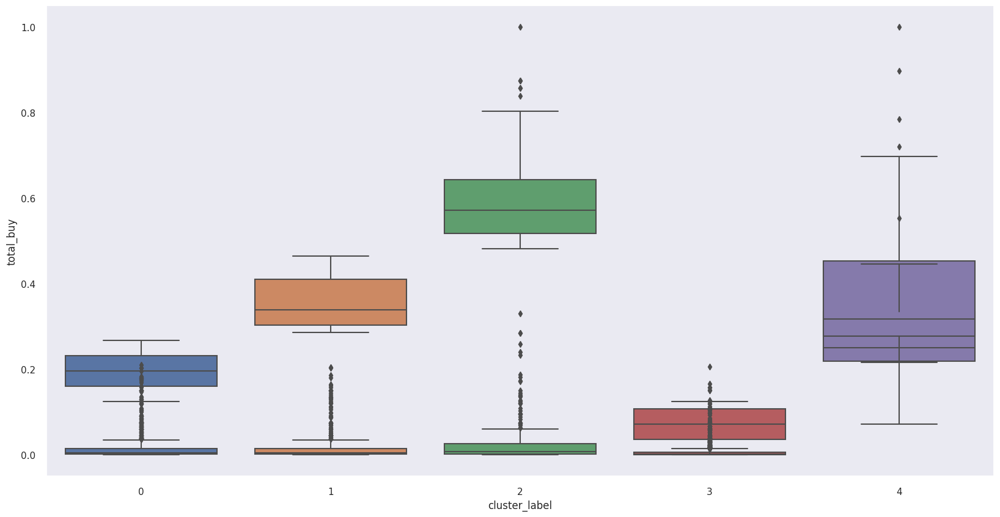

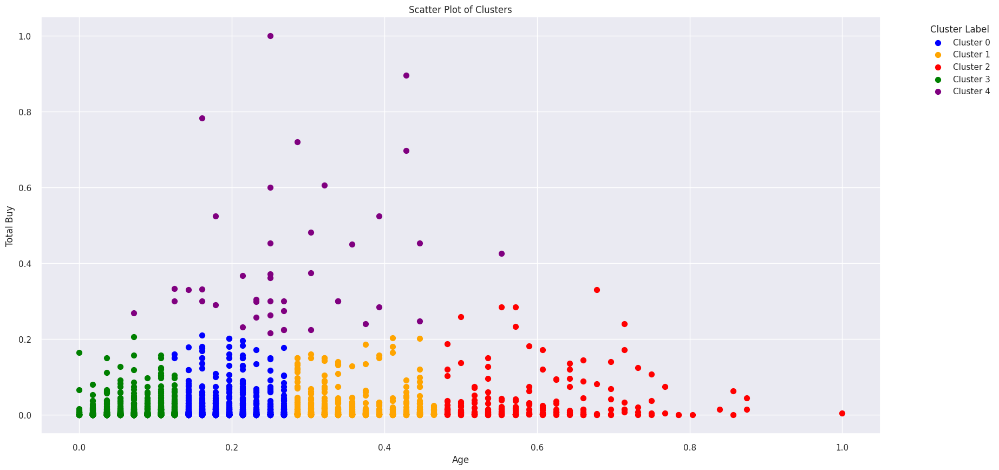

In [130]:
ax = cluster[cluster['cluster_label'] == 0].plot.scatter(x='age', y='total_buy', color='blue', label='Cluster 0', s=50)
ax = cluster[cluster['cluster_label'] == 1].plot.scatter(x='age', y='total_buy', color='orange', label='Cluster 1', ax=ax, s=50)
ax = cluster[cluster['cluster_label'] == 2].plot.scatter(x='age', y='total_buy', color='red', label='Cluster 2', ax=ax, s=50)
ax = cluster[cluster['cluster_label'] == 3].plot.scatter(x='age', y='total_buy', color='green', label='Cluster 3', ax=ax, s=50)
ax = cluster[cluster['cluster_label'] == 4].plot.scatter(x='age', y='total_buy', color='purple', label='Cluster 4', ax=ax, s=50)

ax.set_title('Scatter Plot of Clusters')
ax.set_xlabel('Age')
ax.set_ylabel('Total Buy')
ax.grid(True)
ax.legend(title='Cluster Label', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [131]:
#lets prepare the dataframe for analysis
cluster['user_id'] = cluster.index
cluster['user_id'] = cluster['user_id'].astype('str')
cluster_user_balance_profile = monthly_user_data.merge(cluster[['cluster_label']], how='inner', left_on='user_id',right_on=cluster.index)
cluster_user_balance_profile

,user_id,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,month,monthly_buy_Saham,monthly_buy_Pasar_Uang,...,EOP_Pendapatan_Tetap_AUM,EOP_Pendapatan_Tetap_invested_amount,EOP_Pendapatan_Tetap_profit,EOP_Campuran_AUM,EOP_Campuran_invested_amount,EOP_Campuran_profit,EOP_total_AUM,EOP_total_invested_amount,EOP_total_profit,cluster_label
0,1111674,Male,22,Others,B (10 Mil to 50 Mil),False,Salary,Aug 2021,40000.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3
1,1111674,Male,22,Others,B (10 Mil to 50 Mil),False,Salary,Sep 2021,NaN,NaN,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3
2,1119474,Female,23,Pelajar,A (Under 10 Mil),False,Salary,Aug 2021,30000.00,10000.00,...,110472.00,110000.00,472.00,0.00,0.00,0.00,202825.00,200000.00,2825.00,3
3,1119474,Female,23,Pelajar,A (Under 10 Mil),False,Salary,Sep 2021,NaN,NaN,...,110707.00,110000.00,707.00,0.00,0.00,0.00,205491.00,200000.00,5491.00,3
4,1134964,Male,18,Pelajar,A (Under 10 Mil),False,Others,Aug 2021,100000.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,100962.00,100000.00,962.00,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5211,3933937,Male,47,Pengusaha,C (50 Mil to 100 Mil),True,Business Profit,Sep 2021,0.00,0.00,...,0.00,0.00,0.00,3051527.00,3000000.00,51527.00,3051527.00,3000000.00,51527.00,2
5212,3950230,Male,40,Swasta,E (500 Mil to 1 Bil),True,Salary,Sep 2021,0.00,0.00,...,0.00,0.00,0.00,16180192.00,16000000.00,180192.00,16180192.00,16000000.00,180192.00,1
5213,3965052,Female,26,Pengusaha,B (10 Mil to 50 Mil),False,Salary,Sep 2021,0.00,0.00,...,0.00,0.00,0.00,1297368.00,1300000.00,-2632.00,1297368.00,1300000.00,-2632.00,0
5214,3984286,Male,34,Pengusaha,A (Under 10 Mil),False,Salary,Sep 2021,0.00,0.00,...,69782.00,70000.00,-218.00,99907.00,100000.00,-93.00,200514.00,200000.00,514.00,1


## Mengecek Demography Berdasarkan Cluster

In [132]:
#lets prepare the data for the analysis by merging the cluster df to the main df
cluster_user_profile = cluster_user_balance_profile.copy()
list_columns = cluster_user_profile.columns.to_list()
drop_columns = list_columns[8:43]
cup = cluster_user_profile.drop(columns=drop_columns, axis = 1)

cluster_user_profile = cup.groupby(['cluster_label','user_id','user_gender','user_age','user_income_range','user_occupation','user_income_source','referral_code_used'],as_index=False).sum()
cluster_user_profile = cluster_user_profile.rename(columns={'month': 'count',}, errors='raise')
cluster_user_profile

,cluster_label,user_id,user_gender,user_age,user_income_range,user_occupation,user_income_source,referral_code_used,count
0,0,1024581,Male,25,B (10 Mil to 50 Mil),Pelajar,Salary,True,Sep 2021
1,0,1050345,Male,28,D (100 Mil to 500 Mil),Swasta,Salary,False,Sep 2021Aug 2021
2,0,1100310,Male,25,C (50 Mil to 100 Mil),Pelajar,Salary,False,Sep 2021
3,0,1170824,Female,28,B (10 Mil to 50 Mil),IRT,Business Profit,False,Sep 2021
4,0,1195028,Male,31,A (Under 10 Mil),Swasta,Salary,False,Aug 2021Sep 2021
...,...,...,...,...,...,...,...,...,...
3453,4,4024440,Female,31,C (50 Mil to 100 Mil),Pelajar,Salary,False,Sep 2021
3454,4,4043211,Female,48,C (50 Mil to 100 Mil),IRT,From Family,False,Sep 2021
3455,4,4045594,Male,32,D (100 Mil to 500 Mil),Swasta,Salary,False,Sep 2021
3456,4,4080962,Female,34,D (100 Mil to 500 Mil),Swasta,Salary,False,Sep 2021


In [133]:
import plotly.express as px

# Since we don't have 'total_activity_sum', using 'user_age' for demonstration
# Replace 'user_age' with a suitable numerical column from your dataset
fig = px.scatter(cluster_user_profile, x='user_age', y='user_age', color='cluster_label', 
                 labels={'user_age': 'User Age'}, 
                 title='Cluster Visualization Based on User Age')

fig.show()

## check untuk gender

In [134]:
#check the gender proportion of each cluster
cluster_gender = cluster_user_profile.groupby(['cluster_label','user_gender']).count()
list_columns = cluster_gender.columns.to_list()
drop_columns = list_columns[0:6]
cluster_gender = cluster_gender.drop(columns=drop_columns, axis = 1)
cluster_gender

count
cluster_label user_gender       
0             Female         485
              Male           622
1             Female         234
              Male           318
2             Female          97
              Male           150
3             Female         630
              Male           880
4             Female          17
              Male            25

## mengecek untuk stastistic porpotion gender tiap cluster

In [135]:
#check the gender proportion of each cluster
cluster_age = cluster_user_profile.groupby(['cluster_label']).agg(['mean','min','max'])
cluster_age

/tmp/ipykernel_2903/3616385966.py:2: FutureWarning:

['user_gender', 'user_income_range', 'user_occupation', 'user_income_source', 'count'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.



user_id           \
                                                            mean      min   
cluster_label                                                               
0                                                            inf  1024581   
1                                                            inf   103108   
2                                                            inf  1077164   
3                                                            inf  1035424   
4             28217812371852904365962515239818018987310728573...  1185148   

                       user_age         referral_code_used               
                   max     mean min max               mean    min   max  
cluster_label                                                            
0               997938    27.93  24  32               0.34  False  True  
1               990466    37.05  33  43               0.27  False  True  
2               818881    49.91  44  73               0.34  False  True  
3               969088    21.00  17  24               0.36  False  True  
4              4096532    32.36  21  48               0.26  False  True

**Wawasan**

1. Pengguna cluster 0 berusia 25-32 tahun dengan rata-rata usia 28 Tahun (Milenial)
2. Pengguna cluster 1 berusia 44-73 tahun dengan rata-rata usia 50 Tahun (Gen X)
3. Pengguna cluster 2 berusia 17-24 tahun dengan rata-rata usia 21 Tahun (Gen Z)
4. Pengguna cluster 3 berusia 33-43 tahun dengan rata-rata usia 37 Tahun (Milenial)
5. Pengguna Cluster 4 berusia 21-48 tahun dengan rata-rata usia 32 Tahun (Campuran Gen Z dan Millenials)

## mengecek berdasarkan income

In [136]:
#check the income range proportion of each cluster
cluster_income_range = cluster_user_profile.groupby(['cluster_label','user_income_range']).count()
list_columns = cluster_income_range.columns.to_list()
drop_columns = list_columns[0:6]
cluster_income_range = cluster_income_range.drop(columns=drop_columns, axis = 1)
cluster_income_range

count
cluster_label user_income_range            
0             A (Under 10 Mil)          259
              B (10 Mil to 50 Mil)      414
              C (50 Mil to 100 Mil)     302
              D (100 Mil to 500 Mil)    125
              E (500 Mil to 1 Bil)        7
1             A (Under 10 Mil)           83
              B (10 Mil to 50 Mil)      175
              C (50 Mil to 100 Mil)     157
              D (100 Mil to 500 Mil)    120
              E (500 Mil to 1 Bil)       16
              F (Over 1 Bil)              1
2             A (Under 10 Mil)           43
              B (10 Mil to 50 Mil)       59
              C (50 Mil to 100 Mil)      64
              D (100 Mil to 500 Mil)     66
              E (500 Mil to 1 Bil)       13
              F (Over 1 Bil)              2
3             A (Under 10 Mil)          957
              B (10 Mil to 50 Mil)      426
              C (50 Mil to 100 Mil)     112
              D (100 Mil to 500 Mil)     14
              F (Over 1 Bil)              1
4             A (Under 10 Mil)            5
              B (10 Mil to 50 Mil)       12
              C (50 Mil to 100 Mil)      10
              D (100 Mil to 500 Mil)     13
              F (Over 1 Bil)              2

In [137]:
import plotly.express as px

# Create the scatter plot using Plotly Express
fig = px.scatter(cluster, x='age', y='total_buy', color='cluster_label',
                 color_discrete_sequence=['blue', 'orange', 'red', 'green', 'purple'],
                 labels={'cluster_label': 'Cluster Label', 'age': 'Age', 'total_buy': 'Total Buy'},
                 title='Scatter Plot of Clusters')

# Show the figure
fig.show()

In [138]:
#lets prepare the dataframe for analysis
cluster['user_id'] = cluster.index
cluster['user_id'] = cluster['user_id'].astype('str')
cluster_user_balance_profile = monthly_user_data.merge(cluster[['cluster_label']], how='inner', left_on='user_id',right_on=cluster.index)
cluster_user_balance_profile

,user_id,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,month,monthly_buy_Saham,monthly_buy_Pasar_Uang,...,EOP_Pendapatan_Tetap_AUM,EOP_Pendapatan_Tetap_invested_amount,EOP_Pendapatan_Tetap_profit,EOP_Campuran_AUM,EOP_Campuran_invested_amount,EOP_Campuran_profit,EOP_total_AUM,EOP_total_invested_amount,EOP_total_profit,cluster_label
0,1111674,Male,22,Others,B (10 Mil to 50 Mil),False,Salary,Aug 2021,40000.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3
1,1111674,Male,22,Others,B (10 Mil to 50 Mil),False,Salary,Sep 2021,NaN,NaN,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3
2,1119474,Female,23,Pelajar,A (Under 10 Mil),False,Salary,Aug 2021,30000.00,10000.00,...,110472.00,110000.00,472.00,0.00,0.00,0.00,202825.00,200000.00,2825.00,3
3,1119474,Female,23,Pelajar,A (Under 10 Mil),False,Salary,Sep 2021,NaN,NaN,...,110707.00,110000.00,707.00,0.00,0.00,0.00,205491.00,200000.00,5491.00,3
4,1134964,Male,18,Pelajar,A (Under 10 Mil),False,Others,Aug 2021,100000.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,100962.00,100000.00,962.00,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5211,3933937,Male,47,Pengusaha,C (50 Mil to 100 Mil),True,Business Profit,Sep 2021,0.00,0.00,...,0.00,0.00,0.00,3051527.00,3000000.00,51527.00,3051527.00,3000000.00,51527.00,2
5212,3950230,Male,40,Swasta,E (500 Mil to 1 Bil),True,Salary,Sep 2021,0.00,0.00,...,0.00,0.00,0.00,16180192.00,16000000.00,180192.00,16180192.00,16000000.00,180192.00,1
5213,3965052,Female,26,Pengusaha,B (10 Mil to 50 Mil),False,Salary,Sep 2021,0.00,0.00,...,0.00,0.00,0.00,1297368.00,1300000.00,-2632.00,1297368.00,1300000.00,-2632.00,0
5214,3984286,Male,34,Pengusaha,A (Under 10 Mil),False,Salary,Sep 2021,0.00,0.00,...,69782.00,70000.00,-218.00,99907.00,100000.00,-93.00,200514.00,200000.00,514.00,1


# Mengecek Demography of each Cluster pada dataset

In [139]:
# Copying the original DataFrame for manipulation
profile_with_clusters = cluster_user_balance_profile.copy()

# Define columns to drop
columns_to_drop = profile_with_clusters.columns[8:43]

# Dropping unnecessary columns
profile_reduced = profile_with_clusters.drop(columns=columns_to_drop)

# Grouping by relevant columns and summing numerical values
clustered_user_summary = profile_reduced.groupby(
    ['cluster_label', 'user_id', 'user_gender', 'user_age', 
     'user_income_range', 'user_occupation', 'user_income_source', 
     'referral_code_used'], as_index=False
).sum()

# Renaming columns for clarity
clustered_user_summary = clustered_user_summary.rename(columns={'month': 'interaction_count'}, errors='raise')

clustered_user_summary

,cluster_label,user_id,user_gender,user_age,user_income_range,user_occupation,user_income_source,referral_code_used,interaction_count
0,0,1024581,Male,25,B (10 Mil to 50 Mil),Pelajar,Salary,True,Sep 2021
1,0,1050345,Male,28,D (100 Mil to 500 Mil),Swasta,Salary,False,Sep 2021Aug 2021
2,0,1100310,Male,25,C (50 Mil to 100 Mil),Pelajar,Salary,False,Sep 2021
3,0,1170824,Female,28,B (10 Mil to 50 Mil),IRT,Business Profit,False,Sep 2021
4,0,1195028,Male,31,A (Under 10 Mil),Swasta,Salary,False,Aug 2021Sep 2021
...,...,...,...,...,...,...,...,...,...
3453,4,4024440,Female,31,C (50 Mil to 100 Mil),Pelajar,Salary,False,Sep 2021
3454,4,4043211,Female,48,C (50 Mil to 100 Mil),IRT,From Family,False,Sep 2021
3455,4,4045594,Male,32,D (100 Mil to 500 Mil),Swasta,Salary,False,Sep 2021
3456,4,4080962,Female,34,D (100 Mil to 500 Mil),Swasta,Salary,False,Sep 2021


In [140]:
# Grouping by 'cluster' and 'user_gender' and counting occurrences
cluster_gender = cluster_user_profile.groupby(['cluster_label', 'user_gender']).size()

# Converting the series into a DataFrame
cluster_gender = cluster_gender.reset_index(name='count')

cluster_gender


,cluster_label,user_gender,count
0,0,Female,485
1,0,Male,622
2,1,Female,234
3,1,Male,318
4,2,Female,97
5,2,Male,150
6,3,Female,630
7,3,Male,880
8,4,Female,17
9,4,Male,25


In [141]:
# Grouping by 'cluster' and calculating mean, min, and max for age
cluster_age_stats = cluster_user_profile.groupby('cluster_label')['user_age'].agg(['mean', 'min', 'max'])

cluster_age_stats


,mean,min,max
cluster_label,,,
0,27.93,24,32
1,37.05,33,43
2,49.91,44,73
3,21.00,17,24
4,32.36,21,48


**Wawasan**

1. Pengguna cluster 0 berusia 25-32 tahun dengan rata-rata usia 28 Tahun (Milenial)
2. Pengguna cluster 1 berusia 44-73 tahun dengan rata-rata usia 50 Tahun (Gen X)
3. Pengguna cluster 2 berusia 17-24 tahun dengan rata-rata usia 21 Tahun (Gen Z)
4. Pengguna cluster 3 berusia 33-43 tahun dengan rata-rata usia 37 Tahun (Milenial)
5. Pengguna Cluster 4 berusia 21-48 tahun dengan rata-rata usia 32 Tahun (Campuran Gen Z dan Millenials)

## berdasarkan income

In [142]:
# Grouping by 'cluster' and 'user_income_range' and counting occurrences
cluster_income_range = cluster_user_profile.groupby(['cluster_label', 'user_income_range']).size()

# Converting the series into a DataFrame and resetting index
cluster_income_range = cluster_income_range.reset_index(name='count')

cluster_income_range


,cluster_label,user_income_range,count
0,0,A (Under 10 Mil),259
1,0,B (10 Mil to 50 Mil),414
2,0,C (50 Mil to 100 Mil),302
3,0,D (100 Mil to 500 Mil),125
4,0,E (500 Mil to 1 Bil),7
5,1,A (Under 10 Mil),83
6,1,B (10 Mil to 50 Mil),175
7,1,C (50 Mil to 100 Mil),157
8,1,D (100 Mil to 500 Mil),120
9,1,E (500 Mil to 1 Bil),16


## berdasarkan sektor perkerjaannya

In [143]:
# Grouping by 'cluster' and 'user_occupation' and counting occurrences
cluster_occupation_count = cluster_user_profile.groupby(['cluster_label', 'user_occupation']).size()

# Converting the series into a DataFrame and resetting index
cluster_occupation_count = cluster_occupation_count.reset_index(name='count')

# Sorting the results to find the most common occupation in each cluster
cluster_occupation_count = cluster_occupation_count.sort_values(by=['cluster_label', 'count'], ascending=[True, False])

cluster_occupation_count


,cluster_label,user_occupation,count
4,0,Pelajar,505
6,0,Swasta,337
2,0,Others,127
1,0,IRT,54
5,0,Pengusaha,46
3,0,PNS,18
0,0,Guru,14
7,0,TNI/Polisi,6
14,1,Swasta,332
10,1,Others,56


## Berdasarkan Income Source

In [144]:
#check the income source proportion of each cluster
cluster_income_source = cluster_user_profile.groupby(['cluster_label','user_income_source']).count()
list_columns = cluster_income_source.columns.to_list()
drop_columns = list_columns[0:6]
cluster_income_source = cluster_income_source.drop(columns=drop_columns, axis = 1)
cluster_income_source

count
cluster_label user_income_source          
0             Business Profit           87
              From Family               71
              Others                    35
              Salary                   896
              Savings or Investment     18
1             Business Profit           67
              From Family               50
              Others                    20
              Salary                   407
              Savings or Investment      8
2             Business Profit           34
              From Family               27
              Others                    15
              Salary                   158
              Savings or Investment     13
3             Business Profit          134
              From Family               91
              Others                   466
              Salary                   741
              Savings or Investment     78
4             Business Profit            4
              From Family                5
              Others                     2
              Salary                    31

## Berdasarkan Referal Code pengguna

In [145]:
# Grouping by 'cluster' and 'referral_code_used' and counting occurrences
cluster_referral_count = cluster_user_profile.groupby(['cluster_label', 'referral_code_used']).size()

# Converting the series into a DataFrame and resetting the index
cluster_referral_count = cluster_referral_count.reset_index(name='count')

cluster_referral_count

,cluster_label,referral_code_used,count
0,0,False,732
1,0,True,375
2,1,False,402
3,1,True,150
4,2,False,162
5,2,True,85
6,3,False,972
7,3,True,538
8,4,False,31
9,4,True,11


## Berdasarkan Kebiasaan Transaksi

In [146]:
# Copying the relevant portion of the DataFrame
cluster_transaction = cluster_user_balance_profile[['user_id', 'cluster_label', 'monthly_total_buy']]

# Grouping by 'cluster_label' and 'user_id' and calculating the mean
monthly_transaction_buys = cluster_transaction.groupby(['cluster_label', 'user_id'], as_index=False).mean()

# Filtering out users with no monthly buys
monthly_transaction_buy = monthly_transaction_buys[monthly_transaction_buys['monthly_total_buy'] > 0]

# Grouping by 'cluster_label' to find the mean, min, and max
cluster_monthly_transaction_stats = monthly_transaction_buy.groupby('cluster_label')['monthly_total_buy'].agg(['mean', 'min', 'max'])

cluster_monthly_transaction_stats


,mean,min,max
cluster_label,,,
0,1040988.92,443.00,14000000.00
1,1190941.13,114.00,13600000.00
2,1912261.85,10000.00,22000000.00
3,512587.38,443.00,13760000.00
4,26578898.54,14387500.00,66650895.00


## Berdasarkan Frequency Transaksi

In [147]:
# Assuming 'monthly_total_transaction_frequency' is a column in 'cluster_user_balance_profile'
# and 'cluster_label' is the correct column name for cluster

# Selecting the relevant columns
cluster_frequency = cluster_user_balance_profile[['user_id', 'cluster_label', 'monthly_total_transaction_frequency']]

# Grouping by 'cluster_label' and 'user_id' to calculate the mean transaction frequency for each user
monthly_cluster_transaction = cluster_frequency.groupby(['cluster_label', 'user_id'], as_index=False).mean()

# Further grouping by 'cluster_label' to find the average transaction frequency for each cluster
average_cluster_frequency = monthly_cluster_transaction.groupby('cluster_label')['monthly_total_transaction_frequency'].mean()

average_cluster_frequency

cluster_label
0   1.86
1   2.00
2   2.06
3   1.79
4   3.86
Name: monthly_total_transaction_frequency, dtype: float64

## Berdasarkan Penjualan Perbulan

In [148]:
# Selecting the relevant columns
cluster_sell = cluster_user_balance_profile[['user_id', 'cluster_label', 'monthly_total_sell']]

# Grouping by 'cluster_label' and 'user_id' to calculate the mean sell amount for each user
monthly_cluster_sells = cluster_sell.groupby(['cluster_label', 'user_id'], as_index=False).mean()

# Filtering to include only negative sells (assuming negative values indicate sell transactions)
monthly_cluster_sell = monthly_cluster_sells[monthly_cluster_sells['monthly_total_sell'] < 0]

# Grouping by 'cluster_label' to find the mean, min, and max sell amounts for each cluster
cluster_sell_stats = monthly_cluster_sell.groupby('cluster_label')['monthly_total_sell'].agg(['mean', 'min', 'max'])

cluster_sell_stats

,mean,min,max
cluster_label,,,
0,-788500.04,-20000000.00,-5000.00
1,-894273.00,-20000000.00,-7500.00
2,-1427711.20,-20000000.00,-2000.00
3,-452382.07,-16250000.00,-4310.50
4,-12450796.35,-37000000.00,-190000.00


## Berdasarkan Alokasi Reksadana

In [149]:
# Selecting the relevant columns for AUM
cluster_AUM = cluster_user_balance_profile[['user_id', 'cluster_label', 'EOP_Saham_AUM', 'EOP_Pasar_Uang_AUM', 'EOP_Pendapatan_Tetap_AUM', 'EOP_Campuran_AUM']]

# Grouping by 'cluster_label' and 'user_id' to calculate the mean AUM for each user in different fund categories
monthly_cluster_AUM = cluster_AUM.groupby(['cluster_label', 'user_id'], as_index=False).mean()

# Grouping by 'cluster_label' to find the average AUM for each cluster
average_cluster_AUM = monthly_cluster_AUM.groupby('cluster_label', as_index=False).mean()

average_cluster_AUM

/tmp/ipykernel_2903/4030858938.py:8: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,cluster_label,EOP_Saham_AUM,EOP_Pasar_Uang_AUM,EOP_Pendapatan_Tetap_AUM,EOP_Campuran_AUM
0,0,446966.23,595902.12,760347.52,81191.43
1,1,652383.07,558912.26,616842.59,199978.74
2,2,852205.54,662723.15,1264237.91,277923.61
3,3,209948.12,290456.18,302835.77,49169.71
4,4,4436991.68,7273466.04,11906508.20,5641566.63


## Berdasarkan Total Alokasi Reksadana

In [150]:
ctum = cluster_user_balance_profile.copy()

# Selecting the relevant columns for total AUM
cluster_total_AUM = ctum[['user_id', 'cluster_label', 'EOP_total_AUM']]

# Grouping by 'cluster_label' and 'user_id' to calculate the mean total AUM for each user
monthly_cluster_total_AUM = cluster_total_AUM.groupby(['cluster_label', 'user_id'], as_index=False).mean()

# Grouping by 'cluster_label' to find the mean, min, and max total AUM for each cluster
average_cluster_total_AUM = monthly_cluster_total_AUM.groupby('cluster_label').agg(['mean', 'min', 'max'])

average_cluster_total_AUM

user_id           \
                                                            mean      min   
cluster_label                                                               
0                                                            inf  1024581   
1                                                            inf   103108   
2                                                            inf  1077164   
3                                                            inf  1035424   
4             28217812371852904365962515239818018987310728573...  1185148   

                       EOP_total_AUM                   
                   max          mean  min         max  
cluster_label                                          
0               997938    1884407.30 0.00 51168377.00  
1               990466    2028116.66 0.00 27809426.50  
2               818881    3057090.21 0.00 35621545.00  
3               969088     852409.78 0.00 27148456.50  
4              4096532   29258532.55 0.00 54419061.00

**Kompilasi Wawasan**
1. Cluster 0 (Investor Milenial Awal) (Persona Rachel dari Friends)
   * Terdiri dari 32,04% pengguna yang membeli reksa dana dalam 2 bulan terakhir
   * Milenial berusia 25-32 tahun dengan rata-rata usia 28 Tahun
   * Memiliki kisaran pendapatan dominan 10-100 Juta
   * Sebagian besar masih berstatus pelajar atau bekerja di swasta
   * Rata-rata investasi reksa dana Rp 1.075.474 per bulan
   * Mereka menjual 5.000 hingga 20.000.000 reksa dana per bulan
   * Rata-rata mereka melakukan 1,86 transaksi setiap bulannya
   * Rata-rata mereka memiliki Total AUM sebesar Rp 1.920.209 di akhir periode
   * Untung dari -69.959 menjadi 266.401 dengan rata-rata 301.44
   * Lebih memilih investasi yang mempunyai risiko rendah dan sedang
   * Profil risiko Cukup Konservatif

2. Cluster 1 (Investor Generasi X Usia Menengah) (Persona sebagai Ross dari Friends)
   * Terdiri dari 7,14% pengguna yang membeli reksa dana dalam 2 bulan terakhir
   * Gen X berusia 44-73 tahun dengan rata-rata usia 50 Tahun
   * Memiliki kisaran pendapatan dominan 10-100 Juta
   * Sebagian besar bekerja di sektor swasta
   * 33% menggunakan referral saat mendaftar
   * Investasi reksa dana rata-rata Rp 1.912.261 per bulan
   * Rata-rata mereka menjual 427.735 investasi reksa dananya per bulan
   * Rata-rata mereka melakukan 2,06 transaksi setiap bulannya
   * Rata-rata mereka memiliki Total AUM sebesar Rp 2.176.714 di akhir periode
   * Untung dari -177.689 menjadi 68.383 dengan rata-rata -630.70
   * Lebih memilih investasi yang mempunyai risiko sedang dan tinggi
   * Profil risiko Cukup Agresif

3. Cluster 2 (Investor Gen Z Zoomer) (Persona sebagai Joey dari Friends)
   * Terdiri dari 43,72% pengguna yang membeli reksa dana dalam 2 bulan terakhir
   * Gen Z berusia 17-24 tahun dengan rata-rata usia 21 Tahun
   * Memiliki kisaran pendapatan dominan di bawah 10 Juta
   * Kebanyakan masih Pelajar
   * 35% menggunakan referral saat mendaftar
   * Investasi reksa dana rata-rata Rp 525.596 per bulan
   * Rata-rata mereka menjual 176.667 investasi reksa dananya per bulan
   * Rata-rata mereka melakukan 1,79 transaksi setiap bulannya
   * Rata-rata mereka memiliki Total AUM sebesar Rp 867.350 di akhir periode
   * Untung dari -868.066 menjadi 129.848 dengan rata-rata -463.46
   * Lebih memilih investasi yang mempunyai risiko sedang
   * Profil risiko moderat

4. Cluster 4 (The Late Millenials Investor) (Persona sebagai Monica dari Friends)
   * Terdiri dari 16,04% pengguna yang membeli reksa dana dalam 2 bulan terakhir
   * Milenial berusia 33-43 tahun dengan rata-rata usia 37 Tahun
   * Memiliki kisaran pendapatan dominan 10-500 Juta
   * Sebagian besar bekerja di sektor swasta namun sebagian besar dari kelompok ini juga memiliki usaha atau bekerja untuk pemerintah
   * Investasi reksa dana rata-rata Rp 1.284.443 per bulan
   * Rata-rata mereka menjual 261.031 investasi reksa dananya per bulan
   * Rata-rata mereka melakukan 1,99 transaksi setiap bulannya
   * Rata-rata mereka memiliki Total AUM sebesar Rp 3.057.090 di akhir periode
   * Untung dari -101.058 menjadi 227.855 dengan rata-rata 280.23
   * Lebih memilih investasi yang mempunyai risiko sedang
   * Profil risiko moderat

5. Cluster 3 (Investor Sultan Muda) (Persona sebagai Chandler dari Friends)
   * Terdiri dari 1,04% pengguna yang membeli reksa dana dalam 2 bulan terakhir
   * Campuran Gen Z dan Millenial berusia 21-48 tahun dengan rata-rata usia 32 Tahun
   * Memiliki kisaran pendapatan dominan 10-500 Juta
   * Sebagian besar masih berstatus pelajar atau bekerja di sektor swasta
   * Investasi reksa dana rata-rata Rp 27.802.814 per bulan
   * Rata-rata mereka menjual 4.340.904 investasi reksa dananya per bulan
   * Rata-rata mereka melakukan 4,29 transaksi setiap bulannya
   * Rata-rata mereka memiliki Total AUM sebesar Rp 29.845.944 di akhir periode
   * Untung dari -30.093 menjadi 263.398 dengan rata-rata 11.512
   * Lebih memilih investasi yang memiliki risiko rendah hingga sedang
   * Profil risiko Cukup Konservatif

# Forecasting Using Machine Learning (How Much User Buying Product Govt.Bonds)

## Collection Data

In [151]:
govtbond = pd.read_csv("/datasets/govtbond/govt_bond_result_sep21 - govt_bond_result_sep21.csv",delimiter=",")
govtbond['user_id'] = govtbond['user_id'].astype('str')
govtbond.info()
govtbond

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8484 entries, 0 to 8483
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   user_id             8484 non-null   object
 1   flag_order_bond     8484 non-null   int64 
 2   bond_units_ordered  8484 non-null   int64 
dtypes: int64(2), object(1)
memory usage: 199.0+ KB


,user_id,flag_order_bond,bond_units_ordered
0,50701,1,34
1,50961,1,99
2,51883,0,0
3,53759,0,0
4,54759,1,92
...,...,...,...
8479,4173878,0,0
8480,4174045,0,0
8481,4174169,0,0
8482,4174486,0,0


## Merger Data User Dan Data Oblogasi

In [152]:
sep_user_data1 = monthly_user_data[monthly_user_data['month'] == 'Sep 2021']
sep_user_data2 = sep_user_data1.merge(user_clean[['user_id', 'registration_import_datetime']],how='inner', on='user_id')
sep_user_data = sep_user_data2.merge(govtbond[['user_id','flag_order_bond']],how='inner', on='user_id')
sep_user_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8219 entries, 0 to 8218
Data columns (total 45 columns):
 #   Column                                          Non-Null Count  Dtype         
---  ------                                          --------------  -----         
 0   user_id                                         8219 non-null   object        
 1   user_gender                                     8219 non-null   object        
 2   user_age                                        8219 non-null   int64         
 3   user_occupation                                 8219 non-null   object        
 4   user_income_range                               8219 non-null   object        
 5   referral_code_used                              8219 non-null   bool          
 6   user_income_source                              8219 non-null   object        
 7   month                                           8219 non-null   object        
 8   monthly_buy_Saham                               

In [153]:
sep_user_data.head()

,user_id,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,month,monthly_buy_Saham,monthly_buy_Pasar_Uang,...,EOP_Pendapatan_Tetap_invested_amount,EOP_Pendapatan_Tetap_profit,EOP_Campuran_AUM,EOP_Campuran_invested_amount,EOP_Campuran_profit,EOP_total_AUM,EOP_total_invested_amount,EOP_total_profit,registration_import_datetime,flag_order_bond
0,103108,Male,42,Swasta,E (500 Mil to 1 Bil),False,Salary,Sep 2021,5000000.00,0.00,...,340000.00,796.00,0.00,0.00,0.00,6200837.00,6000000.00,200837.00,2021-08-24 21:49:39,1
1,1035424,Male,21,Pelajar,B (10 Mil to 50 Mil),False,From Family,Sep 2021,47000.00,0.00,...,40000.00,-185.00,0.00,0.00,0.00,149952.00,147000.00,2952.00,2021-08-31 23:46:22,0
2,1050345,Male,28,Swasta,D (100 Mil to 500 Mil),False,Salary,Sep 2021,140000.00,180000.00,...,1030000.00,299.00,0.00,0.00,0.00,1508711.00,1500000.00,8711.00,2021-08-15 21:34:28,0
3,1062501,Male,23,Pelajar,C (50 Mil to 100 Mil),False,Salary,Sep 2021,190000.00,250000.00,...,500000.00,-905.00,0.00,0.00,0.00,1063464.00,1050000.00,13464.00,2021-08-01 16:09:29,0
4,1098153,Male,39,Swasta,D (100 Mil to 500 Mil),False,Salary,Sep 2021,70000.00,20000.00,...,160000.00,-323.00,0.00,0.00,0.00,302073.00,300000.00,2073.00,2021-08-27 11:47:31,1


In [154]:
# Menghitung vintage pengguna untuk bulan September
data_vintage_september = sep_user_data[['user_id', 'registration_import_datetime']]
data_vintage_september['reference_date'] = '2021-09-30'
data_vintage_september['reference_date'] = pd.to_datetime(data_vintage_september['reference_date'])
data_vintage_september['user_vintage_months'] = ((data_vintage_september['reference_date'] - data_vintage_september['registration_import_datetime']) / np.timedelta64(1, 'M'))
data_vintage_september['user_vintage_months'] = data_vintage_september['user_vintage_months'].astype('int')
data_vintage_september

/tmp/ipykernel_2903/4088197734.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/4088197734.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/4088197734.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903

,user_id,registration_import_datetime,reference_date,user_vintage_months
0,103108,2021-08-24 21:49:39,2021-09-30,1
1,1035424,2021-08-31 23:46:22,2021-09-30,0
2,1050345,2021-08-15 21:34:28,2021-09-30,1
3,1062501,2021-08-01 16:09:29,2021-09-30,1
4,1098153,2021-08-27 11:47:31,2021-09-30,1
...,...,...,...,...
8214,975052,2021-08-01 06:28:48,2021-09-30,1
8215,978972,2021-09-14 13:46:35,2021-09-30,0
8216,981852,2021-09-10 14:42:40,2021-09-30,0
8217,988940,2021-09-01 10:27:25,2021-09-30,0


In [155]:
# Calculate profit rate for September EOP
data_september_profit_rate = sep_user_data[['user_id', 'EOP_total_profit', 'EOP_total_invested_amount']]
data_september_profit_rate['EOP_profit_rate'] = (data_september_profit_rate['EOP_total_profit'] / data_september_profit_rate['EOP_total_invested_amount']) * 100
data_september_profit_rate.fillna(0, inplace=True)
data_september_profit_rate

/tmp/ipykernel_2903/568624416.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_2903/568624416.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,user_id,EOP_total_profit,EOP_total_invested_amount,EOP_profit_rate
0,103108,200837.00,6000000.00,3.35
1,1035424,2952.00,147000.00,2.01
2,1050345,8711.00,1500000.00,0.58
3,1062501,13464.00,1050000.00,1.28
4,1098153,2073.00,300000.00,0.69
...,...,...,...,...
8214,975052,0.00,0.00,0.00
8215,978972,1884.00,100000.00,1.88
8216,981852,132.00,100000.00,0.13
8217,988940,1937.00,500000.00,0.39


In [156]:
#lets drop the column that we wont use like month and registration dateline befor
september_corr = sep_user_data.copy()
list_columns = september_corr.columns.to_list()
drop_columns1 = list_columns[7:12]
september_corr = september_corr.drop(columns=drop_columns1, axis = 1)

drop_columns2 = list_columns[13:17]
september_corr = september_corr.drop(columns=drop_columns2, axis = 1)

drop_columns3 = list_columns[18:27]
september_corr = september_corr.drop(columns=drop_columns3, axis = 1)

drop_columns4 = list_columns[29:31]
september_corr = september_corr.drop(columns=drop_columns4, axis = 1)

drop_columns5 = list_columns[32:34]
september_corr = september_corr.drop(columns=drop_columns5, axis = 1)

drop_columns6 = list_columns[35:37]
september_corr = september_corr.drop(columns=drop_columns6, axis = 1)

drop_columns7 = list_columns[38:40]
september_corr = september_corr.drop(columns=drop_columns7, axis = 1)

september_corr = september_corr.drop(columns=['EOP_total_AUM','EOP_total_profit','monthly_total_transaction_frequency','registration_import_datetime'], axis = 1)

september_corr.head()

,user_id,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,monthly_total_buy,monthly_total_sell,EOP_Saham_AUM,EOP_Pasar_Uang_AUM,EOP_Pendapatan_Tetap_AUM,EOP_Campuran_AUM,EOP_total_invested_amount,flag_order_bond
0,103108,Male,42,Swasta,E (500 Mil to 1 Bil),False,Salary,5000000.00,0.00,5759629.00,100412.00,340796.00,0.00,6000000.00,1
1,1035424,Male,21,Pelajar,B (10 Mil to 50 Mil),False,From Family,47000.00,0.00,100116.00,10021.00,39815.00,0.00,147000.00,0
2,1050345,Male,28,Swasta,D (100 Mil to 500 Mil),False,Salary,1000000.00,0.00,208028.00,270384.00,1030299.00,0.00,1500000.00,0
3,1062501,Male,23,Pelajar,C (50 Mil to 100 Mil),False,Salary,850000.00,0.00,293433.00,270936.00,499095.00,0.00,1050000.00,0
4,1098153,Male,39,Swasta,D (100 Mil to 500 Mil),False,Salary,200000.00,0.00,112345.00,30051.00,159677.00,0.00,300000.00,1


In [157]:
#lets merge the profit and user vintage dataframe
september_dt1 = september_corr.merge(data_vintage_september[['user_id','user_vintage_months']],how='inner',on='user_id')
september_data = september_dt1.merge(data_september_profit_rate[['user_id','EOP_profit_rate']], how='inner',on='user_id')
september_data = september_dt1.fillna(0)
september_data.info()
september_data.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8219 entries, 0 to 8218
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   user_id                    8219 non-null   object 
 1   user_gender                8219 non-null   object 
 2   user_age                   8219 non-null   int64  
 3   user_occupation            8219 non-null   object 
 4   user_income_range          8219 non-null   object 
 5   referral_code_used         8219 non-null   bool   
 6   user_income_source         8219 non-null   object 
 7   monthly_total_buy          8219 non-null   float64
 8   monthly_total_sell         8219 non-null   float64
 9   EOP_Saham_AUM              8219 non-null   float64
 10  EOP_Pasar_Uang_AUM         8219 non-null   float64
 11  EOP_Pendapatan_Tetap_AUM   8219 non-null   float64
 12  EOP_Campuran_AUM           8219 non-null   float64
 13  EOP_total_invested_amount  8219 non-null   float

,user_id,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,monthly_total_buy,monthly_total_sell,EOP_Saham_AUM,EOP_Pasar_Uang_AUM,EOP_Pendapatan_Tetap_AUM,EOP_Campuran_AUM,EOP_total_invested_amount,flag_order_bond,user_vintage_months
0,103108,Male,42,Swasta,E (500 Mil to 1 Bil),False,Salary,5000000.00,0.00,5759629.00,100412.00,340796.00,0.00,6000000.00,1,1
1,1035424,Male,21,Pelajar,B (10 Mil to 50 Mil),False,From Family,47000.00,0.00,100116.00,10021.00,39815.00,0.00,147000.00,0,0
2,1050345,Male,28,Swasta,D (100 Mil to 500 Mil),False,Salary,1000000.00,0.00,208028.00,270384.00,1030299.00,0.00,1500000.00,0,1
3,1062501,Male,23,Pelajar,C (50 Mil to 100 Mil),False,Salary,850000.00,0.00,293433.00,270936.00,499095.00,0.00,1050000.00,0,1
4,1098153,Male,39,Swasta,D (100 Mil to 500 Mil),False,Salary,200000.00,0.00,112345.00,30051.00,159677.00,0.00,300000.00,1,1


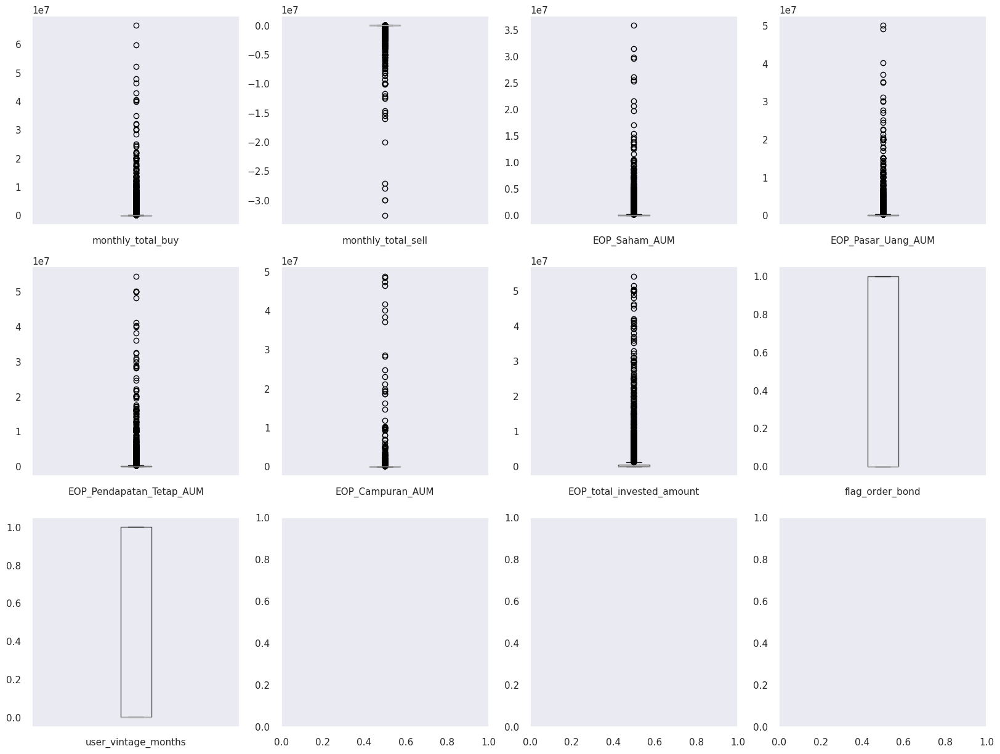

In [158]:
numerical_column = september_data[['monthly_total_buy','monthly_total_sell','EOP_Saham_AUM','EOP_Pasar_Uang_AUM','EOP_Pendapatan_Tetap_AUM','EOP_Campuran_AUM',
                                         'EOP_total_invested_amount','flag_order_bond','user_vintage_months']]

fig, axes = plt.subplots(nrows=3, ncols=4,figsize=(20,15))
for i,el in enumerate(numerical_column):
    a = september_data.boxplot(el, ax=axes.flatten()[i],grid=False)
plt.show()

#there is still a bit of outlier in the dataframe

In [159]:
#lets calculate the z-score
september_data['z_score']= (september_data['EOP_total_invested_amount'] - september_data['EOP_total_invested_amount'].mean())/september_data['EOP_total_invested_amount'].std()

#lets see the outlier in form of z-score
september_data.boxplot(column=['z_score'],fontsize=10,
           rot=0,grid=False,figsize=(10,10),vert=False)

<AxesSubplot: >

In [160]:
# lets check which row is considered an outlier (it means that the z-score is higher than 2 or lower than -2)
september_dt_outlier_user = september_data[(september_data['z_score'] > 1) | (september_data['z_score'] < -1)]


#there is 276 row that has an abundant transaction, in which the user is considered an outlier
september_dt_outlier_user

,user_id,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,monthly_total_buy,monthly_total_sell,EOP_Saham_AUM,EOP_Pasar_Uang_AUM,EOP_Pendapatan_Tetap_AUM,EOP_Campuran_AUM,EOP_total_invested_amount,flag_order_bond,user_vintage_months,z_score
0,103108,Male,42,Swasta,E (500 Mil to 1 Bil),False,Salary,5000000.00,0.00,5759629.00,100412.00,340796.00,0.00,6000000.00,1,1,1.08
5,1116654,Female,34,Swasta,D (100 Mil to 500 Mil),False,Salary,4000000.00,0.00,1223796.00,1254724.00,4063882.00,0.00,6500000.00,1,1,1.19
13,1196178,Male,26,Pelajar,B (10 Mil to 50 Mil),False,Salary,13020000.00,0.00,5923745.00,4777148.00,28833510.00,0.00,39219402.00,1,1,8.57
18,1252523,Male,30,Swasta,D (100 Mil to 500 Mil),False,Salary,2500000.00,0.00,3666697.00,1042682.00,2950333.00,0.00,7500000.00,1,0,1.42
21,1275820,Female,48,Swasta,D (100 Mil to 500 Mil),False,Salary,4390000.00,0.00,2380983.00,1663125.00,1803302.00,0.00,5790000.00,0,1,1.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7816,4134353,Female,51,IRT,B (10 Mil to 50 Mil),True,Salary,0.00,0.00,0.00,0.00,50031306.00,0.00,50000000.00,1,0,11.00
7976,4148792,Female,55,Others,B (10 Mil to 50 Mil),True,Salary,0.00,0.00,0.00,0.00,10004608.00,0.00,10000000.00,1,0,1.98
7984,4149237,Female,42,IRT,B (10 Mil to 50 Mil),False,Business Profit,0.00,0.00,102153.00,5361608.00,538711.00,0.00,6000000.00,1,0,1.08
7989,4149382,Male,27,Swasta,D (100 Mil to 500 Mil),False,Salary,0.00,0.00,13768024.00,500197.00,996981.00,0.00,15000000.00,1,0,3.11


In [161]:
#lets filter out the
september_dt_no_outlier = september_data[~(september_data['z_score'] > 1) | (september_data['z_score'] < -1)]
september_dt_no_outlier = september_dt_no_outlier.drop(columns='z_score', axis = 1)
september_dt_no_outlier

,user_id,user_gender,user_age,user_occupation,user_income_range,referral_code_used,user_income_source,monthly_total_buy,monthly_total_sell,EOP_Saham_AUM,EOP_Pasar_Uang_AUM,EOP_Pendapatan_Tetap_AUM,EOP_Campuran_AUM,EOP_total_invested_amount,flag_order_bond,user_vintage_months
1,1035424,Male,21,Pelajar,B (10 Mil to 50 Mil),False,From Family,47000.00,0.00,100116.00,10021.00,39815.00,0.00,147000.00,0,0
2,1050345,Male,28,Swasta,D (100 Mil to 500 Mil),False,Salary,1000000.00,0.00,208028.00,270384.00,1030299.00,0.00,1500000.00,0,1
3,1062501,Male,23,Pelajar,C (50 Mil to 100 Mil),False,Salary,850000.00,0.00,293433.00,270936.00,499095.00,0.00,1050000.00,0,1
4,1098153,Male,39,Swasta,D (100 Mil to 500 Mil),False,Salary,200000.00,0.00,112345.00,30051.00,159677.00,0.00,300000.00,1,1
6,1120478,Male,37,Swasta,B (10 Mil to 50 Mil),False,Salary,100000.00,-300000.00,103205.00,0.00,0.00,0.00,100000.00,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8214,975052,Male,37,Swasta,D (100 Mil to 500 Mil),False,Salary,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,1
8215,978972,Male,22,Pelajar,A (Under 10 Mil),False,Salary,0.00,0.00,61923.00,10012.00,29949.00,0.00,100000.00,0,0
8216,981852,Female,23,Swasta,C (50 Mil to 100 Mil),False,Salary,0.00,0.00,0.00,100132.00,0.00,0.00,100000.00,0,0
8217,988940,Male,27,Swasta,B (10 Mil to 50 Mil),False,Salary,0.00,0.00,51610.00,290353.00,159974.00,0.00,500000.00,0,0


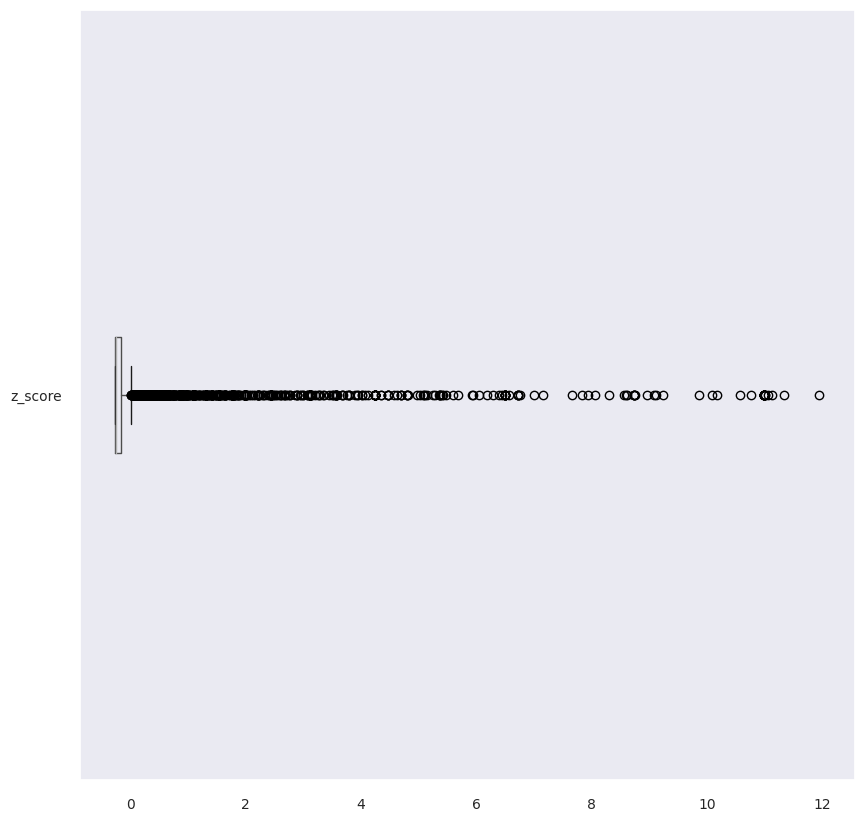

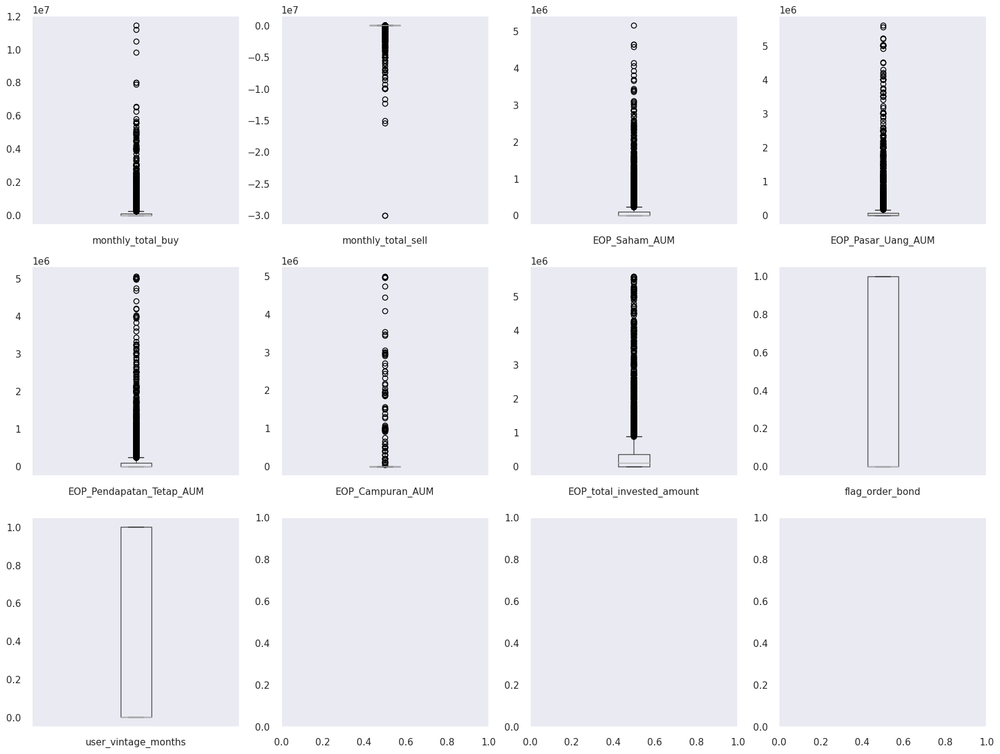

In [162]:
numerical_column = september_dt_no_outlier[['monthly_total_buy','monthly_total_sell','EOP_Saham_AUM','EOP_Pasar_Uang_AUM','EOP_Pendapatan_Tetap_AUM','EOP_Campuran_AUM',
                                         'EOP_total_invested_amount','flag_order_bond','user_vintage_months']]

fig, axes = plt.subplots(nrows=3, ncols=4,figsize=(20,15))
for i,el in enumerate(numerical_column):
    a = september_dt_no_outlier.boxplot(el, ax=axes.flatten()[i],grid=False)
plt.show()

#much better

In [163]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Assuming september_dt_no_outlier is your DataFrame
numerical_columns = ['monthly_total_buy', 'monthly_total_sell', 'EOP_Saham_AUM', 'EOP_Pasar_Uang_AUM', 'EOP_Pendapatan_Tetap_AUM', 
                     'EOP_Campuran_AUM', 'EOP_total_invested_amount', 'flag_order_bond', 'user_vintage_months']

# Create subplots: 3 rows, 4 columns
fig = make_subplots(rows=3, cols=4, subplot_titles=numerical_columns)

# Track the current position
row, col = 1, 1

# Loop through each column and create a box plot
for i, column in enumerate(numerical_columns):
    fig.add_trace(go.Box(y=september_dt_no_outlier[column], name=column), row=row, col=col)
    
    # Update row and column position
    col += 1
    if col > 4:
        col = 1
        row += 1

# Update layout if needed
fig.update_layout(height=900, width=1200, title_text="Box Plots of September Data Without Outliers")
fig.show()

In [164]:
#lets transform the categorical data to numerical
sep_data_transformed = september_dt_no_outlier.copy()
sep_data_transformed[['user_gender','user_occupation','user_income_range','user_income_source','referral_code_used']] = sep_data_transformed[['user_gender','user_occupation','user_income_range','user_income_source','referral_code_used']].astype('category')
sep_data_transformed['user_gender'] = sep_data_transformed['user_gender'].cat.codes
sep_data_transformed['referral_code_used'] = sep_data_transformed['referral_code_used'].cat.codes
sep_data_transformed = pd.get_dummies(sep_data_transformed, columns=['user_income_range'], drop_first = True)
sep_data_transformed = pd.get_dummies(sep_data_transformed, columns=['user_occupation'], drop_first = True)
sep_data_transformed = pd.get_dummies(sep_data_transformed, columns=['user_income_source'], drop_first = True)
sep_data_transformed = sep_data_transformed.fillna(0)
sep_data_transformed.info()
sep_data_transformed

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7816 entries, 1 to 8218
Data columns (total 30 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   user_id                                   7816 non-null   object 
 1   user_gender                               7816 non-null   int8   
 2   user_age                                  7816 non-null   int64  
 3   referral_code_used                        7816 non-null   int8   
 4   monthly_total_buy                         7816 non-null   float64
 5   monthly_total_sell                        7816 non-null   float64
 6   EOP_Saham_AUM                             7816 non-null   float64
 7   EOP_Pasar_Uang_AUM                        7816 non-null   float64
 8   EOP_Pendapatan_Tetap_AUM                  7816 non-null   float64
 9   EOP_Campuran_AUM                          7816 non-null   float64
 10  EOP_total_invested_amount           

,user_id,user_gender,user_age,referral_code_used,monthly_total_buy,monthly_total_sell,EOP_Saham_AUM,EOP_Pasar_Uang_AUM,EOP_Pendapatan_Tetap_AUM,EOP_Campuran_AUM,...,user_occupation_PNS,user_occupation_Pelajar,user_occupation_Pengusaha,user_occupation_Pensiunan,user_occupation_Swasta,user_occupation_TNI/Polisi,user_income_source_From Family,user_income_source_Others,user_income_source_Salary,user_income_source_Savings or Investment
1,1035424,1,21,0,47000.00,0.00,100116.00,10021.00,39815.00,0.00,...,0,1,0,0,0,0,1,0,0,0
2,1050345,1,28,0,1000000.00,0.00,208028.00,270384.00,1030299.00,0.00,...,0,0,0,0,1,0,0,0,1,0
3,1062501,1,23,0,850000.00,0.00,293433.00,270936.00,499095.00,0.00,...,0,1,0,0,0,0,0,0,1,0
4,1098153,1,39,0,200000.00,0.00,112345.00,30051.00,159677.00,0.00,...,0,0,0,0,1,0,0,0,1,0
6,1120478,1,37,0,100000.00,-300000.00,103205.00,0.00,0.00,0.00,...,0,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8214,975052,1,37,0,0.00,0.00,0.00,0.00,0.00,0.00,...,0,0,0,0,1,0,0,0,1,0
8215,978972,1,22,0,0.00,0.00,61923.00,10012.00,29949.00,0.00,...,0,1,0,0,0,0,0,0,1,0
8216,981852,0,23,0,0.00,0.00,0.00,100132.00,0.00,0.00,...,0,0,0,0,1,0,0,0,1,0
8217,988940,1,27,0,0.00,0.00,51610.00,290353.00,159974.00,0.00,...,0,0,0,0,1,0,0,0,1,0


In [165]:
# Ambil semua kolom yang tipenya sudah numerik
corr_column = sep_data_transformed.select_dtypes(include=[np.number]).columns.to_list()
corr_column = list(set(corr_column) - set(['flag_order_bond']))
corr_column

['user_occupation_PNS',
 'user_occupation_Pengusaha',
 'user_occupation_Swasta',
 'user_income_range_B (10 Mil to 50 Mil)',
 'user_gender',
 'user_occupation_IRT',
 'user_income_range_D (100 Mil to 500 Mil)',
 'user_occupation_TNI/Polisi',
 'monthly_total_buy',
 'user_age',
 'user_income_source_Others',
 'user_income_range_E (500 Mil to 1 Bil)',
 'EOP_Campuran_AUM',
 'EOP_Pasar_Uang_AUM',
 'EOP_Saham_AUM',
 'user_occupation_Others',
 'user_occupation_Pensiunan',
 'EOP_Pendapatan_Tetap_AUM',
 'user_income_source_Salary',
 'user_occupation_Pelajar',
 'EOP_total_invested_amount',
 'user_income_range_C (50 Mil to 100 Mil)',
 'user_income_source_From Family',
 'user_income_source_Savings or Investment',
 'user_income_range_F (Over 1 Bil)',
 'user_vintage_months',
 'referral_code_used',
 'monthly_total_sell']

In [166]:
#lets check how many variables in the corr_column datafram
len(corr_column)

28

In [167]:
sep_data_transformed[corr_column]

,user_occupation_PNS,user_occupation_Pengusaha,user_occupation_Swasta,user_income_range_B (10 Mil to 50 Mil),user_gender,user_occupation_IRT,user_income_range_D (100 Mil to 500 Mil),user_occupation_TNI/Polisi,monthly_total_buy,user_age,...,user_income_source_Salary,user_occupation_Pelajar,EOP_total_invested_amount,user_income_range_C (50 Mil to 100 Mil),user_income_source_From Family,user_income_source_Savings or Investment,user_income_range_F (Over 1 Bil),user_vintage_months,referral_code_used,monthly_total_sell
1,0,0,0,1,1,0,0,0,47000.00,21,...,0,1,147000.00,0,1,0,0,0,0,0.00
2,0,0,1,0,1,0,1,0,1000000.00,28,...,1,0,1500000.00,0,0,0,0,1,0,0.00
3,0,0,0,0,1,0,0,0,850000.00,23,...,1,1,1050000.00,1,0,0,0,1,0,0.00
4,0,0,1,0,1,0,1,0,200000.00,39,...,1,0,300000.00,0,0,0,0,1,0,0.00
6,0,0,1,1,1,0,0,0,100000.00,37,...,1,0,100000.00,0,0,0,0,0,0,-300000.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8214,0,0,1,0,1,0,1,0,0.00,37,...,1,0,0.00,0,0,0,0,1,0,0.00
8215,0,0,0,0,1,0,0,0,0.00,22,...,1,1,100000.00,0,0,0,0,0,0,0.00
8216,0,0,1,0,0,0,0,0,0.00,23,...,1,0,100000.00,1,0,0,0,0,0,0.00
8217,0,0,1,1,1,0,0,0,0.00,27,...,1,0,500000.00,0,0,0,0,0,0,0.00


In [168]:
import plotly.graph_objects as go
import numpy as np

# Assuming sep_data_transformed is your DataFrame and corr_column contains the columns for correlation calculation
corr_matrix = sep_data_transformed[corr_column].corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Create a heatmap with annotations
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.mask(mask),
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    zmin=-1, zmax=1,
    colorscale='Viridis',  # Updated colorscale
    text=corr_matrix.round(2).mask(mask).values.flatten(),
    texttemplate="%{text}",
    hoverinfo="text"
))

# Update layout
fig.update_layout(
    title='Correlation Between Variables',
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    xaxis={'side': 'bottom'},
    yaxis_autorange='reversed',
    width=800, 
    height=800
)

# Show the plot
fig.show()

# Modeling Algoritma Regression For Prediction Govt Bond

## Data Preprocessing

In [169]:
sep_data_transformed.columns

Index(['user_id', 'user_gender', 'user_age', 'referral_code_used',
       'monthly_total_buy', 'monthly_total_sell', 'EOP_Saham_AUM',
       'EOP_Pasar_Uang_AUM', 'EOP_Pendapatan_Tetap_AUM', 'EOP_Campuran_AUM',
       'EOP_total_invested_amount', 'flag_order_bond', 'user_vintage_months',
       'user_income_range_B (10 Mil to 50 Mil)',
       'user_income_range_C (50 Mil to 100 Mil)',
       'user_income_range_D (100 Mil to 500 Mil)',
       'user_income_range_E (500 Mil to 1 Bil)',
       'user_income_range_F (Over 1 Bil)', 'user_occupation_IRT',
       'user_occupation_Others', 'user_occupation_PNS',
       'user_occupation_Pelajar', 'user_occupation_Pengusaha',
       'user_occupation_Pensiunan', 'user_occupation_Swasta',
       'user_occupation_TNI/Polisi', 'user_income_source_From Family',
       'user_income_source_Others', 'user_income_source_Salary',
       'user_income_source_Savings or Investment'],
      dtype='object')

In [170]:
sep_data_transformed.isna().sum()

user_id                                     0
user_gender                                 0
user_age                                    0
referral_code_used                          0
monthly_total_buy                           0
monthly_total_sell                          0
EOP_Saham_AUM                               0
EOP_Pasar_Uang_AUM                          0
EOP_Pendapatan_Tetap_AUM                    0
EOP_Campuran_AUM                            0
EOP_total_invested_amount                   0
flag_order_bond                             0
user_vintage_months                         0
user_income_range_B (10 Mil to 50 Mil)      0
user_income_range_C (50 Mil to 100 Mil)     0
user_income_range_D (100 Mil to 500 Mil)    0
user_income_range_E (500 Mil to 1 Bil)      0
user_income_range_F (Over 1 Bil)            0
user_occupation_IRT                         0
user_occupation_Others                      0
user_occupation_PNS                         0
user_occupation_Pelajar           

In [171]:
#remove nan and infinite value so we could proceed with the log-reg analysis
sep_data_transform = sep_data_transformed[~sep_data_transformed.isin([np.nan, np.inf, -np.inf]).any(1)]
sep_data_transform = sep_data_transform.set_index('user_id')

from sklearn.preprocessing import StandardScaler

# create a StandardScaler object
scaler = StandardScaler()

# fit the scaler to the data
variable=['user_gender', 'user_age', 'referral_code_used', 'monthly_total_buy',
       'monthly_total_sell', 'EOP_Saham_AUM', 'EOP_Pasar_Uang_AUM',
       'EOP_Pendapatan_Tetap_AUM', 'EOP_Campuran_AUM',
       'EOP_total_invested_amount', 'flag_order_bond', 'user_vintage_months',
       'user_income_range_B (10 Mil to 50 Mil)',
       'user_income_range_C (50 Mil to 100 Mil)',
       'user_income_range_D (100 Mil to 500 Mil)',
       'user_income_range_E (500 Mil to 1 Bil)',
       'user_income_range_F (Over 1 Bil)', 'user_occupation_IRT',
       'user_occupation_Others', 'user_occupation_PNS',
       'user_occupation_Pelajar', 'user_occupation_Pengusaha',
       'user_occupation_Pensiunan', 'user_occupation_Swasta',
       'user_occupation_TNI/Polisi', 'user_income_source_From Family',
       'user_income_source_Others', 'user_income_source_Salary',
       'user_income_source_Savings or Investment']

sep_data_transform[variable] = scaler.fit_transform(sep_data_transform[variable])
#sep_data_transform[variable] = ss_scaler.fit_transform(sep_data_transform[variable])
sep_data_transform.info()
sep_data_transform.head()

<class 'pandas.core.frame.DataFrame'>
Index: 7816 entries, 1035424 to 99245
Data columns (total 29 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   user_gender                               7816 non-null   float64
 1   user_age                                  7816 non-null   float64
 2   referral_code_used                        7816 non-null   float64
 3   monthly_total_buy                         7816 non-null   float64
 4   monthly_total_sell                        7816 non-null   float64
 5   EOP_Saham_AUM                             7816 non-null   float64
 6   EOP_Pasar_Uang_AUM                        7816 non-null   float64
 7   EOP_Pendapatan_Tetap_AUM                  7816 non-null   float64
 8   EOP_Campuran_AUM                          7816 non-null   float64
 9   EOP_total_invested_amount                 7816 non-null   float64
 10  flag_order_bond                   

/tmp/ipykernel_2903/2257719461.py:2: FutureWarning:

In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.



,user_gender,user_age,referral_code_used,monthly_total_buy,monthly_total_sell,EOP_Saham_AUM,EOP_Pasar_Uang_AUM,EOP_Pendapatan_Tetap_AUM,EOP_Campuran_AUM,EOP_total_invested_amount,...,user_occupation_PNS,user_occupation_Pelajar,user_occupation_Pengusaha,user_occupation_Pensiunan,user_occupation_Swasta,user_occupation_TNI/Polisi,user_income_source_From Family,user_income_source_Others,user_income_source_Salary,user_income_source_Savings or Investment
user_id,,,,,,,,,,,,,,,,,,,,,
1035424,0.77,-0.71,-0.75,-0.23,0.14,-0.08,-0.27,-0.25,-0.09,-0.32,...,-0.11,0.90,-0.20,-0.02,-0.53,-0.06,3.56,-0.42,-1.26,-0.21
1050345,0.77,0.14,-0.75,1.29,0.14,0.23,0.32,2.05,-0.09,1.24,...,-0.11,-1.11,-0.20,-0.02,1.88,-0.06,-0.28,-0.42,0.79,-0.21
1062501,0.77,-0.46,-0.75,1.05,0.14,0.48,0.32,0.82,-0.09,0.72,...,-0.11,0.90,-0.20,-0.02,-0.53,-0.06,-0.28,-0.42,0.79,-0.21
1098153,0.77,1.47,-0.75,0.02,0.14,-0.04,-0.23,0.03,-0.09,-0.14,...,-0.11,-1.11,-0.20,-0.02,1.88,-0.06,-0.28,-0.42,0.79,-0.21
1120478,0.77,1.23,-0.75,-0.14,-0.24,-0.07,-0.29,-0.34,-0.09,-0.37,...,-0.11,-1.11,-0.20,-0.02,1.88,-0.06,-0.28,-0.42,0.79,-0.21


## Split Of Data

In [172]:
dataset_train = sep_data_transform
X = dataset_train.drop('flag_order_bond' , axis =1)
y = dataset_train['flag_order_bond']

X_train , X_test , y_train , y_test = train_test_split(X , y , test_size = 0.2 , random_state = 1)

dataset_test = sep_data_transformed
dataset_test =dataset_test.drop(['flag_order_bond'] , axis = 1)
dataset_test.dropna(inplace = True)
dataset_test.head(5)

,user_id,user_gender,user_age,referral_code_used,monthly_total_buy,monthly_total_sell,EOP_Saham_AUM,EOP_Pasar_Uang_AUM,EOP_Pendapatan_Tetap_AUM,EOP_Campuran_AUM,...,user_occupation_PNS,user_occupation_Pelajar,user_occupation_Pengusaha,user_occupation_Pensiunan,user_occupation_Swasta,user_occupation_TNI/Polisi,user_income_source_From Family,user_income_source_Others,user_income_source_Salary,user_income_source_Savings or Investment
1,1035424,1,21,0,47000.00,0.00,100116.00,10021.00,39815.00,0.00,...,0,1,0,0,0,0,1,0,0,0
2,1050345,1,28,0,1000000.00,0.00,208028.00,270384.00,1030299.00,0.00,...,0,0,0,0,1,0,0,0,1,0
3,1062501,1,23,0,850000.00,0.00,293433.00,270936.00,499095.00,0.00,...,0,1,0,0,0,0,0,0,1,0
4,1098153,1,39,0,200000.00,0.00,112345.00,30051.00,159677.00,0.00,...,0,0,0,0,1,0,0,0,1,0
6,1120478,1,37,0,100000.00,-300000.00,103205.00,0.00,0.00,0.00,...,0,0,0,0,1,0,0,0,1,0


In [173]:
!pip install tensorflow

In [174]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Load your preprocessed dataset
df_preprocessed = sep_data_transform

# Prepare the data
X = df_preprocessed.drop('flag_order_bond', axis=1)
y = df_preprocessed['flag_order_bond']

# Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the neural network model
def build_model(input_shape):
    model = Sequential()
    model.add(Dense(64, input_dim=input_shape, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1))  # Output layer for regression

    model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
    return model

model = build_model(X_train_scaled.shape[1])

# Train the model
history = model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
mse = model.evaluate(X_test_scaled, y_test)
rmse = np.sqrt(mse)

print('Mean Squared Error:', mse)
print('Root Mean Squared Error:', rmse)

Epoch 1/100


2024-01-02 00:26:15.253580: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-02 00:26:15.259696: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2256] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


157/157 [==============================] - 1s 3ms/step - loss: 0.9852 - val_loss: 0.9321
Epoch 2/100
157/157 [==============================] - 0s 1ms/step - loss: 0.9058 - val_loss: 0.8996
Epoch 3/100
157/157 [==============================] - 0s 1ms/step - loss: 0.8681 - val_loss: 0.8961
Epoch 4/100
157/157 [==============================] - 0s 2ms/step - loss: 0.8340 - val_loss: 0.8860
Epoch 5/100
157/157 [==============================] - 0s 1ms/step - loss: 0.8208 - val_loss: 0.8874
Epoch 6/100
157/157 [==============================] - 0s 1ms/step - loss: 0.8021 - val_loss: 0.8783
Epoch 7/100
157/157 [==============================] - 0s 1ms/step - loss: 0.7915 - val_loss: 0.8756
Epoch 8/100
157/157 [==============================] - 0s 1ms/step - loss: 0.7785 - val_loss: 0.8754
Epoch 9/100
157/157 [==============================] - 0s 1ms/step - loss: 0.7759 - val_loss: 0.8890
Epoch 10/100
157/157 [==============================] - 0s 1ms/step - loss: 0.7742 - val_loss: 0.9038
E

# HYPERTUNING PARAMETER

In [175]:
!pip install keras-tuner

In [176]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
from kerastuner.tuners import RandomSearch

# Load your preprocessed dataset
# df_preprocessed = pd.read_csv('path_to_your_preprocessed_dataset.csv')
df_preprocessed = sep_data_transform  # Assuming df_preprocessed is already loaded

# Prepare the data
X = df_preprocessed.drop('flag_order_bond', axis=1)
y = df_preprocessed['flag_order_bond']

# Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build the neural network model with hyperparameters
def build_model(hp):
    model = Sequential()
    model.add(Dense(units=hp.Int('units', min_value=32, max_value=512, step=32), 
                    activation='relu', 
                    input_dim=X_train_scaled.shape[1]))
    model.add(Dense(units=hp.Int('units', min_value=32, max_value=512, step=32), 
                    activation='relu'))
    model.add(Dense(1))  # Output layer for regression

    model.compile(optimizer=Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
                  loss='mean_squared_error')
    return model

# Hyperparameter tuner setup
tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=5,  # Set to a higher number for better optimization
    executions_per_trial=3,
    directory='model_tuning',
    project_name='house_price_prediction'
)

# Perform hyperparameter tuning
tuner.search(X_train_scaled, y_train, epochs=10, validation_split=0.2, verbose=1)

# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]

# Evaluate the best model
mse = best_model.evaluate(X_test_scaled, y_test)
rmse = np.sqrt(mse)

print('Best Model Mean Squared Error:', mse)
print('Best Model Root Mean Squared Error:', rmse)

Reloading Tuner from model_tuning/house_price_prediction/tuner0.json


/tmp/ipykernel_2903/4141342487.py:9: DeprecationWarning:

`import kerastuner` is deprecated, please use `import keras_tuner`.



49/49 [==============================] - 0s 1ms/step - loss: 0.8290
Best Model Mean Squared Error: 0.8289702534675598
Best Model Root Mean Squared Error: 0.9104780356865068


# Prediction Model

In [177]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pandas as pd
from kerastuner.tuners import RandomSearch

# Load your preprocessed dataset
# df_preprocessed = pd.read_csv('path_to_your_preprocessed_dataset.csv')
df_preprocessed = sep_data_transform  # Assuming df_preprocessed is already loaded

# Prepare the data
X = df_preprocessed.drop('flag_order_bond', axis=1)
y = df_preprocessed['flag_order_bond']

# Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Function to build model with optimized hyperparameters
def build_optimized_model():
    # Assuming these are the optimized hyperparameters from Keras Tuner
    # Replace these values with the actual optimized hyperparameters
    optimized_units = 128  # example value
    optimized_learning_rate = 0.001  # example value

    model = Sequential()
    model.add(Dense(optimized_units, activation='relu', input_dim=X_train_scaled.shape[1]))
    model.add(Dense(optimized_units, activation='relu'))
    model.add(Dense(1))  # Output layer for regression

    model.compile(optimizer=Adam(learning_rate=optimized_learning_rate), loss='mean_squared_error')
    return model

# Build the optimized model
optimized_model = build_optimized_model()

# Train the optimized model
optimized_model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, verbose=1)

# Evaluate the optimized model
mse = optimized_model.evaluate(X_test_scaled, y_test)
rmse = np.sqrt(mse)

print('Optimized Model Mean Squared Error:', mse)
print('Optimized Model Root Mean Squared Error:', rmse)

# Making predictions
predictions = optimized_model.predict(X_test_scaled)

# Showing some example predictions
for i in range(5):
    print(f'Actual Price: {y_test.iloc[i]}, Predicted Price: {predictions[i][0]}')

Epoch 1/100
196/196 [==============================] - 1s 1ms/step - loss: 0.9459
Epoch 2/100
196/196 [==============================] - 0s 1ms/step - loss: 0.8737
Epoch 3/100
196/196 [==============================] - 0s 2ms/step - loss: 0.8403
Epoch 4/100
196/196 [==============================] - 0s 1ms/step - loss: 0.8239
Epoch 5/100
196/196 [==============================] - 0s 1ms/step - loss: 0.8067
Epoch 6/100
196/196 [==============================] - 0s 1ms/step - loss: 0.7930
Epoch 7/100
196/196 [==============================] - 0s 1ms/step - loss: 0.7828
Epoch 8/100
196/196 [==============================] - 0s 1ms/step - loss: 0.7700
Epoch 9/100
196/196 [==============================] - 0s 1ms/step - loss: 0.7640
Epoch 10/100
196/196 [==============================] - 0s 1ms/step - loss: 0.7589
Epoch 11/100
196/196 [==============================] - 0s 1ms/step - loss: 0.7460
Epoch 12/100
196/196 [==============================] - 0s 1ms/step - loss: 0.7415
Epoch 13/100


In [178]:
from sklearn import svm
from sklearn.model_selection import cross_val_score

# Create and fit the SVR (Support Vector Regressor) model with default parameters
SV = svm.SVR()
SV.fit(X_train, y_train)

# Perform cross-validation and compute the mean score
scores = cross_val_score(SV, X_train, y_train, cv=10)
mean_score = scores.mean()

print("Score:", mean_score)

Score: -0.012843327269883076


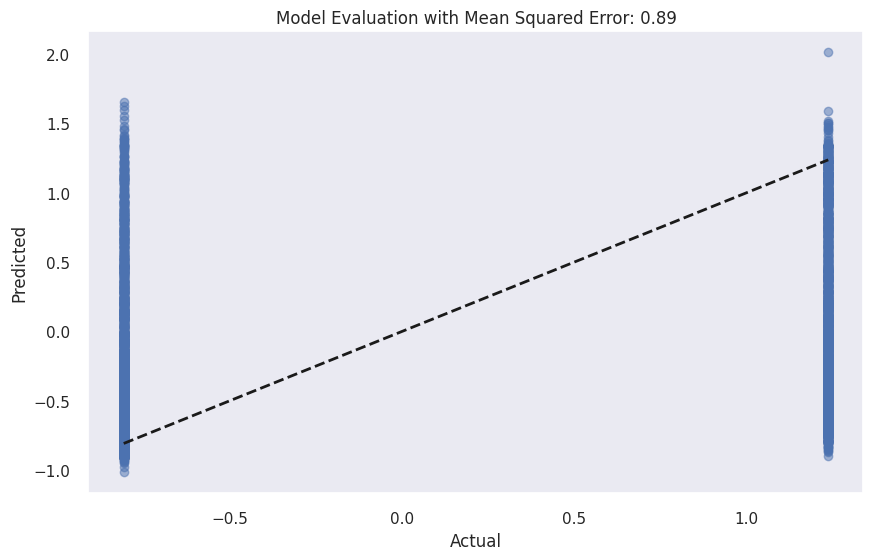

Mean Squared Error: 0.8904110225573254


In [179]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Assuming SV is your trained model, and X_train, y_train are your training data and labels
# Replace 'SV' with the variable name of your trained model

# Predicting on the training data
y_pred = SV.predict(X_train)

# Calculating Mean Squared Error (MSE)
mse = mean_squared_error(y_train, y_pred)

# Plotting the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_pred, alpha=0.5)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)  # Diagonal line
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title(f'Model Evaluation with Mean Squared Error: {mse:.2f}')
plt.show()

print("Mean Squared Error:", mse)

In [180]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score

# Assuming 'X_train' and 'y_train' are already defined in your environment
# If not, you'll need to define these variables with your training data

# Create and fit the DecisionTreeRegressor model with default parameters
DTR = DecisionTreeRegressor()
DTR.fit(X_train, y_train)

# Perform cross-validation and compute the mean score
scores = cross_val_score(DTR, X_train, y_train, cv=10)
mean_score2 = scores.mean()

print("Score:", mean_score2)

Score: -0.46374891731415674


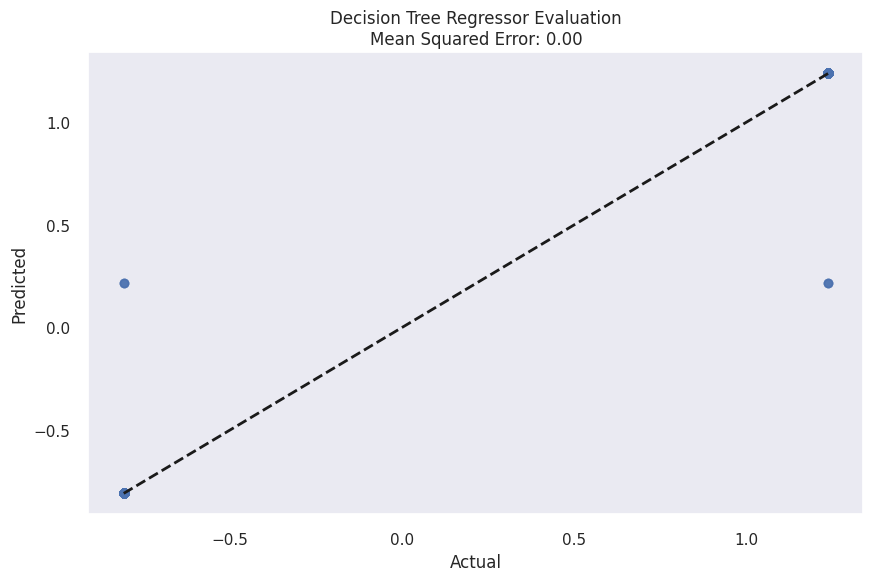

0.001338521551679337

In [181]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Predicting on the training data
y_pred_dtr = DTR.predict(X_train)

# Calculating Mean Squared Error (MSE) for the Decision Tree Regressor
mse_dtr = mean_squared_error(y_train, y_pred_dtr)

# Plotting the actual vs predicted values for the Decision Tree Regressor
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_pred_dtr, alpha=0.5)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)  # Diagonal line
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title(f'Decision Tree Regressor Evaluation\nMean Squared Error: {mse_dtr:.2f}')
plt.show()

mse_dtr

In [182]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

# Assuming 'X_train' and 'y_train' are already defined in your environment
# If not, you'll need to define these variables with your training data

# Create and fit the RandomForestRegressor model with default parameters
RFR = RandomForestRegressor()
RFR.fit(X_train, y_train)

# Perform cross-validation and compute the mean score
scores = cross_val_score(RFR, X_train, y_train, cv=10)
mean_score_rf = scores.mean()

mean_score_rf

0.20727169040890964

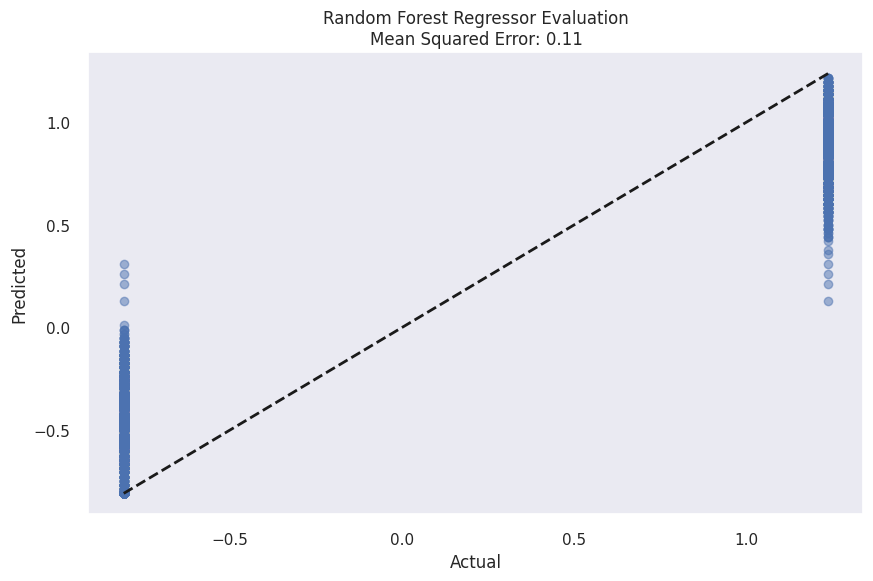

0.1110041374494413

In [183]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Assuming the RandomForestRegressor model 'RFR' is already trained

# Predicting on the training data
y_pred_rfr = RFR.predict(X_train)

# Calculating Mean Squared Error (MSE) for the RandomForest Regressor
mse_rfr = mean_squared_error(y_train, y_pred_rfr)

# Plotting the actual vs predicted values for the RandomForest Regressor
plt.figure(figsize=(10, 6))
plt.scatter(y_train, y_pred_rfr, alpha=0.5)
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'k--', lw=2)  # Diagonal line
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title(f'Random Forest Regressor Evaluation\nMean Squared Error: {mse_rfr:.2f}')
plt.show()

mse_rfr

In [184]:
params ={
    'n_estimators': [100, 500, 1000],
    'max_depth': [5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]                          #bootstrap: Whether to bootstrap samples when building trees.
}
random_search = RandomizedSearchCV(
    estimator=RFR,
    param_distributions=params,
    n_iter=10,                                 # Number of random combinations to try
    cv=10,                                     # Number of cross-validation folds
    scoring="neg_mean_squared_error",          # Scoring metric
    n_jobs=-1,                                 # Use all available CPU cores
    random_state=42
)
random_search.fit(X_train, y_train)

RandomizedSearchCV(cv=10, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'max_depth': [5, 10, 20],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 500, 1000]},
                   random_state=42, scoring='neg_mean_squared_error')

In [185]:
random_search_rf_results = pd.concat([pd.DataFrame(random_search.cv_results_["params"]),pd.DataFrame(random_search.cv_results_["mean_test_score"], columns=["neg_mean_squared_error"])],axis=1)
random_search_rf_contour = random_search_rf_results.groupby(['max_depth','n_estimators']).mean()
random_search_rf_contour

min_samples_split  min_samples_leaf  \
max_depth n_estimators                                        
5         100                        3.00              2.33   
          500                        4.00              2.33   
10        100                        5.00              1.00   
          500                        3.50              1.00   
20        500                       10.00              2.00   

                        neg_mean_squared_error  
max_depth n_estimators                          
5         100                            -0.74  
          500                            -0.74  
10        100                            -0.75  
          500                            -0.75  
20        500                            -0.77

In [186]:
RF = RandomForestRegressor(max_depth=40, max_features='log2', n_estimators=1000) 
RF.fit(X_train , y_train)
scores = cross_val_score(RF, X_train, y_train, cv=10)
print(scores)
print("\n mean of the Scores :" , scores.mean())

[0.22839091 0.21779226 0.19248434 0.24943764 0.2576569  0.25008175
 0.25557927 0.19956719 0.21345268 0.18564725]

 mean of the Scores : 0.22500901913514632


In [187]:
#np.set_printoptions(threshold=np.inf)
predict = RF.predict(dataset_test)
min = np.amin(predict)
max = np.amax(predict)
range = np.ptp(predict)
mean = np.mean(predict)
median = np.median(predict)
 
print("min =", min)
print("max =", max)
print("Median =", median)
print("Mean =", mean)
print("range =", range)
print("\nprediction =", predict)

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:493: FutureWarning:

The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- user_id




ValueError: X has 29 features, but RandomForestRegressor is expecting 28 features as input.